# Preambule

In [1]:
%%capture
import matplotlib.pyplot as plt
import numpy as np
import cv2

try:
    cv2.setNumThreads(0)
except:
    
    print ("did not set the number of threads")
    pass

from caiman import movie
# import matplotlib
# matplotlib.get_backend()

import os
# %matplotlib inline
%config InlineBackend.figure_format = 'retina'

from sys import path as syspath
syspath.append("/Users/srdjan/Documents/Physio_Ca/functions/")
from physio_def_1 import *
syspath.append("/Users/srdjan/Seafile/functions/")
from general_functions import autocorr
from matplotlib.colors import LogNorm
import pandas as pd
from itertools import product
from collections import OrderedDict
# from pandas import read_csv, to_numeric

In [2]:
protocol = pd.read_csv("/Users/srdjan/Downloads/Experiment_protocols - List 1.csv")
for col in ["pH","frequency","glucose"]:
    protocol[col+"_"] = pd.to_numeric(protocol[col],errors="coerce")
protocol.treatment = protocol.treatment.astype(str)
for col in ["mouse","sex"]:
    del protocol[col]

In [3]:
df = protocol.query("glucose_<=8 and resolution!='line scan'").copy()
df = df[["leica" in m.lower() for m in df.microscope]].copy()
for k in ["resolution","frequency","frequency_",
#           "magnification","treatment"
         ]:
    del df[k]
    

for ix,row in df.iterrows():
    exp, ser = row.experiment.split("_")
    ser = ser.split()[0]
    serDir = f"/Volumes/physio/team/slakrupnik/project/experiments/Sandra/{row.date}/{exp}/"
    if os.path.isdir(serDir):
        fs = [f for f in os.listdir(serDir) if ser in f and "txt" in f]
        if len(fs)==0:
            print (f"could not find {ser} metadata file in {serDir}. Check manually if you need, I'll continue.")
            continue
        if len(fs)>1:
            raise ValueError(f" found two files that have the form indicating they contain metadata for {f}. Please sort out manually and restart parsing.")
        f = fs[0]
        add = pd.read_csv(serDir+f)
        for k in add.columns:
            df.loc[ix,k] = add[k][0]
        df.loc[ix,"filename"] = f.split(".")[0]


could not find Series061 metadata file in /Volumes/physio/team/slakrupnik/project/experiments/Sandra/2019_10_15/Experiment38b/. Check manually if you need, I'll continue.
could not find Series004 metadata file in /Volumes/physio/team/slakrupnik/project/experiments/Sandra/2019_11_13/Experiment42a/. Check manually if you need, I'll continue.
could not find Series006 metadata file in /Volumes/physio/team/slakrupnik/project/experiments/Sandra/2019_11_21/Experiment43b/. Check manually if you need, I'll continue.
could not find Series007 metadata file in /Volumes/physio/team/slakrupnik/project/experiments/Sandra/2019_11_21/Experiment43b/. Check manually if you need, I'll continue.
could not find Series008 metadata file in /Volumes/physio/team/slakrupnik/project/experiments/Sandra/2019_11_21/Experiment43b/. Check manually if you need, I'll continue.
could not find Series012 metadata file in /Volumes/physio/team/slakrupnik/project/experiments/Sandra/2019_11_21/Experiment43b/. Check manually if

In [4]:
df["Tmax"] = df["T"]/df.freq
tmpdf = df.query("freq>12")
tmpdf = tmpdf.sort_values("Tmax",ascending=False)

In [5]:
from IPython.display import display,HTML

In [6]:
for ph,ddf in tmpdf.query("microscope=='Leica upright'").groupby("pH_"):
    display(HTML(f' <span style="color:darkred"> <hr> <b> ph={ph} </b> </h1> </span>  '))
    iis = list(range(ddf.shape[1]))
    iis = iis[:2]+iis[-1:]+iis[2:-1]
    display(ddf.iloc[:,iis])

,date,experiment,Tmax,microscope,magnification,pH,glucose,treatment,comments,Slice number,pH_,glucose_,T,X,Y,freq,pxSize,pxUnit,filename,Unnamed: 0
228,2019_10_16,Experiment39a_Series022,312.058866,Leica upright,20x,7.1,8,nan,NaN,3.0,7.1,8.0,26300.0,128.0,128.0,84.278971,3.418688,µm,Experiment39a_11_Series022,NaN
217,2019_10_15,Experiment38b_Series043,307.273865,Leica upright,20x,7.1,8,nan,NaN,6.0,7.1,8.0,25895.0,128.0,128.0,84.273357,3.418688,µm,Experiment38b_13_Series043,0.0
209,2019_10_15,Experiment38a_Series019,303.428861,Leica upright,20x,7.1,8,nan,NaN,2.0,7.1,8.0,25581.0,128.0,128.0,84.306417,2.137757,µm,Experiment38a_10_Series019,NaN
234,2019_10_16,Experiment39a_Series031,301.389863,Leica upright,20x,7.1,8,nan,NaN,4.0,7.1,8.0,25407.0,128.0,128.0,84.299451,2.446350,µm,Experiment39a_18_Series031,NaN


,date,experiment,Tmax,microscope,magnification,pH,glucose,treatment,comments,Slice number,pH_,glucose_,T,X,Y,freq,pxSize,pxUnit,filename,Unnamed: 0
212,2019_10_15,Experiment38a_Series040 250k time points,2584.462095,Leica upright,20x,7.4,6,Caffeine 10 mM,NaN,3.0,7.4,6.0,256000.0,128.0,64.0,99.053494,2.099880,µm,Experiment38a_18_Series040,NaN
204,2019_10_14,Experiment37_Series010,1355.189864,Leica upright,20x,7.4,6,tolbutamide 50uM in 6 glucose at 11:12:019 swi...,NaN,2.0,7.4,6.0,114238.0,128.0,128.0,84.296675,1.936065,µm,Experiment37_5_Series010,NaN
202,2019_10_14,Experiment37_Series006,897.580865,Leica upright,20x,7.4,6,Caffeine 10 mM,NaN,1.0,7.4,6.0,75650.0,128.0,128.0,84.282100,2.556042,µm,Experiment37_2_Series006,NaN
203,2019_10_14,Experiment37_Series007,735.278863,Leica upright,20x,7.4,6,nifedipine 200uM,NaN,1.0,7.4,6.0,61971.0,128.0,128.0,84.282309,2.556042,µm,Experiment37_3_Series007,NaN
207,2019_10_15,Experiment38a_Series016,359.434861,Leica upright,20x,7.4,8,nan,NaN,2.0,7.4,8.0,30304.0,128.0,128.0,84.310130,2.137757,µm,Experiment38a_7_Series016,NaN
232,2019_10_16,Experiment39a_Series029,309.868863,Leica upright,20x,7.4,8,nan,NaN,4.0,7.4,8.0,26122.0,128.0,128.0,84.300177,2.446350,µm,Experiment39a_16_Series029,NaN
226,2019_10_16,Experiment39a_Series020,303.178865,Leica upright,20x,7.4,8,nan,NaN,3.0,7.4,8.0,25552.0,128.0,128.0,84.280281,3.418688,µm,Experiment39a_9_Series020,NaN
215,2019_10_15,Experiment38b_Series041,302.465867,Leica upright,20x,7.4,8,nan,NaN,6.0,7.4,8.0,25488.0,128.0,128.0,84.267360,3.418688,µm,Experiment38b_11_Series041,0.0


,date,experiment,Tmax,microscope,magnification,pH,glucose,treatment,comments,Slice number,pH_,glucose_,T,X,Y,freq,pxSize,pxUnit,filename,Unnamed: 0
236,2019_10_16,Experiment39a_Series034,315.849862,Leica upright,20x,7.7,8,nan,NaN,4.0,7.7,8.0,26626.0,128.0,128.0,84.299546,2.446350,µm,Experiment39a_20_Series034,NaN
219,2019_10_15,Experiment38b_Series045,303.992865,Leica upright,20x,7.7,8,nan,NaN,6.0,7.7,8.0,25619.0,128.0,128.0,84.275004,3.418688,µm,Experiment38b_15_Series045,0.0
211,2019_10_15,Experiment38a_Series021,301.651861,Leica upright,20x,7.7,8,nan,NaN,2.0,7.7,8.0,25431.0,128.0,128.0,84.305795,2.137757,µm,Experiment38a_12_Series021,NaN
230,2019_10_16,Experiment39a_Series024,291.652866,Leica upright,20x,7.7,8,nan,NaN,3.0,7.7,8.0,24580.0,128.0,128.0,84.278273,3.418688,µm,Experiment39a_13_Series024,NaN


In [7]:
# row = tmpdf.iloc[0]
row = tmpdf.loc[207]   # no waves
# row = tmpdf.loc[186] # waves
# row = tmpdf.loc[177] # waves
# row = tmpdf.loc[189] # waves
# row = tmpdf.loc[]

pd.DataFrame(row).T.iloc[:,iis]

,date,experiment,Tmax,microscope,magnification,pH,glucose,treatment,comments,Slice number,pH_,glucose_,T,X,Y,freq,pxSize,pxUnit,filename,Unnamed: 0
207,2019_10_15,Experiment38a_Series016,359.435,Leica upright,20x,7.4,8,nan,NaN,2,7.4,8,30304,128,128,84.3101,2.13776,µm,Experiment38a_7_Series016,NaN


In [15]:
from numeric import * # runningAverage, runningStd, percFilter, lowPass, getInterestingROIcenters
from matplotlib.colors import LogNorm
from collections import Counter

# Importing

In [8]:
# npzFile = "/Users/srdjan/Documents/Physio_Ca/data/Experiment39e_2_Series012.npz"
# npzFile = f"/Volumes/physio/team/slakrupnik/project/experiments/MB/Viljem02122019/Experiment3/Experiment3_65_Series081.npz"
npzFile = f"/Volumes/physio/team/slakrupnik/project/experiments/Sandra/{row.date}/{row.filename.split('_')[0]}/{row.filename}.npz"
metadata = pd.read_csv(npzFile.replace("npz","txt")).loc[0]
metadata

T           30304
X             128
Y             128
freq      84.3101
pxSize    2.13776
pxUnit         µm
Name: 0, dtype: object

In [9]:
metadata["T"]/metadata.freq/60

5.99058102177609

In [10]:
npzData = np.load(npzFile)
orig_images = npzData["data"]
m_orig = movie(orig_images)
m_orig = m_orig.astype(float)

In [11]:
time = npzData["time"]
m_orig.fr = metadata.freq
print (time.max()/60)
allTrace = m_orig.mean((1,2))
Nsatur = np.sum(m_orig>m_orig.max()-1, axis=(1,2))

5.990383338928223


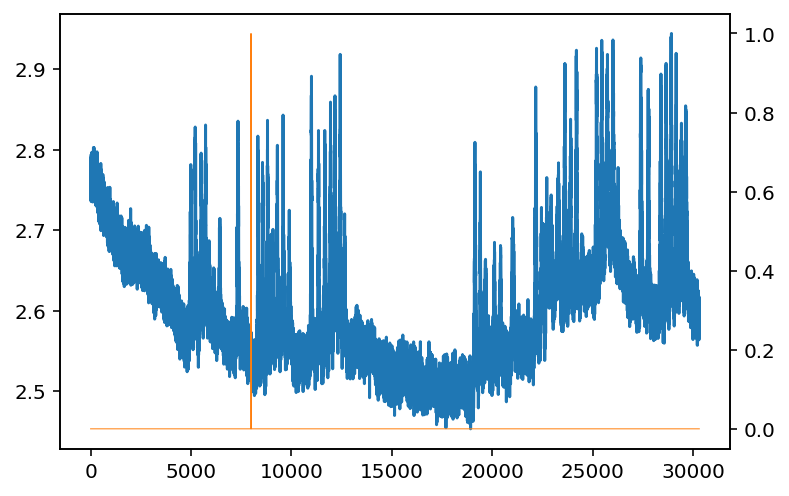

In [12]:
plt.plot(allTrace)
plt.twinx()
plt.plot(Nsatur,"C1",lw=.5)

In [13]:
# check if there are waves
# m_orig[:2000,45:70,40:55].resize(1,1,.5).play(fr=20, magnification=8, q_max=97.)
# m_orig[:1000,-30:,-100:-70].resize(1,1,.5).play(fr=20, magnification=2, q_max=99.9)
# m_orig[:].resize(1,1,.5).play(fr=30, magnification=1, q_max=99.9)

In [14]:
# check if there are waves in the back
# m_orig[-2000:,:,:].resize(1,1,1./2).play(fr=20, magnification=4, q_max=99.7)

## Power Spectrum

Text(0, 0.5, 'power')

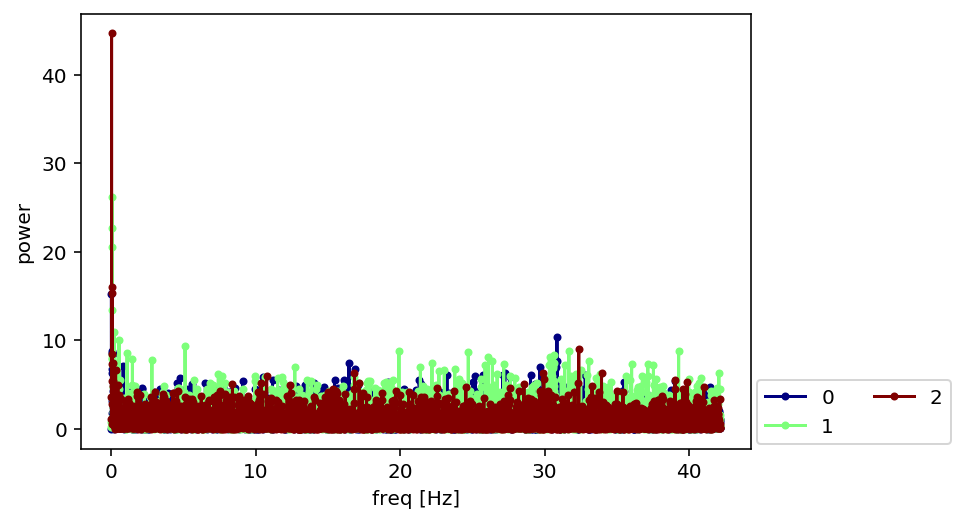

In [34]:
Nchunk = 10000
len(m_orig)//Nchunk*Nchunk

subm = m_orig[:len(m_orig)//Nchunk*Nchunk]
dt = 1./m_orig.fr
nchunk = len(subm)//Nchunk
for j,x in enumerate(subm[:nchunk*Nchunk,22,19].reshape((-1,Nchunk))):

    OU = np.fft.fft(x)
    freqs = np.fft.fftfreq(len(x),dt)
    PowerSpectrum = np.abs(OU)**2

    PowerSpectrum *= (np.sum(x**2)*dt)/(np.sum(PowerSpectrum)*freqs[1])

    N = len(x)

    plt.plot(freqs[:N//2][2:], PowerSpectrum[:N//2][2:],".-",c=plt.cm.jet(j/(nchunk-1)), label=j)
# plt.yscale("log")
plt.legend(ncol=2,loc=(1.01,.01))
# plt.xlim(8,10.9)
plt.xlabel("freq [Hz]")
plt.ylabel("power")

In [35]:
x = m_orig[:10000,22,19]

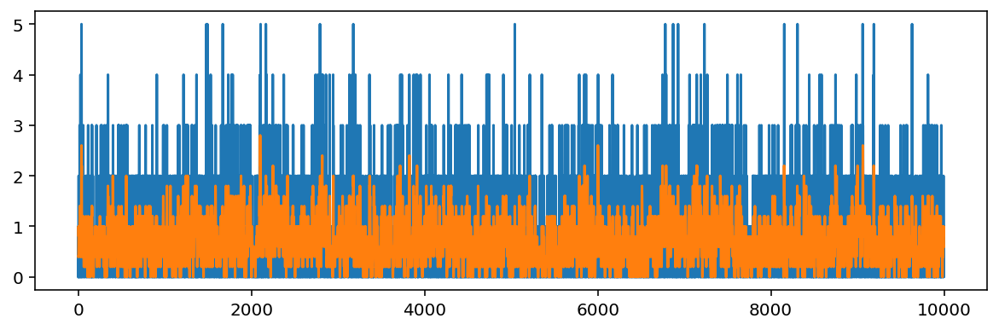

In [37]:
plt.figure(figsize=(10,3))
plt.plot(x)
plt.plot(runningAverage(x,5))

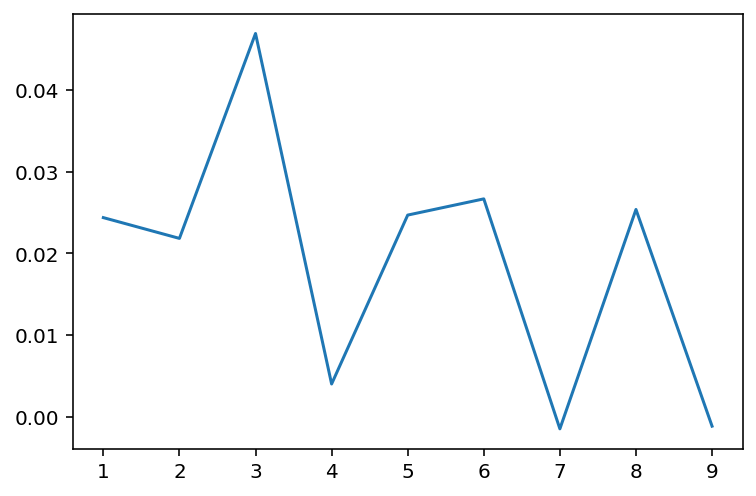

In [38]:
tr = np.arange(1,10)
plt.plot(tr,autocorr(x,tr))

# average to save time and memory, especially if there are waves

In [31]:
newFreq = 30
tWin = int(np.ceil(m_orig.fr/newFreq))
newFreq = m_orig.fr/tWin
newFreq,tWin

(28.103376774902785, 3)

In [32]:
print("New period will be %.1fms"%(1000./newFreq))

New period will be 35.6ms


In [33]:
m_resized = m_orig.resize(1,1,newFreq/m_orig.fr)*tWin

In [34]:
# m_resized.play(fr=40,magnification=4)

In [35]:
# m_resized[::-1].play(fr=40,magnification=4)

In [36]:
m_orig = m_resized.copy()
del m_resized

In [37]:
# m_orig.play(fr=400,magnification=2)

# First glimpse analysis

## basic

In [16]:
meanImg = m_orig.mean(0)
stdImg  = m_orig.std (0)

(-0.19903365726091282, 11.35183526079919)

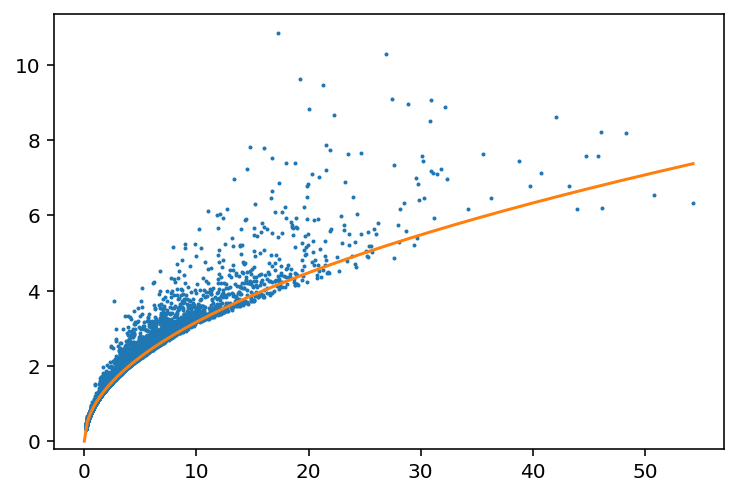

In [17]:
plt.plot(meanImg.flatten(),stdImg.flatten(),".",ms=2)
yl = plt.ylim()
# plt.xscale("log")
# plt.ylim(-2,2)
xr = np.linspace(0,meanImg.max(),200)
plt.plot(xr,xr**.5)
plt.ylim(yl)

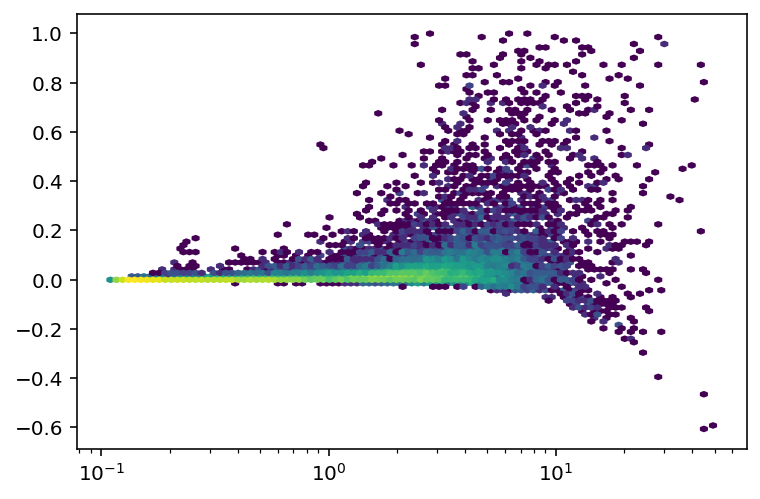

In [18]:
x,y = meanImg.flatten(),stdImg.flatten()-meanImg.flatten()**.5
x = x[y<1]
y = y[y<1]
x = x[y>-1]
y = y[y>-1]
plt.hexbin(x,y,xscale="log",
#            norm=LogNorm(),
           bins="log",
           mincnt=1)
# plt.xscale("log")
# plt.ylim(-2,2)

In [19]:
%%capture
cc = m_orig.resize(1,1,1/5).local_correlations(eight_neighbours=True,swap_dim=False)

In [20]:
dm_orig = np.diff(m_orig,axis=0)
meanDimg = dm_orig.mean(0)
stdDimg  = dm_orig.std(0)

In [105]:
%%capture
ccd_orig = dm_orig.resize(1,1,1/5).local_correlations(eight_neighbours=True,swap_dim=False)

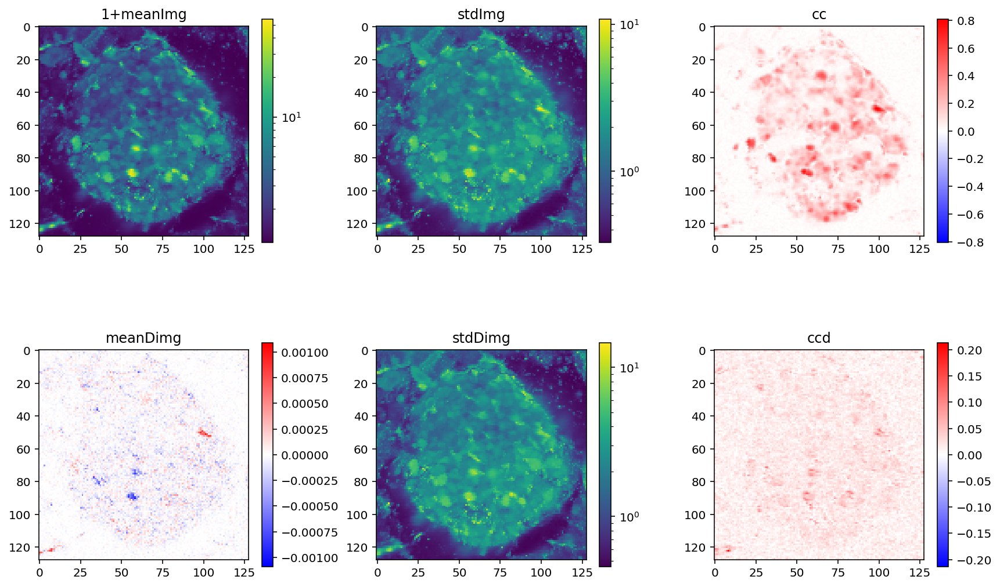

In [22]:
fig, axs = plt.subplots(2,3,figsize=(12,8))

for ax,mt in zip(axs.flat,["1+meanImg", "stdImg", "cc", "meanDimg", "stdDimg", "ccd_orig"]):
    ax.set_title(mt)
    try:
        m = eval(mt)
    except:
        continue
    if np.any(m<0) or 'cc' in mt:
        im = ax.imshow(m,cmap="bwr",vmax=np.abs(m).max(),vmin=-np.abs(m).max())
    else:
        im = ax.imshow(m,norm=LogNorm())
    plt.colorbar(im,ax=ax,shrink=.7)
fig.tight_layout()

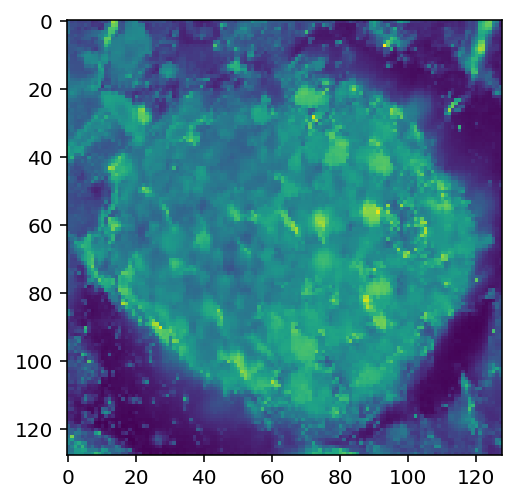

In [23]:
blurredWeights = cv2.GaussianBlur(stdDimg,(5,5),.1)
plt.imshow(blurredWeights.T,norm=LogNorm())

In [24]:
# plt.hist(np.log(blurredWeights.flatten()),100,histtype="step");

## Choose interesting by crawling

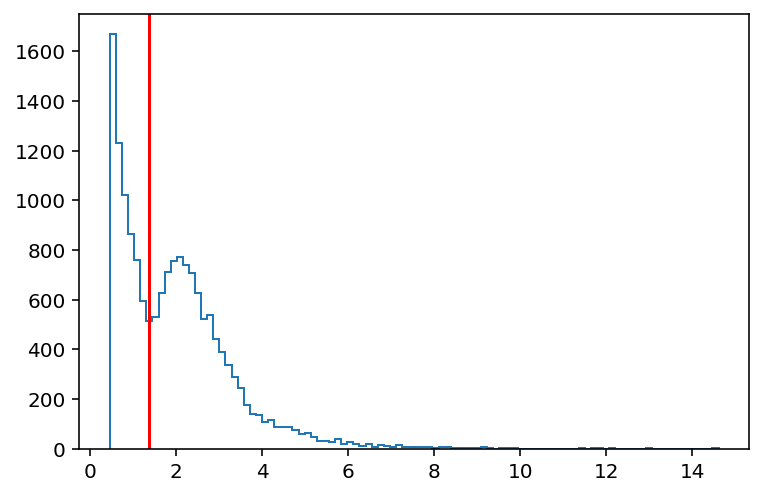

In [26]:
h,e,_ =plt.hist(blurredWeights.flatten(),100,histtype="step");
# plt.hist(stdDimg.flatten(),50,histtype="step");
th = e[np.where(np.diff(np.diff(h)<0))[0][0]+1:][:2].mean()
plt.axvline(th,color="r")

In [27]:
def climb(x,blurredWeights):
    dims = blurredWeights.shape
    # x = (60,60)
    x = x+(blurredWeights[x[0],x[1]],)
    xs = [x]
    # vs = pd.DataFrame(columns=["i","j","v"])
    for i in range(10):
        vs = []
        for di,dj in product([-1,0,1],[-1,0,1]):
            i,j = x[0]+di,x[1]+dj
            if i<0 or i>=dims[0] or j<0 or j>=dims[1]:
#                 print ("skipping")
                continue
        #     vs = vs.append({"i":i,"j":j,"v":blurredWeights[i,j]},ignore_index=True)
            vs += [(i,j,blurredWeights[i,j])]

        x1 = vs[np.argmax(vs,axis=0)[-1]]
        if x1[-1]<=x[-1]:
            break
        else:
            x = x1
            xs += [x]
    return x[:2]

In [585]:
def crawlDict(image, th=0):
    A_ = [(i,j)+climb((i,j),image) for i,j in product(range(image.shape[0]),range(image.shape[1])) if image[i,j]>th]
    B_ = OrderedDict()
    for (i0,j0,i1,j1) in A_:
        if (i1,j1) not in B_:
            B_[(i1,j1)] = []
        B_[(i1,j1)] += [(i0,j0)]
    return B_

In [977]:
testImage = blurredWeights[40:70,40:70]

In [978]:
B = crawlDict(testImage,th=th)

In [979]:
%matplotlib inline

In [980]:
dround = np.vstack([
    (-1,-1),
    (-1, 1),
    ( 1, 1),
    ( 1,-1),
    (-1,-1),
])
tmp = [(dx,dy) for dx,dy in dround]
# tmp += [tmp[0]]
dedges = []
for el in zip(tmp[:-1],tmp[1:]):
    el = np.array(el)+1
    el = np.vstack(sorted(el,key=np.linalg.norm))-1
#     dedges += [tuple(map(tuple,el*.5))]
    dedges += [el*.5]

dedges = np.stack(dedges)

In [981]:
# for el in dedges:
#     plt.plot(*np.vstack(el).T)

In [982]:
toBreak = False
edgeID = OrderedDict()
for k in B:
    for x,y in B[k]:
        edges = dedges.copy()
        edges[...,0] += x
        edges[...,1] += y
        for edge in edges.reshape((-1,4)):
            edge = tuple(edge)
            if edge not in edgeID:
                edgeID[edge] = []
            edgeID[edge] += [k]
            if len(edgeID[edge])==2 and edgeID[edge][0]==edgeID[edge][1]:
                del edgeID[edge]
#         if len(nodeID[edge])==4:
#             if np.all([nodeID[node][j]==nodeID[node][0] for j in range(1,4)]):
#                 del nodeID[node]
# #                 print (nodeID[node])
# #                 toBreak = True
# #                 break
# #     if toBreak:
# #         break
#         toBreak = True
#         break
#     if toBreak: break
# if toBreak: break

In [983]:
invEdgeID = OrderedDict()
for k in edgeID:
    for p in edgeID[k]:
        if p not in invEdgeID:
            invEdgeID[p] = []
        invEdgeID[p] += [k]

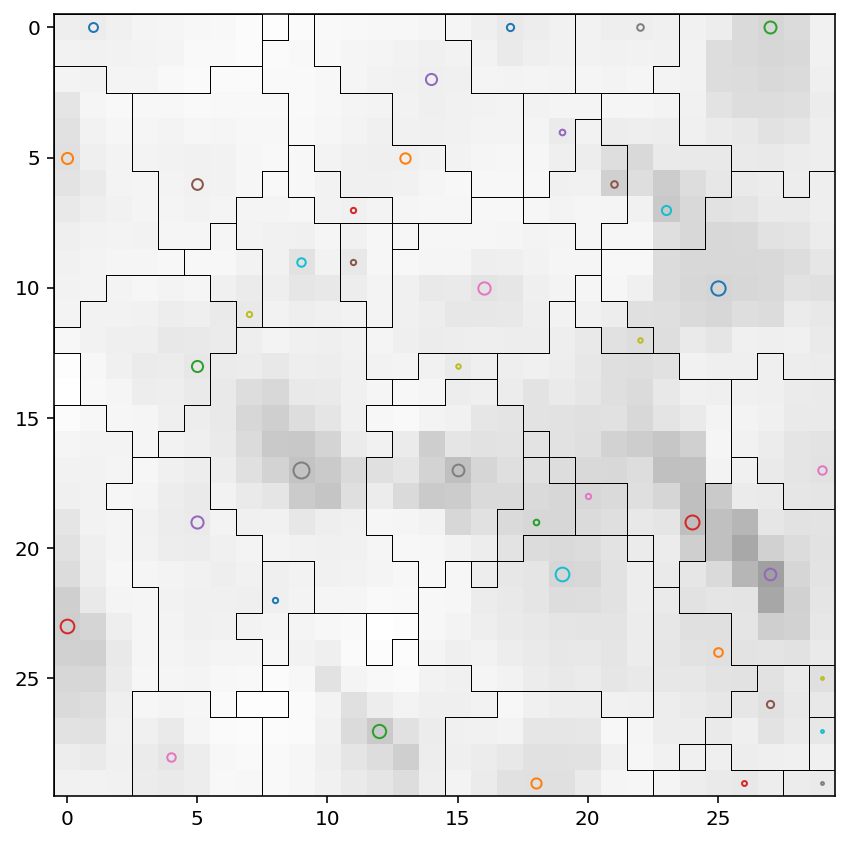

In [984]:
plt.figure(figsize=(7,8))
ax = plt.subplot(111)
ax.imshow(testImage.T,cmap="Greys",norm=LogNorm(),vmax=testImage.max()*10)

ks = list(B.keys())[::1]
for ik,k in enumerate(ks):
    c = plt.plot([])[0].get_color()
#     for el in B[k]:
#         plt.plot([el[0],k[0]],[el[1],k[1]],lw=.3,c=c)
#     for el in invEdgeID[k]:
#         x,y = np.array(el).reshape((2,2)).T
#         plt.plot(x,y,"k")
    x,y = k # np.mean(B[k],axis=0)
    plt.plot(x,y,"o",ms=1*len(B[k])**.5,mfc="none",c=c)
for el in np.unique(sum([invEdgeID[k] for k in ks],[]), axis=0):
    x,y = np.array(el).reshape((2,2)).T
    plt.plot(x,y,"k",lw=.5)
ax.set_aspect("equal")

In [894]:
metadata

T           30304
X             128
Y             128
freq      84.3101
pxSize    2.13776
pxUnit         µm
Name: 0, dtype: object

### Similar with nodes (didn't lead anywhere)

In [651]:
toBreak = False
nodeID = OrderedDict()
for k in B:
    nodes = sum([[(x+dx,y+dy) for dx,dy in product([-.5,.5],[-.5,.5])] for x,y in B[k]],[])
    for node in nodes:
        if node not in nodeID:
            nodeID[node] = []
        nodeID[node] += [k]
        if len(nodeID[node])==4:
            if np.all([nodeID[node][j]==nodeID[node][0] for j in range(1,4)]):
                del nodeID[node]
#                 print (nodeID[node])
#                 toBreak = True
#                 break
#     if toBreak:
#         break

In [652]:
invNodeID = OrderedDict()
for k in nodeID:
    for p in nodeID[k]:
        if p not in invNodeID:
            invNodeID[p] = []
        invNodeID[p] += [k]

In [684]:
refvec = [0, 1]

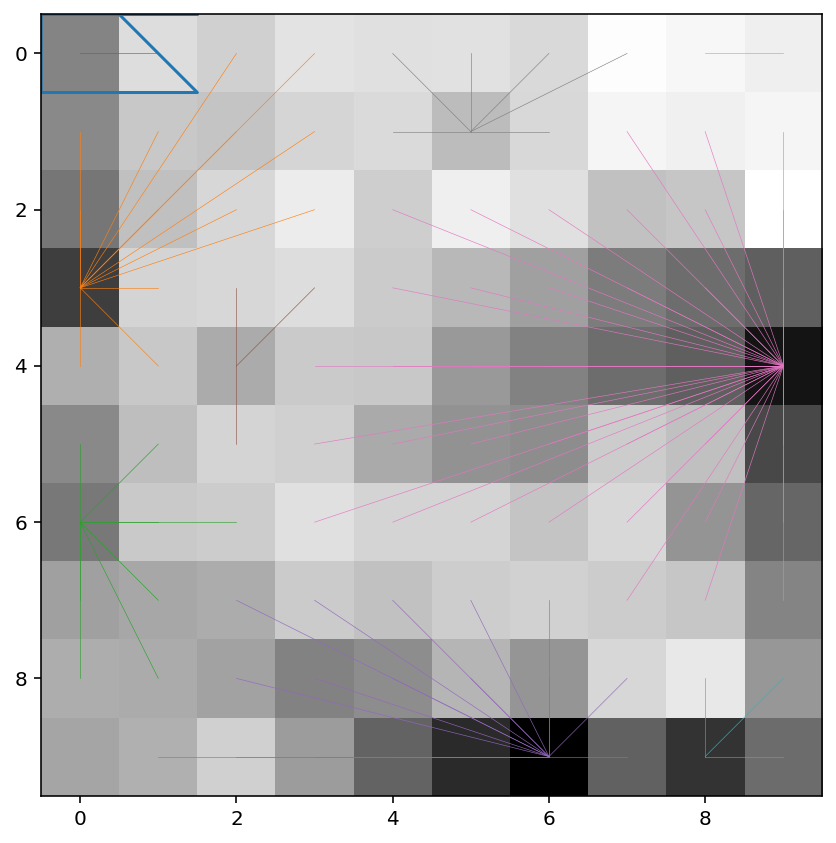

In [685]:
plt.figure(figsize=(7,8))
ax = plt.subplot(111)
ax.imshow(testImage.T,cmap="Greys",norm=LogNorm())
lim = plt.xlim(),plt.ylim()
ks = list(B.keys())
for ik,k in enumerate(ks[::1]):
    c = plt.plot([])[0].get_color()
    for el in B[k]:
        plt.plot([el[0],k[0]],[el[1],k[1]],lw=.3,c=c)
#     plt.plot(np.array(B[k]).T[0], np.array(B[k]).T[1],"s",c=c,alpha = 1,ms=15,mfc="none")
#     if ik>=0:
ax.set_aspect("equal")


for k in invNodeID:
#     x,y = np.vstack(invNodeID[k]).T
#     plt.plot(x,y,".")
    
    pts = np.vstack(invNodeID[k])
    origin = pts[np.argmin(np.linalg.norm(pts,axis=1))]

    # x,y = np.array(pts).T
    # plt.plot(x,y,".")
    x,y = np.array(sorted(pts, key=clockwiseangle_and_distance)+[origin]).T
    plt.plot(x,y,"-")
    break

In [701]:
pts = [[2,3], [5,2],[4,1],[3.5,1],[1,2],[2,1],[3,1],[3,3],[4,3]]

def clockwiseangle_and_distance(point):
    import math
    # Vector between point and the origin: v = p - o
    vector = [point[0]-origin[0], point[1]-origin[1]]
    # Length of vector: ||v||
    lenvector = math.hypot(vector[0], vector[1])
    # If length is zero there is no angle
    if lenvector == 0:
        return -math.pi, 0
    # Normalize vector: v/||v||
    normalized = [vector[0]/lenvector, vector[1]/lenvector]
    dotprod  = normalized[0]*refvec[0] + normalized[1]*refvec[1]     # x1*x2 + y1*y2
    diffprod = refvec[1]*normalized[0] - refvec[0]*normalized[1]     # x1*y2 - y1*x2
    angle = math.atan2(diffprod, dotprod)
    # Negative angles represent counter-clockwise angles so we need to subtract them 
    # from 2*pi (360 degrees)
    if angle < 0:
        return 2*math.pi+angle, lenvector
    # I return first the angle because that's the primary sorting criterium
    # but if two vectors have the same angle then the shorter distance should come first.
    return angle, lenvector

In [715]:
pts = np.vstack(invNodeID[k])
origin = pd.DataFrame(pts+.5).sort_values([0,1]).loc[0].values-.5

In [717]:
pts

[array([-0.5, -0.5]),
 array([-0.5,  0.5]),
 array([0.5, 0.5]),
 array([0.5, 0.5]),
 array([1.5, 0.5]),
 array([ 0.5, -0.5]),
 array([ 0.5, -0.5]),
 array([ 1.5, -0.5]),
 array([-0.5, -0.5])]

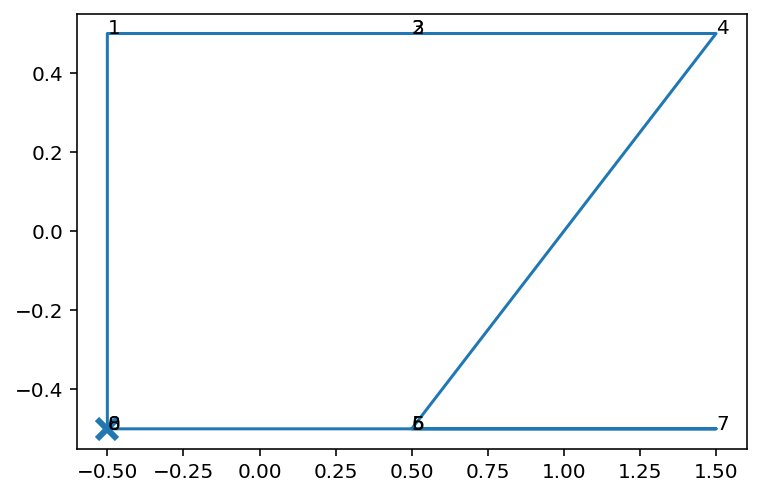

In [716]:
# origin = pts[np.argmin(np.linalg.norm(pts,axis=1))]
refvec = [0, 1]
# x,y = np.array(pts).T
# plt.plot(x,y,".")
pts = sorted(pts, key=clockwiseangle_and_distance)+[origin]
for j,(x,y) in enumerate(pts):
    plt.text(x,y,j)
x,y = np.array(pts).T
plt.plot(x,y,"-")
plt.plot(origin[0],origin[1],"C0x",ms=10,mew=3)

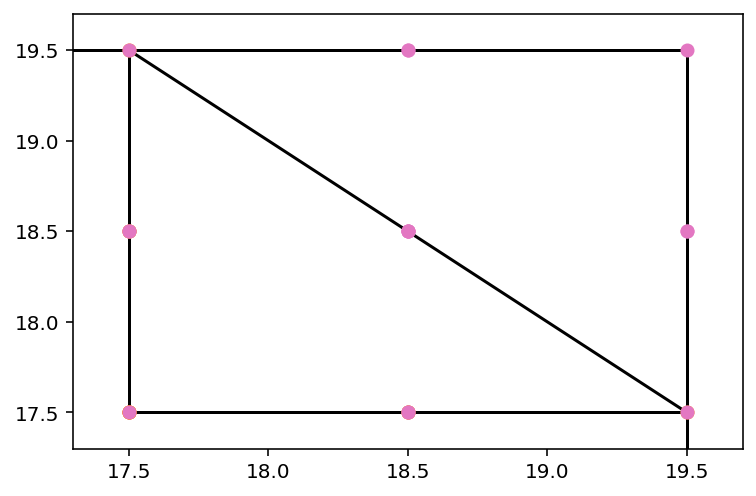

In [620]:
ax = plt.subplot()
for k in B:
    pts = np.vstack(sum([[(x+dx,y+dy) for dx,dy in product([-.5,.5],[-.5,.5])] for x,y in B[k]],[]))
    ch = ConvexHull(pts)
    x,y = pts.T
    convex_hull_plot_2d(ch,ax=ax)

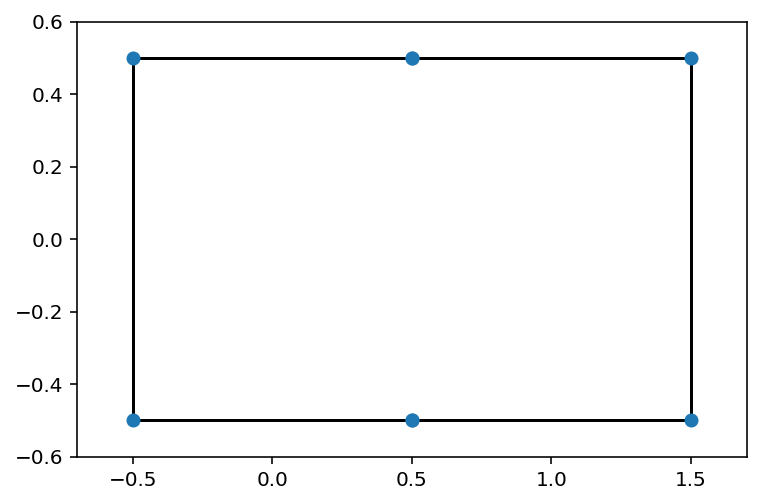

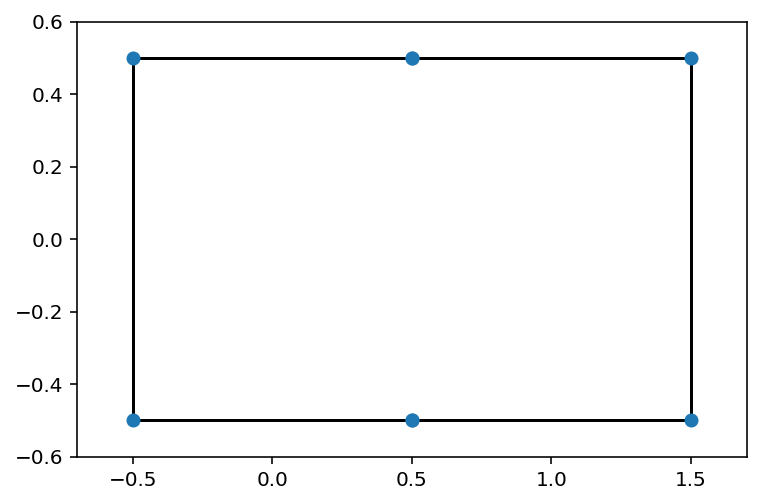

In [618]:

# for x,y in B[k]:
# for x,y in C.loc[C["size"].idxmax()].hood:

# ax.plot(x,y,".",mfc="grey",alpha = .3,ms=10)
convex_hull_plot_2d(ch,ax=ax)

In [566]:
from scipy.spatial import ConvexHull, convex_hull_plot_2d

In [ ]:
[(x,y) for x,y in C.loc[C["size"].idxmax()].hood]

In [569]:
ch = ConvexHull()

In [571]:

# (ch,)

### Define dataframe

In [985]:
C = pd.DataFrame([],index=np.arange(len(B)))
C["peak"] = B.keys()
C["pixels"] = B.values()
C["center"] = [np.mean(C.loc[i,"pixels"], axis=0) for i in C.index]
C["size"] = list(map(len,C["pixels"]))
cnt = Counter(C['size'])
cnt = OrderedDict([(k,cnt[k]) for k in sorted(cnt.keys())])
len(C)

40

In [951]:
# ! pip install bidict

In [986]:
from bidict import bidict

In [987]:
peak2idx = bidict([(peak,j) for j,peak in zip(C.index,C.peak)])

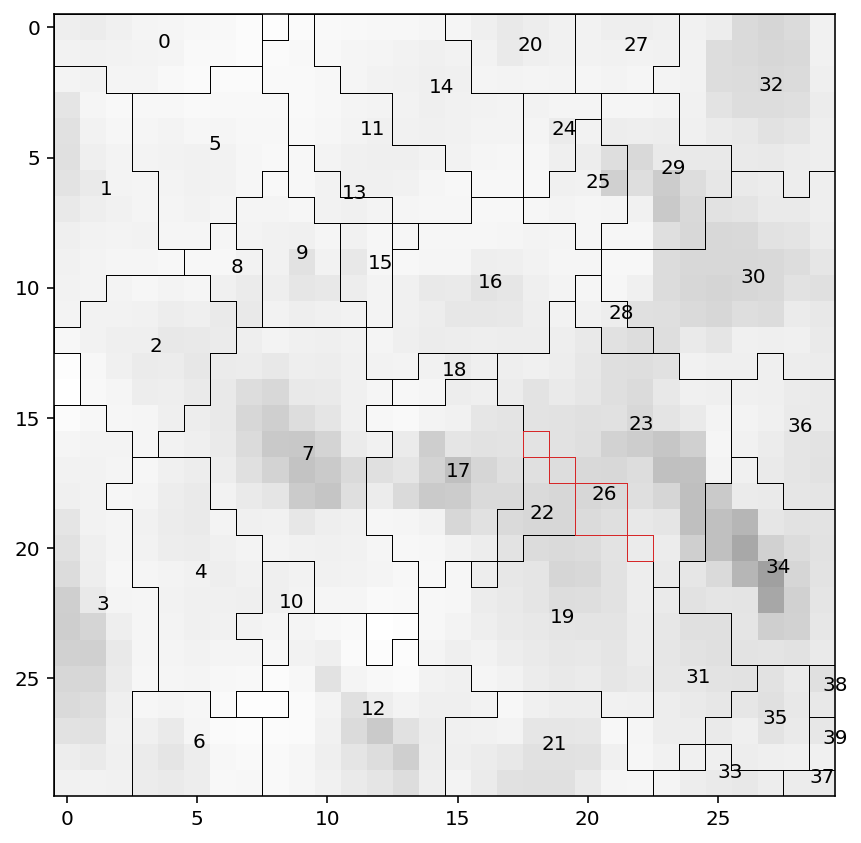

In [999]:
plt.figure(figsize=(7,8))
ax = plt.subplot(111)
ax.imshow(testImage.T,cmap="Greys",norm=LogNorm(),vmax=testImage.max()*10)

for i in C.index[:]:
    c = plt.plot([])[0].get_color()
    x,y = np.mean(C.loc[i,"pixels"],axis=0)
    plt.text(x,y,i)
for el in np.unique(sum([invEdgeID[k] for k in ks],[]), axis=0):
    x,y = np.array(el).reshape((2,2)).T
    plt.plot(x,y,"k",lw=.5)
    
for j in [26]:
    for el in invEdgeID[peak2idx.inv[j]]:
        x,y = np.array(el).reshape((2,2)).T
        plt.plot(x,y,"C3",lw=.5)
ax.set_aspect("equal")

In [991]:
Cneighbors = [tuple([]) for i in C.index]

for edge in edgeID:
    if len(edgeID[edge])>1:
        for e1,e2 in [edgeID[edge],edgeID[edge][::-1]]:
            i = peak2idx[e1]
            j = peak2idx[e2]
            if j not in Cneighbors[i]:
                Cneighbors[i] += (j,)

In [1000]:
C["neighbors"] = Cneighbors

In [1001]:
C.loc[i,"neighbors"] 

(35, 37, 38)

In [974]:
C.loc[i,"neighbors"]

640

In [921]:
e1,e2 = edgeID[edge]

In [ ]:

if e1 not in C[e2]:
    C[e1] += [e2]

<ErrorbarContainer object of 3 artists>

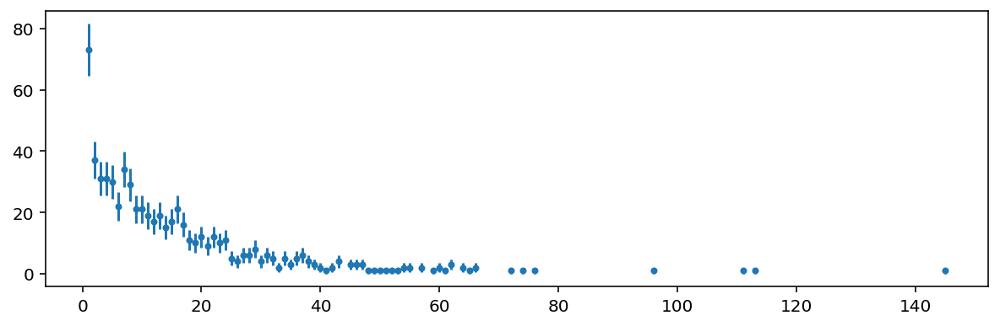

In [34]:
plt.figure(figsize=(10,3))
# plt.bar(cnt.keys(),cnt.values())
plt.errorbar(cnt.keys(),cnt.values(),np.array(list(cnt.values()))**.5,ls="none",marker=".")

In [464]:
(C["size"]>10).sum()

320

In [151]:
C.columns

Index(['center', 'hood', 'size', 'trace'], dtype='object')

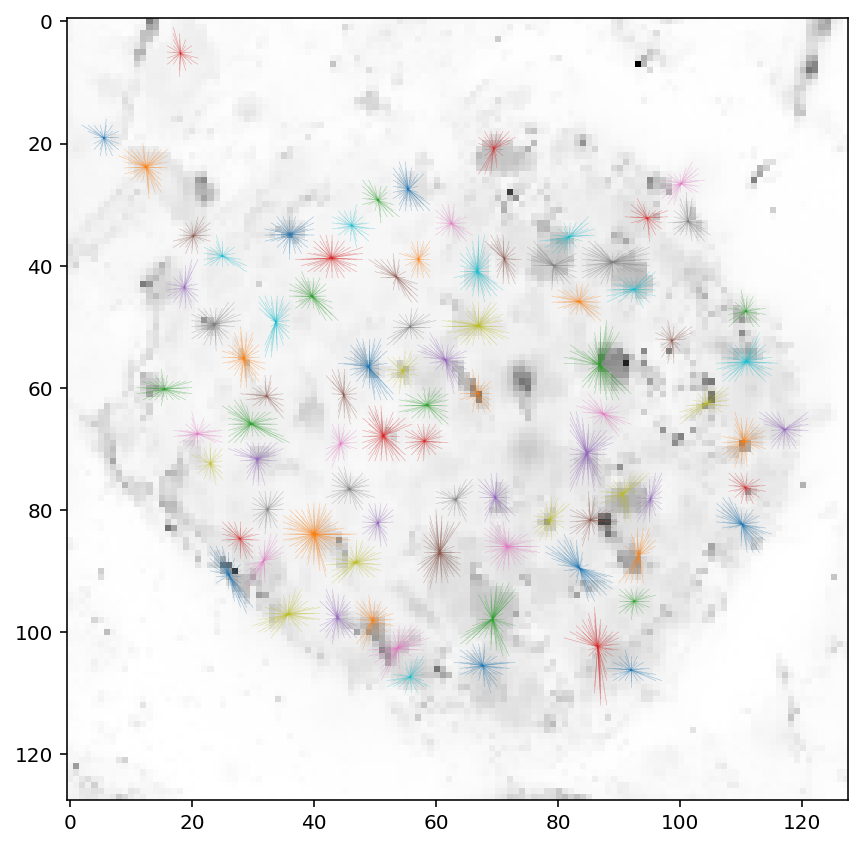

In [157]:
plt.figure(figsize=(7,8))
ax = plt.subplot(111)
ax.imshow(blurredWeights.T,cmap="Greys",)

for j in C.query("50<size<100").index:
    c = plt.plot([])[0].get_color()
    # k = C.loc[j,"center"]
    k = np.mean(C.loc[j,"hood"], axis=0)
    for el in C.loc[j,"hood"]:
        plt.plot([el[0],k[0]],[el[1],k[1]],lw=.3,c=c,alpha = .4)
ax.set_aspect("equal")

In [35]:
C["trace"] = [m_orig[:,
    [el[0] for el in C.loc[i,"hood"]],
    [el[1] for el in C.loc[i,"hood"]]
       ].mean(axis=1) for i in C.index]

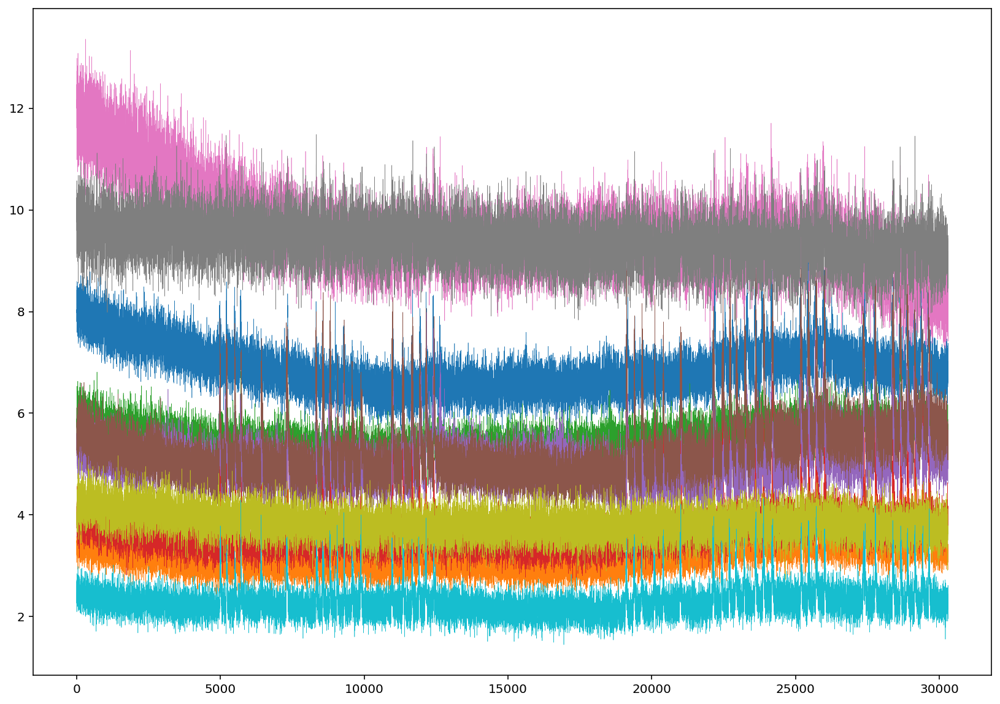

In [37]:
plt.figure(figsize=(14,10))
for i in C.sort_values("size",ascending=False).index[:10]:
    x = C.loc[i,"trace"]
    plt.plot(x,lw=.3)

In [48]:
roiCenters = np.vstack([np.mean(hood,axis=0)  for hood in C.sort_values("size",ascending=False).hood[:10]]).T[::-1]

### Analyze crawling

In [482]:
CorM = np.corrcoef(np.vstack(C["trace"]))

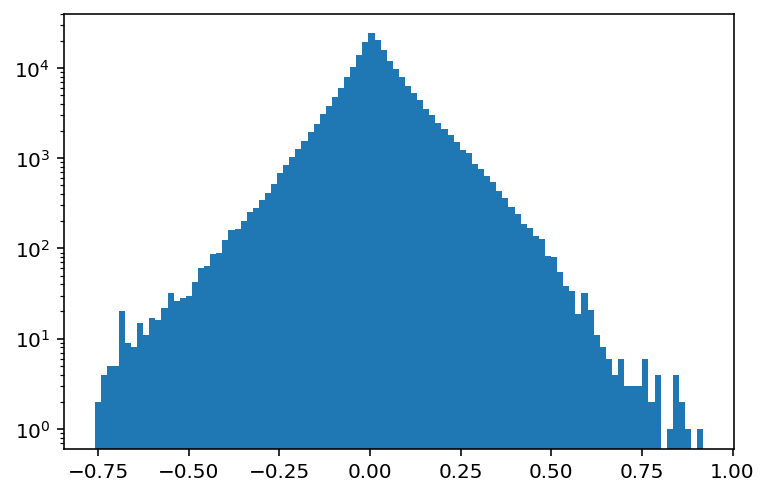

In [491]:
x = CorM[np.triu_indices_from(CorM,1)]
plt.hist(x,100,
         log=True
        );

In [498]:
np.argpartition?

In [505]:
np.argsort(-x)[:10]

array([ 85112,  85038, 124800,  85225,  85128, 143878,  85508,  91521,
       125180, 131652])

In [538]:
np.sum(x>0.85)

5

In [509]:
n = 10
iix = sorted(np.argpartition(-x,n,)[:n], key=lambda xi: -x[xi])

In [534]:
tmp = []
for i in iix:
    tmp += [np.linalg.norm(np.diff(np.vstack(C.loc[np.unique(np.squeeze(np.where(CorM==x[i]))),"center"].values),axis=0))]

In [535]:
tmp

[40.311288741492746,
 4.47213595499958,
 3.605551275463989,
 59.464274989274024,
 43.9089968002003,
 2.0,
 108.2266141020775,
 42.95346318982906,
 116.82465493208187,
 118.00423721205946]

In [539]:
# C.loc[np.squeeze(np.where(CorM==x.max()))]

In [540]:
# np.where(CorM==CorM.max())

In [449]:
C["trace_detrend"] = [dMovie[:,
    [el[0] for el in C.loc[i,"hood"]],
    [el[1] for el in C.loc[i,"hood"]]
       ].mean(axis=1) for i in C.index]

In [456]:
C["trace_trend"] = [m_50[:,
    [el[0] for el in C.loc[i,"hood"]],
    [el[1] for el in C.loc[i,"hood"]]
       ].mean(axis=1) for i in C.index]

In [546]:
Traces = np.vstack(C.query("size>5")[["trace_trend","size"]].prod(axis=1))
Traces = rebin(Traces,100,axis=1)

In [547]:
Traces.shape

(447, 303)

In [548]:
CorM = np.corrcoef(Traces[:,:])
CorM.shape

(447, 447)

In [453]:
%matplotlib inline

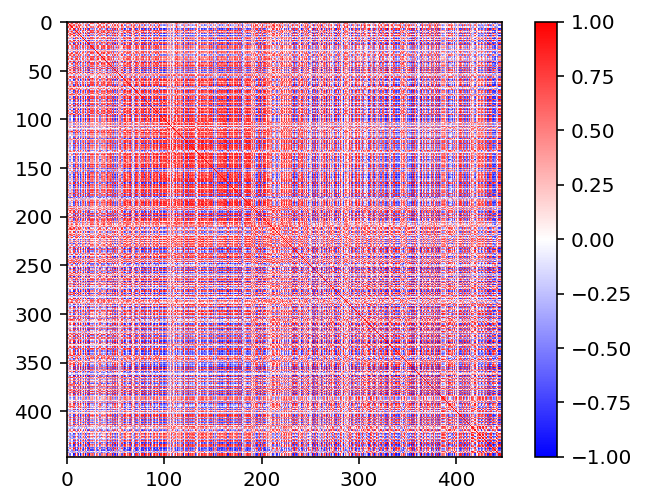

In [549]:
plt.imshow(CorM, vmin=-1, vmax=1, cmap="bwr")
plt.colorbar()

In [470]:
def distF(xi):
    return 1-np.corrcoef(xi)

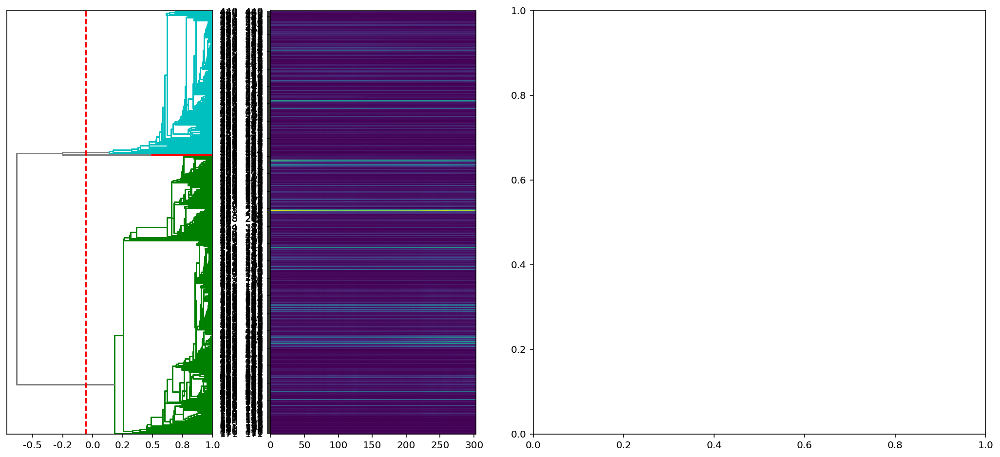

In [555]:
# Xcluster = np.diff(Traces[:],axis=1)
Xcluster = Traces
# Xcluster = np.array([(t-t.mean())/t.std() for t in Xcluster])
clRes = clusterCutAndPlot(Xcluster,
                      function=agglomerativeLinkage,
                      functionArgs=(distF,),
#                       function=linkage,
#                       functionArgs=("complete","correlation"),
                      threshold=3,
#                       criterion="maxclust",
#                       labels=None,
#                       imshow_kw = dict(), #vmin=-vmax,vmax=vmax, cmap="bwr"
#                       showClusterBoundaries=False,
                      )

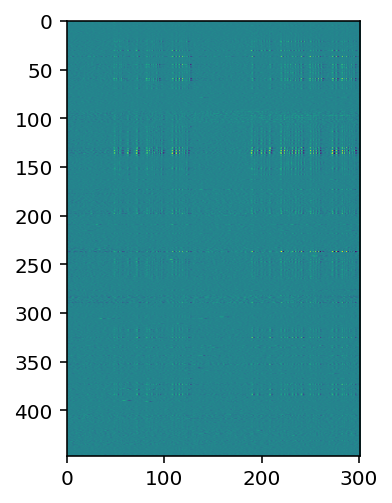

In [558]:
plt.imshow(np.diff(Xcluster[clRes["dendrogram"]["leaves"]],axis=1))

## Choose interesting by K-means

In [284]:
# roiCenters = getInterestingROIcenters(
#     blurredWeights,
#     Nsample=10000,
#     exponent=4,
#     bandwidth=int(20/metadata.pxSize)+1,
#     n_jobs=6,
# )

## See interesting

In [39]:
time = np.arange(len(m_orig))/m_orig.fr

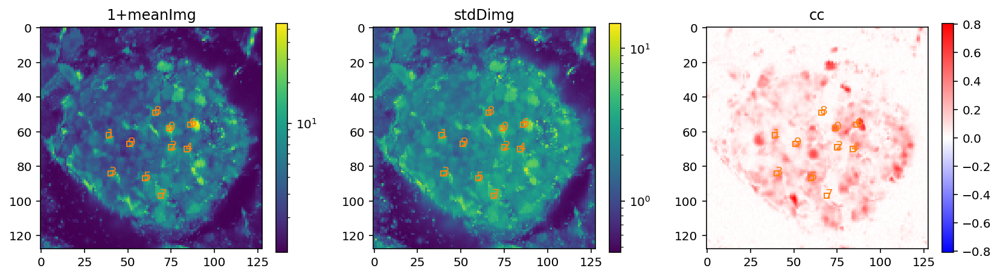

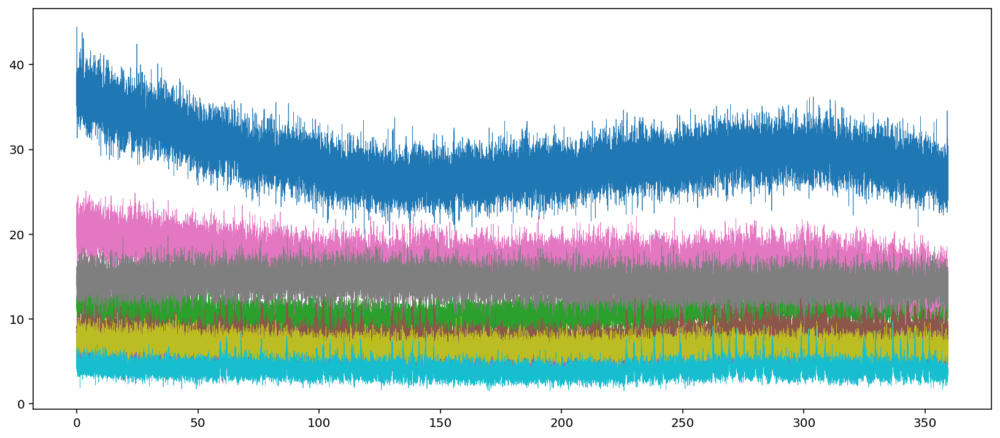

In [49]:
fig, axs = plt.subplots(1,3,figsize=(14,5))
for ax,mt in zip(axs.flat,["1+meanImg", "stdDimg", "cc"]):
    ax.set_title(mt)
    try:
        m = eval(mt)
    except:
        continue
    if np.any(m<0) or 'cc' in mt:
        im = ax.imshow(m.T,cmap="bwr",vmax=np.abs(m).max(),vmin=-np.abs(m).max())
    else:
        im = ax.imshow(m.T,norm=LogNorm())
    plt.colorbar(im,ax=ax,shrink=.7)

pxWin = 3
pxOrigins = np.round(roiCenters[::-1]-pxWin/2).astype(int)
pxOrigins[0] = np.clip(pxOrigins[0],0,metadata.Y-pxWin)
pxOrigins[1] = np.clip(pxOrigins[1],0,metadata.X-pxWin)
pxOrigins = pxOrigins.T
# iis = np.argsort([stdDimg[x:x+pxWin,y:y+pxWin].mean() for x,y in pxOrigins])[::-1]
# pxOrigins = pxOrigins[iis]
pxOrigins = pxOrigins[:10]
for ax in axs:
    addRoisToImage(pxOrigins,pxWin,label=True,ax=ax)
roiTraces = getRoiProfiles(pxOrigins,pxWin,image_=m_orig)
plt.figure(figsize=(14,6))
for roi in roiTraces:
    x = roiTraces[roi]
    plt.plot(time,x, lw=.4)

In [24]:
# np.diff(filteredMovie[:1000],0)

In [25]:
%matplotlib inline

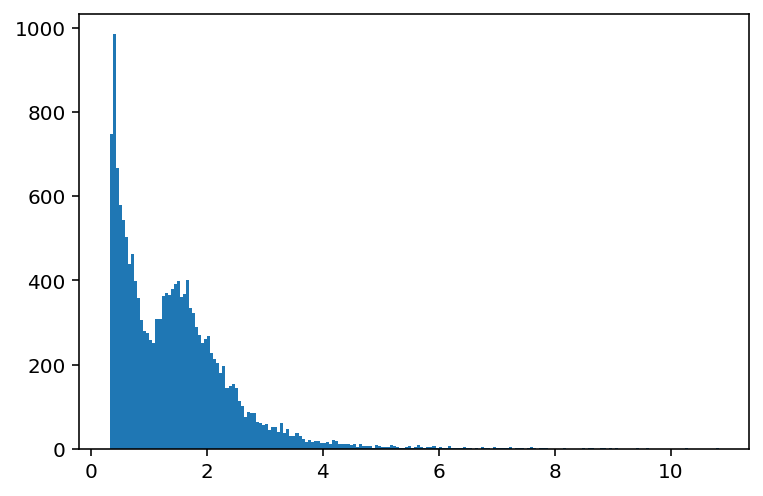

In [291]:
plt.hist(stdImg.flatten(),200);

# Separate into slow and fast component (filtered and diff-movie)

## figure out the parameters

### should I blur?

In [49]:
# n,s = 3,.35
# z = np.zeros((5,5))
# z[len(z)//2,len(z)//2] = 1
# zb  = cv2.GaussianBlur(z,ksize=(n,n),sigmaX=s,sigmaY=s)
# zb1 = cv2.GaussianBlur(z,ksize=(n,1),sigmaX=s,sigmaY=s)
# with np.printoptions(precision=3, suppress=True):
#     print (zb)
#     print (zb1)


In [50]:
# with np.printoptions(precision=4, suppress=True):
#     print (cv2.getGaussianKernel(3,.35)*100)

In [51]:
# m_blurred = m_orig.copy()
# # m_blurred = np.zeros((10,5,5))
# # m_blurred[4,3,3] = 1
# # blur in time
# nt,st = 3, .4
# m_blurred = movie(cv2.GaussianBlur(
#     m_blurred.reshape((len(m_blurred),-1)),ksize=(nt,1),sigmaX=st, sigmaY=0
# ).reshape(m_blurred.shape))
# # # blur in space
# m_blurred.gaussian_blur_2D(n,n,s,s);


In [52]:
# i,j = 2,11
# for x in [m_orig[:,i,j],m_blurred[:,i,j]]:
#     plt.plot(sorted(x),np.linspace(0,1,len(x)))

In [70]:
# movie(np.concatenate([
#     m_orig,
#     np.ones_like(m_orig[:,:2,:])*m_orig.max(),
#     m_blurred,ii
# ],axis=1)).play(magnification=3, fr=100)

### continue

In [69]:
# dt = .333
ironScale = 2
wIron = int(ironScale*m_orig.fr)
if wIron%2==0:
    wIron += 1

print(wIron)

filterPars = (wIron,wIron,50,1)

169


In [64]:
%%capture
lowPass(m_orig[:,0,0],*filterPars)

In [54]:
%matplotlib notebook

<IPython.core.display.Javascript object>


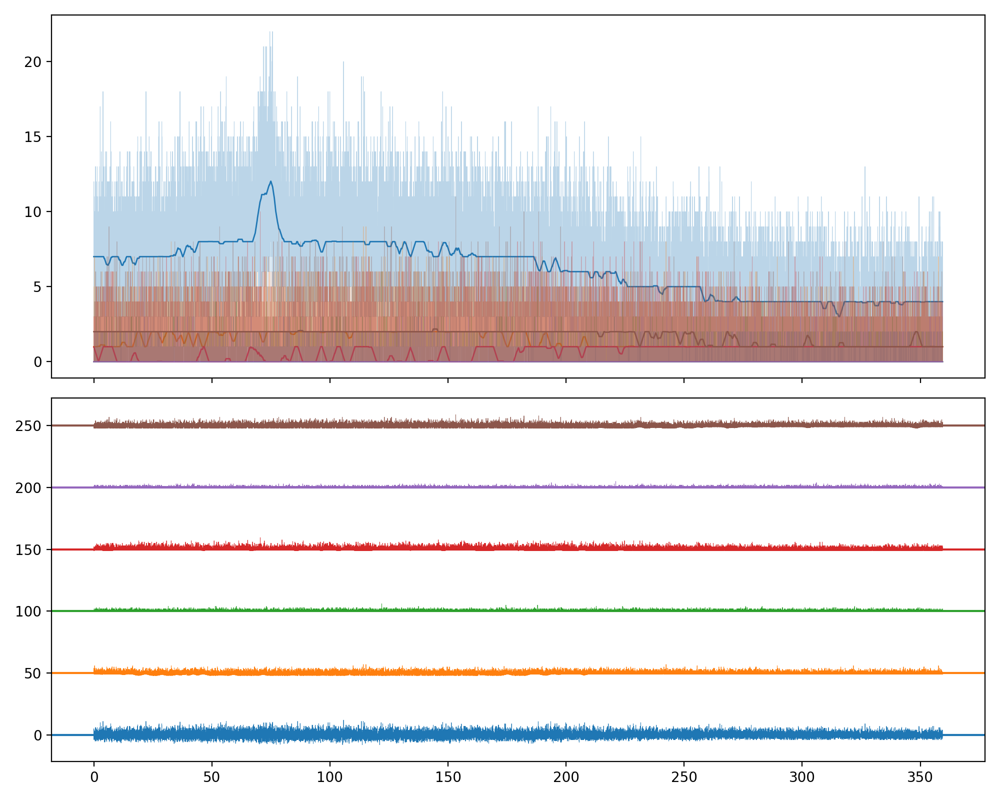

In [70]:
# %%capture
plt.close()
fig, axs = plt.subplots(2,1,figsize=(10,8), sharex=True)
ia = 0
n = 3
# for i,j in [(i//stdDimg.shape[1],i%stdDimg.shape[1]) for i in np.argpartition(-stdDimg.flatten(),n)[:n]]:
# for i,j in roiCenters.T.astype(int)[:3]+1:
for roi in range(14,20):
    np.random.seed(roi)
    i,j = np.random.choice(stdImg.shape[0],size=2)
    x = m_orig[:,i,j]
    c = "C%i"%ia
#     if np.diff(np.percentile(x,[1,99]))[0]<20: continue
    axs[0].plot(time,x,c=c,lw=.4,alpha = .3)
    xf = lowPass(x,*filterPars)
    axs[0].plot(time,xf,label=roi,c=c,lw=1)
    yoffset = 50*ia
    axs[1].plot(time,x-xf+yoffset,label=roi,c=c,lw=.3)
    axs[1].axhline(yoffset,color=c)
    ia += 1
fig.tight_layout()

## filter

In [71]:
ts = slice(None)

In [72]:
m_50 = np.nan*np.ones_like(m_orig[ts],dtype=np.float32)

In [73]:
# from numba import jit#, prange
# @jit
def filterMovie(original_,filterF_,filterPars_):
    t,x,y = original_.shape
    original_ = original_.astype(np.float32)
    out = np.nan*np.ones_like(original_,dtype=np.float32)
    for i in range(x):
        for j in range(y):
            out[:,i,j] = filterF_(original_[:,i,j],*filterPars_)
    return out

In [74]:
%%capture
filterMovie(m_orig[ts,:1,:1],lowPass,(wIron,wIron,50.00,1))

In [75]:
m_50 = filterMovie(m_orig[ts],lowPass,(wIron,wIron,50.00,1))

/Users/srdjan/Documents/Physio_Ca/functions/numeric.py:41: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled because Function "percFilter" failed type inference due to: Invalid use of Function(<function hstack at 0x10668c510>) with argument(s) of type(s): (list(array(float32, 1d, A)))
 * parameterized
In definition 0:
    TypeError: np.hstack(): expecting a non-empty tuple of arrays, got list(array(float32, 1d, A))
    raised from /Users/srdjan/anaconda2/envs/caiman/lib/python3.7/site-packages/numba/typing/npydecl.py:812
In definition 1:
    TypeError: np.hstack(): expecting a non-empty tuple of arrays, got list(array(float32, 1d, A))
    raised from /Users/srdjan/anaconda2/envs/caiman/lib/python3.7/site-packages/numba/typing/npydecl.py:812
This error is usually caused by passing an argument of a type that is unsupported by the named function.
[1] During: resolving callee type: Function(<function hstack at 0x10668c510>)
[2] During: typing of call at /Us

In [410]:
# m_15 = filterMovie(dMovie,lowPass,(wIron,wIron,15.73,1))
# m_s = -m_15
m_s = np.clip(m_50**.5,std0,6)

In [411]:
dMovie = m_orig[ts]-m_50

## is the estimate of error right?

### error vs mean

In [78]:
maxf = m_50.max()

In [79]:
dt = wIron
data = []
for t,i,j in list(np.random.randint((len(time)-dt//2,)+stdImg.shape, size = (10000,3)))+[np.array(np.where(m_50==m_50.max())).T[0]]:
    t = np.maximum(t,dt//2)
    dx = dMovie[t-dt//2:t+dt//2,i,j]
    if dx.mean()==0: continue
#     data += [(filteredMovie[t,i,j],dx.std())]
#     data += [(filteredMovie[t,i,j],dx.std(),filteredMovie[t,i,j]+dx.mean())]
    data += [(m_50[t,i,j],dx.std(),m_50[t,i,j]+dx.mean())]

In [80]:
x,y,z = np.array(data).T

y = y[x>.01]
z = z[x>.01]
x = x[x>.01]

In [81]:
mean0 = z[x<.1].mean()
std0  = y[x<.1].mean()

In [85]:
# n =10
def pc2std(xr_):
    return np.maximum(std0,xr_**.5)
#     return (std0**n+(xr_**.5)**n)**(1/n)
# # def pc2std(xr_,b,c):
# #     return (std0  + b*(xr_)**c)**.5
# def pc2mean(xr_,b,c):
#     return (mean0 + b*(xr_)**c)

In [82]:
%matplotlib inline

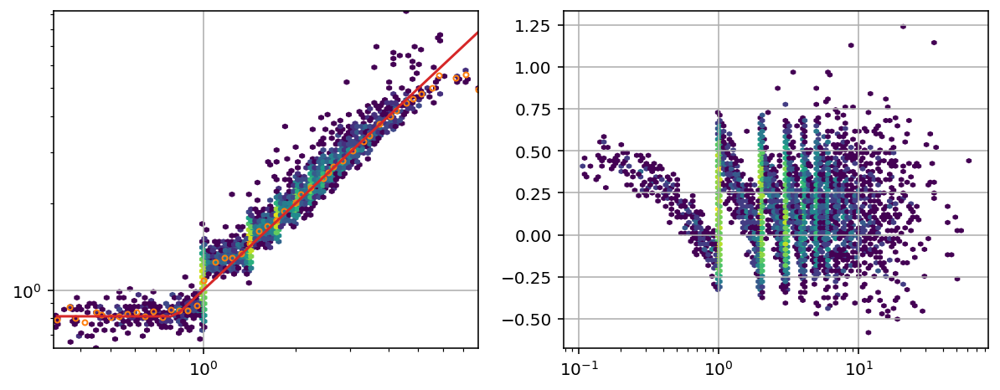

In [86]:
y = y[x>.1]
z = z[x>.1]
x = x[x>.1]
xb = np.logspace(np.log10(x.min()),np.log10(x.max())+.01)
xd = np.digitize(x,xb)
xr = np.array([np.median(x[xd==i]) for i in np.unique(xd)])
yr = np.array([np.median(y[xd==i]) for i in np.unique(xd)])
zr = np.array([np.median(z[xd==i]) for i in np.unique(xd)])

# pc2stdPars  = curve_fit(pc2std,x,y)[0]
# pc2meanPars = curve_fit(pc2mean,x,y)[0]

plt.figure(figsize=(10,3.7))
plt.subplot(121)
plt.hexbin(x**.5,y,norm=LogNorm(),xscale="log",yscale="log",mincnt=1)
plt.plot(xr**.5,yr,"C1.",mfc="none")
try: plt.plot(xr**.5,pc2std(xr),"C3")
except: pass
plt.grid()

plt.subplot(122)
plt.hexbin(x,z-x,norm=LogNorm(),xscale="log",yscale="linear", mincnt=1)
# plt.plot(xr,zr,"C1.",mfc="none")
# plt.plot(xr,pc2mean(xr,*pc2meanPars),"C3")
plt.grid()

### std of the m_50

In [2017]:
meanImg = m_50.mean(0)
stdImg  = m_50.std(0)

In [1940]:
maxf = m_50.max()

In [1946]:
dt = wIron
data = []
for t,i,j in list(np.random.randint((len(time)-dt//2,)+stdImg.shape, size = (10000,3)))+[np.array(np.where(m_50==m_50.max())).T[0]]:
    t = np.maximum(t,dt//2)
    dx = m_50[t-dt//2:t+dt//2,i,j]
    data += [(
        m_50[t,i,j],
        dx.std(),
        dx.mean()
    )]

In [1947]:
x,y,z = np.array(data).T

y = y[x>.01]
z = z[x>.01]
x = x[x>.01]

In [1948]:
%matplotlib inline

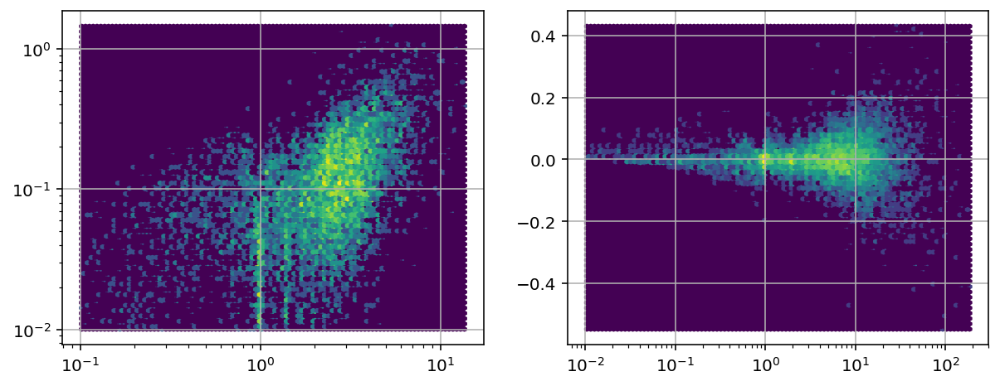

In [1949]:

z = z[y>.01]
x = x[y>.01]
y = y[y>.01]
# xb = np.logspace(np.log10(x.min()),np.log10(x.max())+.01)
# xd = np.digitize(x,xb)
# xr = np.array([np.median(x[xd==i]) for i in np.unique(xd)])
# yr = np.array([np.median(y[xd==i]) for i in np.unique(xd)])
# zr = np.array([np.median(z[xd==i]) for i in np.unique(xd)])

# pc2stdPars  = curve_fit(pc2std,x,y)[0]
# pc2meanPars = curve_fit(pc2mean,x,y)[0]

plt.figure(figsize=(10,3.7))
plt.subplot(121)
plt.hexbin(x**.5,y,norm=LogNorm(),xscale="log",yscale="log")
# plt.plot(xr**.5,yr,"C1.",mfc="none")
# plt.plot(xr**.5,pc2std(xr),"C3")
plt.grid()

plt.subplot(122)
plt.hexbin(x,z-x,norm=LogNorm(),xscale="log",yscale="linear")
# plt.plot(xr,zr,"C1.",mfc="none")
# plt.plot(xr,pc2mean(xr,*pc2meanPars),"C3")
plt.grid()

### many other tries

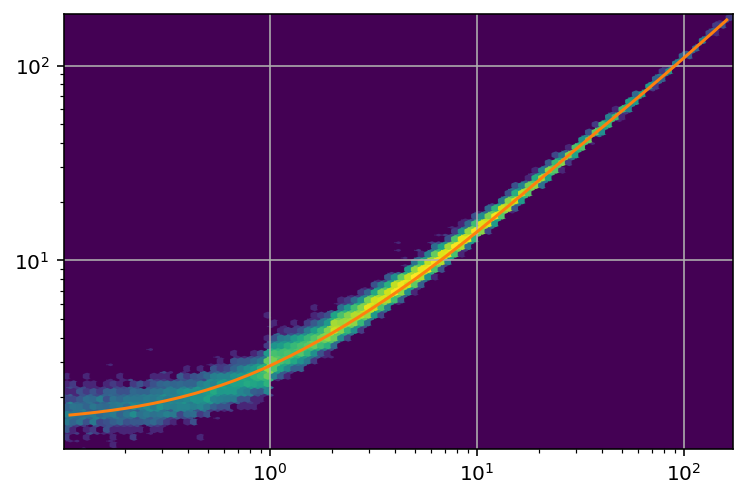

In [772]:
# plt.plot(x,z,".")
plt.hexbin(x,z,norm=LogNorm(),xscale="log",yscale="log")
highPartPars    = curve_fit(highPartMean,x[x>100],z[x>100],)[0]
lowPartPars     = curve_fit(highPartMean,x[x< 30],z[x< 30],)[0]
lowestPartPars  = curve_fit(highPartMean,x[x<  3],z[x<  3],)[0]
# plt.plot(xr,highPartMean(xr,*highPartPars))
# plt.plot(xr,highPartMean(xr,*lowPartPars))
# plt.plot(xr,highPartMean(xr,*lowestPartPars))
plt.plot([])
n = 20
plt.plot(xr,1/(
    1/highPartMean(xr,*highPartPars)**n+
    1/highPartMean(xr,*lowPartPars)**n+
    1/highPartMean(xr,*lowestPartPars)**n)**(1/n)
        )
# plt.plot(xr,xr*1.0+10)
plt.grid()

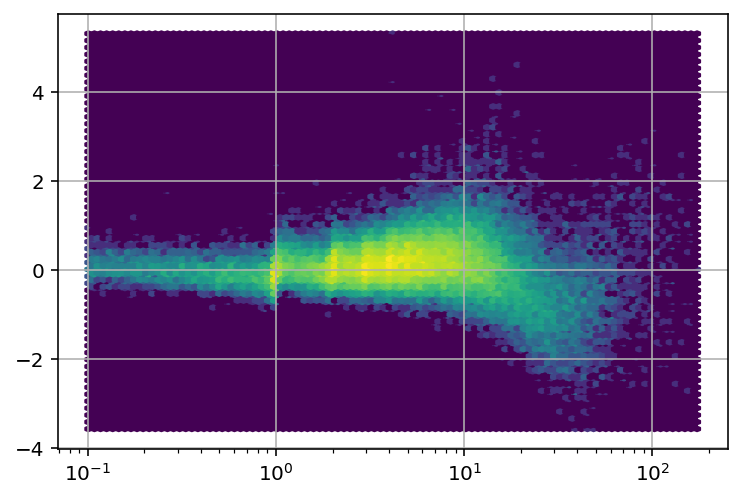

In [779]:
n = 30
zp = 1/(
    1/highPartMean(x,*highPartPars)**n+
    1/highPartMean(x,*lowPartPars)**n+
    1/highPartMean(x,*lowestPartPars)**n)**(1/n)
plt.hexbin(x,z-zp,norm=LogNorm(),xscale="log",yscale="linear")
plt.grid()

In [649]:
pc2meanPars

array([0.44993375, 0.63547201])

In [713]:
def lowPartMean(xr_, a,b,c):
    return a*(xr_+b)**c+mean0-a*b**c

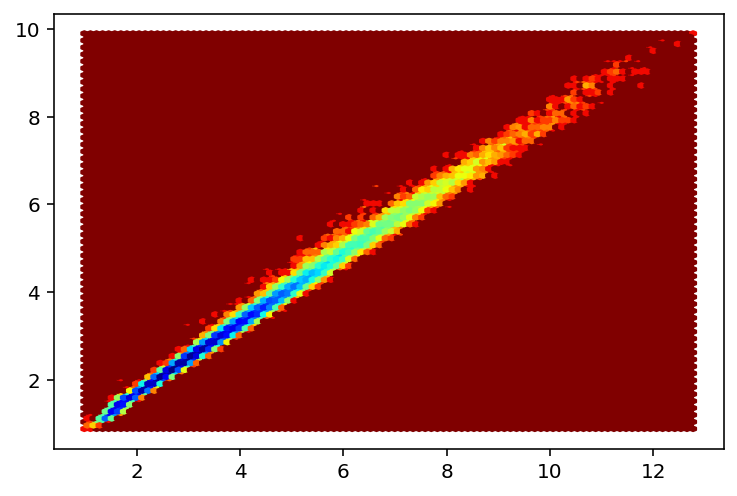

In [740]:
plt.hexbin(z,y,norm=LogNorm(),xscale="linear", cmap="jet_r")

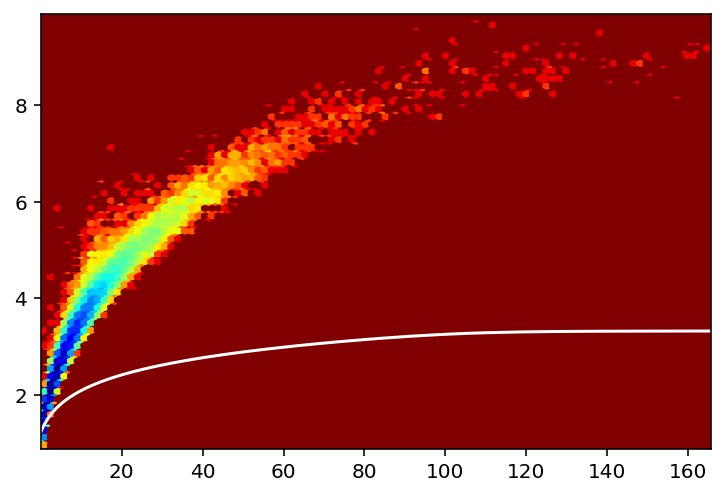

In [739]:
plt.hexbin(x,y,norm=LogNorm(),xscale="linear", cmap="jet_r")
plt.plot(xr,handFitPc2Mean(xr)**.5,"w")

In [ ]:
pl

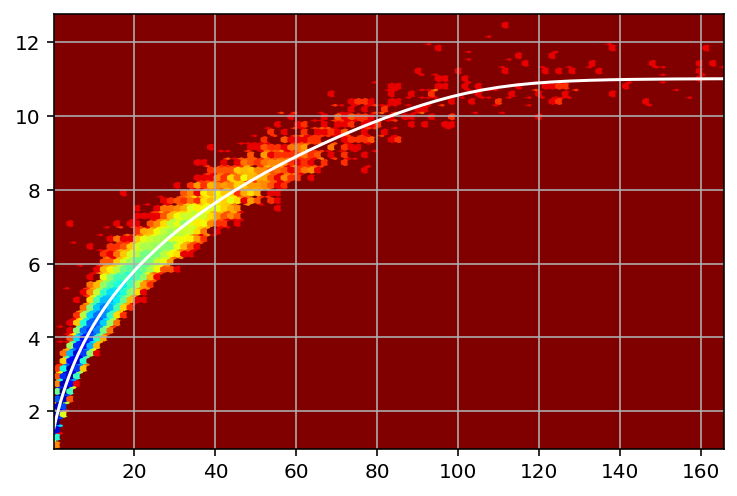

In [733]:
plt.hexbin(x,z,norm=LogNorm(),xscale="linear", cmap="jet_r")
plt.plot([])
xl = plt.xlim()
yl = plt.ylim()
# plt.plot(xr,mean0 + .3*(xr)**.7)

# f = lambda xi: 2*(xi+1)**.39-.6
# plt.plot(xr,f(xr))

# plt.plot(xr,1/(1/f(xr)**n+1/11.3**n)**(1/n),".-")

lowPartPars = curve_fit(lowPartMean,x[x<70],z[x<70],p0=(2,1,.39))[0]
# plt.plot(xr,lowPartMean(xr,*lowPartPars))
# highPartPars = curve_fit(highPartMean,x[x>120],z[x>120],)[0]
highPartPars = (0,z[x>120].mean())
# plt.plot(xr,highPartMean(xr,*highPartPars))
n = 40
xr = np.logspace(np.log10(x.min()),np.log10(x.max()),200)
def handFitPc2Mean(xi):
    n = 30
    return 1/(1./highPartMean(xi,*highPartPars)**n+1./lowPartMean(xi,*lowPartPars)**n)**(1./n)
plt.plot(xr,handFitPc2Mean(xr),"w")
# plt.plot(xr,2*(xr+1)**.5-1)
# plt.plot(xr,pc2std(xr,*pc2stdPars))
plt.xlim(xl)
plt.ylim(yl)
plt.grid()

In [736]:
len(filteredMovie)

10101

In [737]:
%%time
shiftFilteredMovie = handFitPc2Mean(filteredMovie)

CPU times: user 13.2 s, sys: 2.85 s, total: 16.1 s
Wall time: 16.1 s


In [738]:
realDiffMovie = m_orig-shiftFilteredMovie

In [731]:
zScoreMovie = realDiffMovie/

11.016277089909037

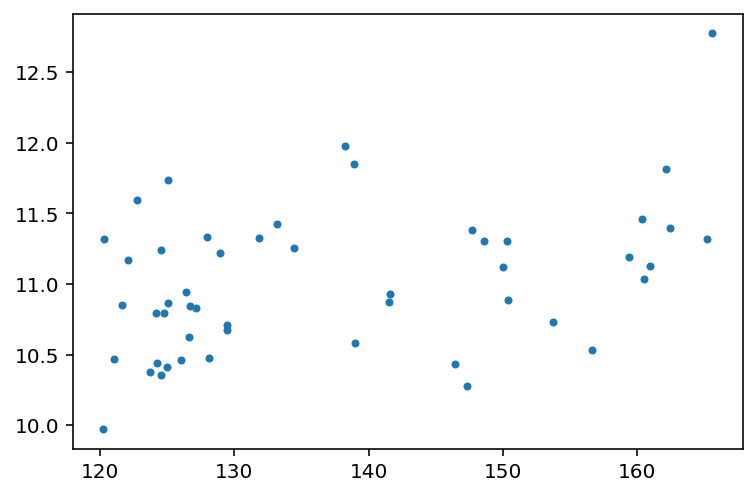

In [730]:
plt.plot(x[x>120], z[x>120],".")

/Users/srdjan/anaconda2/envs/caiman/lib/python3.7/site-packages/scipy/optimize/minpack.py:795: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


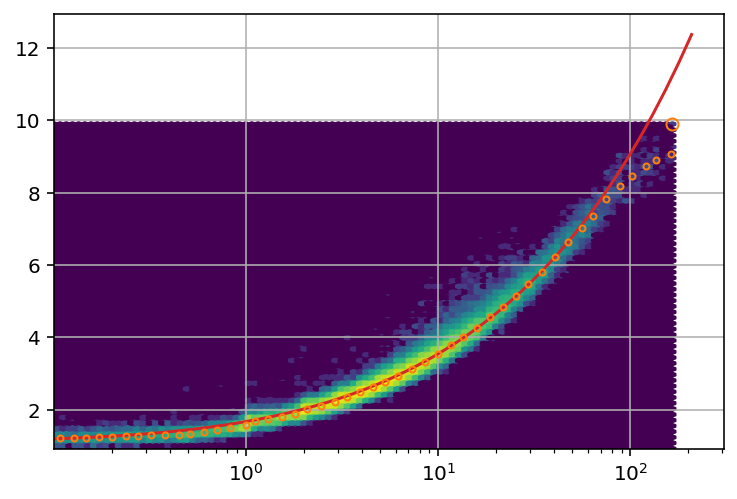

In [615]:
# plt.plot(*np.array(tmp).T,color="C1")
xr = np.logspace(np.log10(x.min()),np.log10(x.max())+.01)
pc2meanPars = curve_fit(pc2std,x,y)[0]
plt.plot(xr,pc2std(xr,*pc2meanPars),"C3")


plt.plot(*data[-1],marker="o",mfc="none",c="C1")

In [617]:
t,i,j = np.array(np.where(filteredMovie==maxf)).T[0]

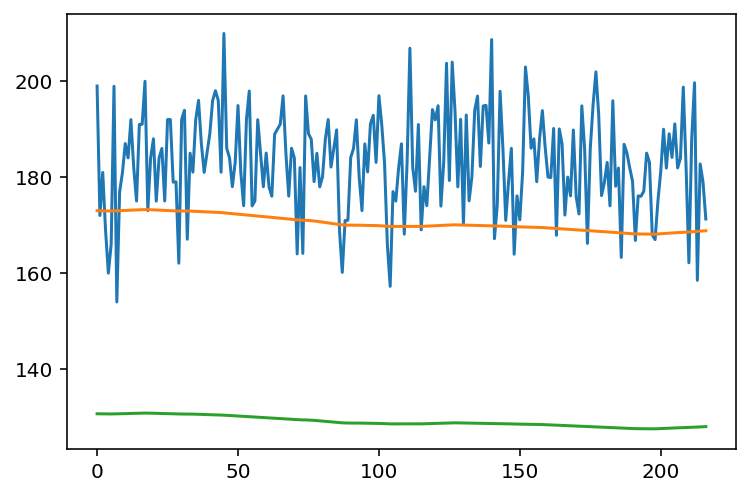

In [625]:
plt.plot(m_orig[0:t+200,i,j])
plt.plot(filteredMovie[0:t+200,i,j])
plt.plot(pc2std(filteredMovie[0:t+200,i,j],*pc2meanPars)**2)

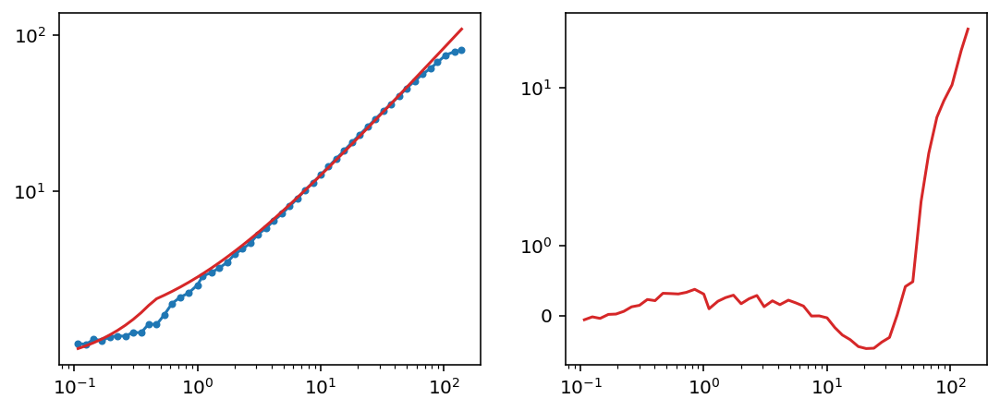

In [590]:
fig, axs = plt.subplots(1,2,figsize=(9,3.5))
axs[0].plot(xr,yr**2,".-")
axs[0].plot(xr,pc2std(xr,*pc2meanPars)**2,"C3")
axs[1].plot(xr,pc2std(xr,*pc2meanPars)**2-yr**2,"C3")
for ax in axs:
    ax.set_xscale("log")
    ax.set_yscale("symlog")

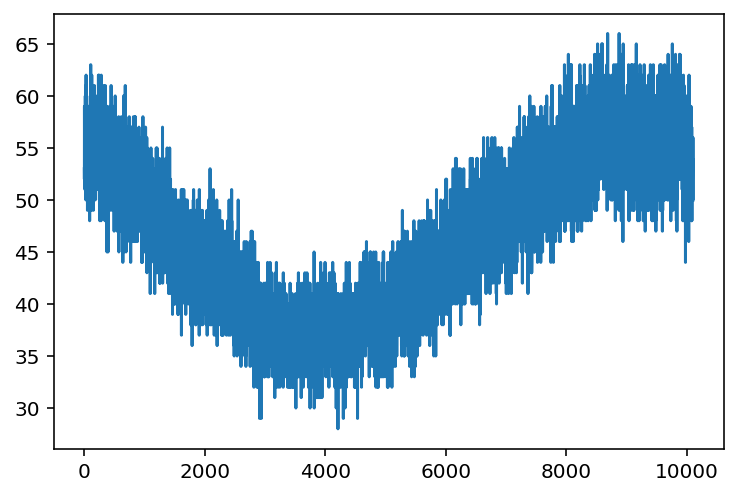

In [588]:
plt.plot(np.sum(m_orig>80,(1,2)))

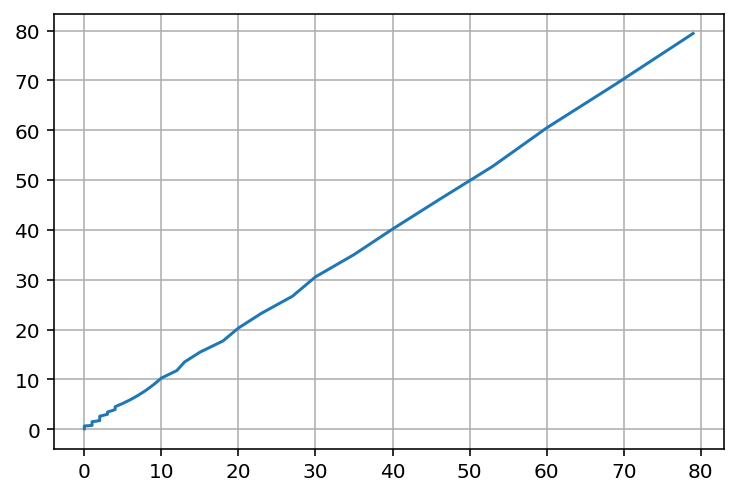

In [828]:
mus = np.logspace(-1,1.9)
tmp = []
for mu in mus:
    p = dst.poisson(mu=mu)
    tmp += [(p.ppf(.5),p.mean())]
plt.plot(*np.array(tmp).T)
# plt.xscale("log")
plt.grid()

In [613]:
%%time
%%capture
pc2std(filteredMovie[:1000],*pc2meanPars)

CPU times: user 285 ms, sys: 38.3 ms, total: 323 ms
Wall time: 322 ms


In [614]:
len(filteredMovie)

10101

In [403]:
%matplotlib notebook

In [386]:
# skv = np.argpartition(-diffSkew.flatten(),1000)
skv = np.argpartition(-stdFiltered.flatten(),1000)

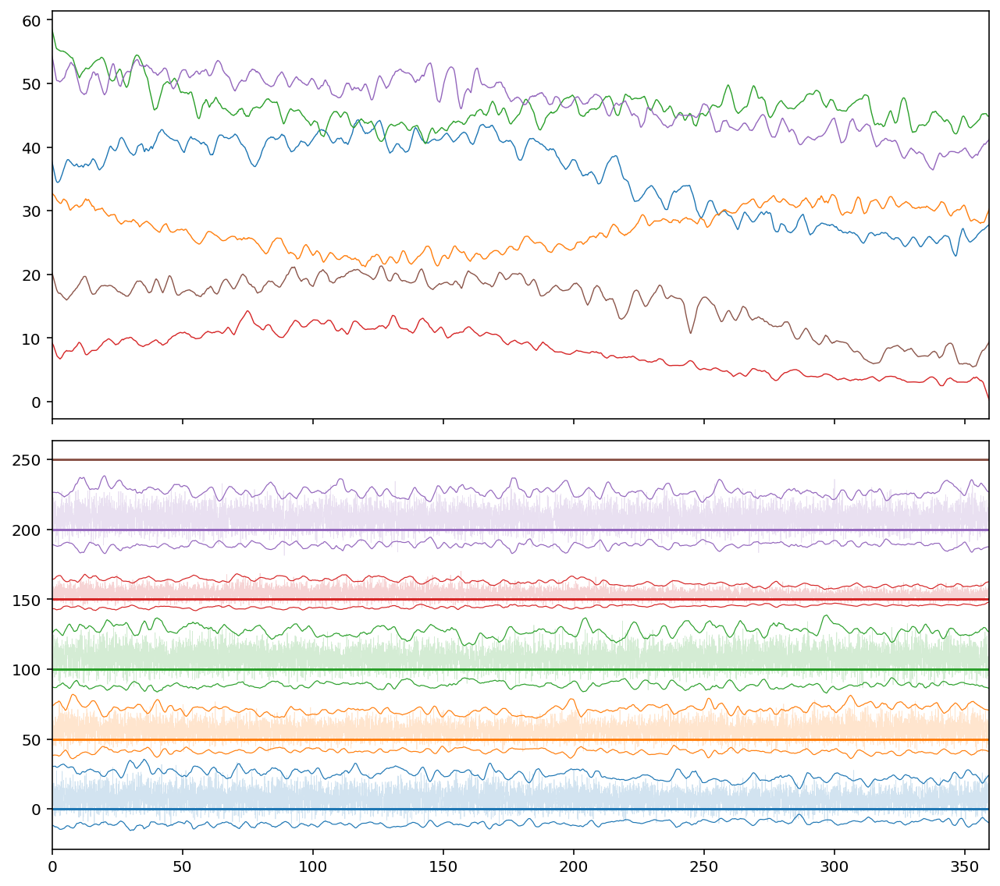

In [424]:
# %%capture
plt.close()
fig, axs = plt.subplots(2,1,figsize=(9,8), sharex=True)
ia = 0
# for roi in range(10,15):
#     np.random.seed(roi)
#     i,j = np.random.choice(stdImg.shape[0],size=2)
for i,j in zip(skv//metadata.X, skv%metadata.X):
    c="C%i"%ia
    x  = m_orig       [:,i,j]
    xf = filteredMovie[:,i,j]
    dx = diffMovie    [:,i,j]
#     if diffSkew[i,j]<2: continue
#     if diffMedians[i,j]<1: continue
#     if xf.std()<10: continue
#     if dx.std()<1: continue
#     axs[0].plot(time,x ,c=c,lw=.4,alpha = .3)
    axs[0].plot(time,xf,c=c,lw=.7)
    yoffset = 50*ia
    axs[1].plot(time,dx+yoffset,c=c,lw=.4,alpha = .2)
    axs[1].axhline(yoffset,color=c)
#     axs[1].plot(time,xdp[p]+yoffset,label=roi,c=c,lw=.6)
    
    xdp = OrderedDict([
        (p,lowPass(dx,1*wIron,1*wIron, perc = p)) for p in [15.73,50]#[10,25,50,75]
    ])
    xdm = xdp[50]
    xds = xdp[50]-xdp[15.73]
    for n in [3]:
        axs[1].plot(time,xdm-n*xds+yoffset,label=roi,c=c,lw=.6 if n else 1)
        axs[1].plot(time,xdm+n*xds+yoffset,label=roi,c=c,lw=.6 if n else 1)
#     for p in xdp:
#         axs[1].plot(time,xdp[p]+yoffset,label=roi,c="C%i"%roi,lw=.6)
    ia += 1
    if ia>5:
        break
axs[0].set_xlim(0,time.max())
fig.tight_layout()

In [341]:
# %%time
# xdp = OrderedDict([
#         (p,percFilter(dx,filterSize=wIron,perc = p)) for p in [10,25,50,75]
#     ])

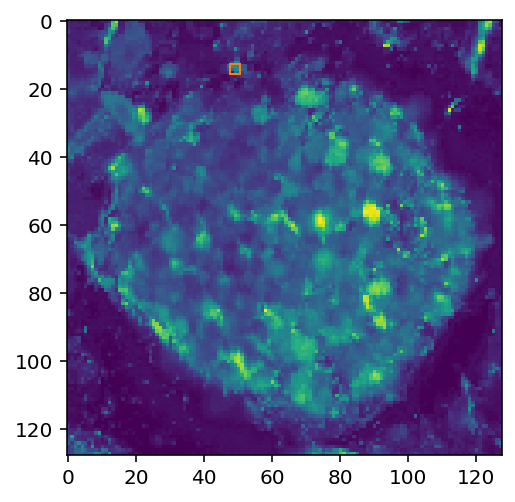

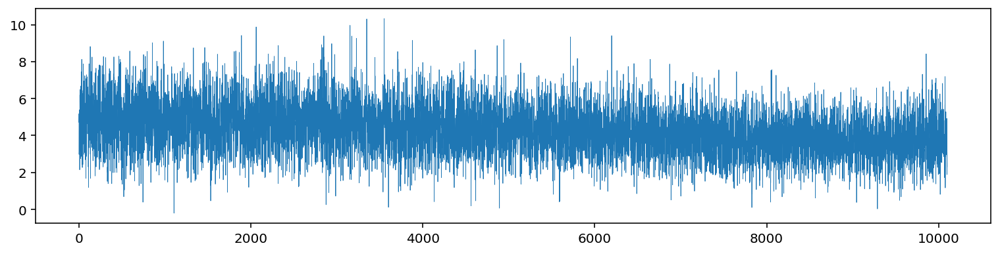

In [259]:
plt.imshow((diffP99-diffMedians).T)
addRoisToImage([(48,13)],pxWin=3,ax=plt.gca(),label=False)
plt.show()
plt.figure(figsize=(13,3))
plt.plot(getRoiProfiles([(48,13)],3,image_=diffMovie)[0],lw=.4)
# plt.plot(diffMovie[)

In [ ]:
diffMedians==diffMedians.max()

In [104]:
%matplotlib notebook

<IPython.core.display.Javascript object>


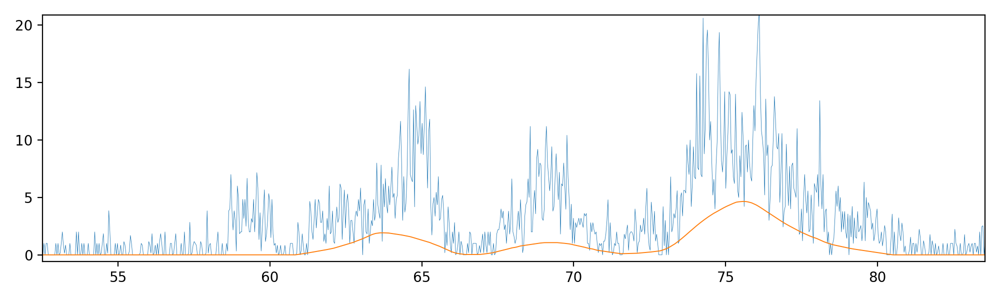

In [110]:
fig = plt.figure(figsize=(10,3))

plt.plot(time,m_orig       [:,i,j],lw=.3)
plt.plot(time,filteredMovie[:,i,j],lw=.7)
# plt.xlim(0,len(diffMovie))
fig.tight_layout()

In [78]:
# filteredMovie = np.maximum(filteredMovie,0)

In [146]:
# PredictedSigmas = np.zeros_like(meanImg)
# PredictedLocs   = np.zeros_like(meanImg)
# # for i,j in product(np.arange(metadata.X),np.arange(metadata.Y)):
# for i,j in np.array(np.where(np.isfinite(filteredMovie[0]))).T:
#     lc,sg = predictLocSd(diffMovie[:,i,j])
# #     diffMovie[:,i,j] -= lc
# #     filteredMovie[:,i,j] += lc
#     PredictedSigmas[i,j] = sg
#     PredictedLocs  [i,j] = lc

fit mean from percentile

In [73]:
%matplotlib notebook

<IPython.core.display.Javascript object>


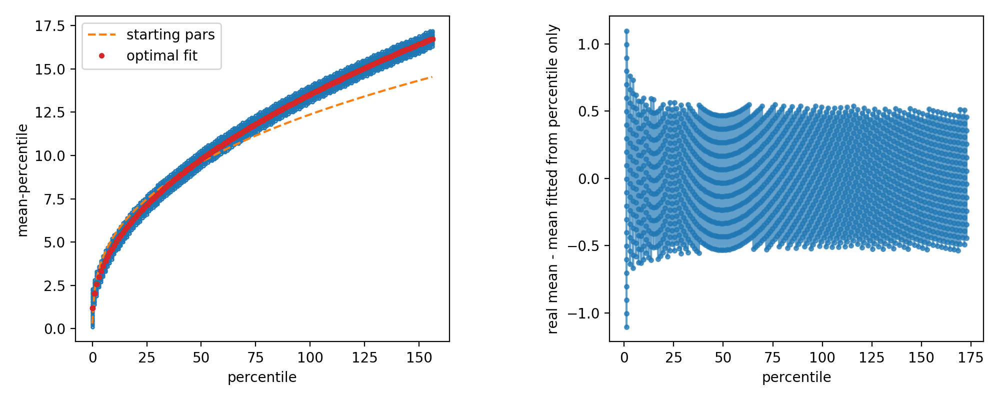

In [74]:
fig, axs = plt.subplots(1,2,figsize=(10,4))

mus = np.arange(0.1,filteredMovie.max(),.1)
percs = dst.poisson.ppf(filterPars[2]/100,mu=mus)
axs[0].plot(percs,mus-percs,".",ms=4,mfc="none")
axs[0].set_xlabel("percentile")
axs[0].set_ylabel("mean-percentile")
def tmpf(xi,a,b,c,d): return a*xi/(1+xi/b)**c+d
p0 = (4.7,.3,.63,.3)
axs[0].plot(percs,tmpf(percs,*p0),label="starting pars",ls="--")
p_opt = curve_fit(tmpf,percs,mus-percs,p0, maxfev=10000)[0]
axs[0].plot([])
axs[0].plot(percs,tmpf(percs,*p_opt),".",label="optimal fit")
axs[0].legend()

axs[1].set_xlabel("percentile")
axs[1].set_ylabel("real mean - mean fitted from percentile only")
def pc2meanF(pcs_):
    return pcs_+tmpf(pcs_,*p_opt)
# axs[1].plot(mus, pc2meanF(percs), ".-",alpha = .7)
axs[1].plot(pc2meanF(percs),mus-pc2meanF(percs),".-",alpha = .7)
fig.tight_layout(w_pad=7)
# plt.xscale("log")
# plt.yscale("log")

In [ ]:
, sharex=True

# Ivestigate filtered Movie

## 2019_12_15

In [118]:
dm_50 = np.diff(m_50, axis=0)

In [119]:
%matplotlib inline

In [173]:
stdFimg  = m_50.std(0)
meanFimg = m_50.mean(0)

In [123]:
stdDFimg  = dm_50.std(0)
meanDFimg = dm_50.mean(0)

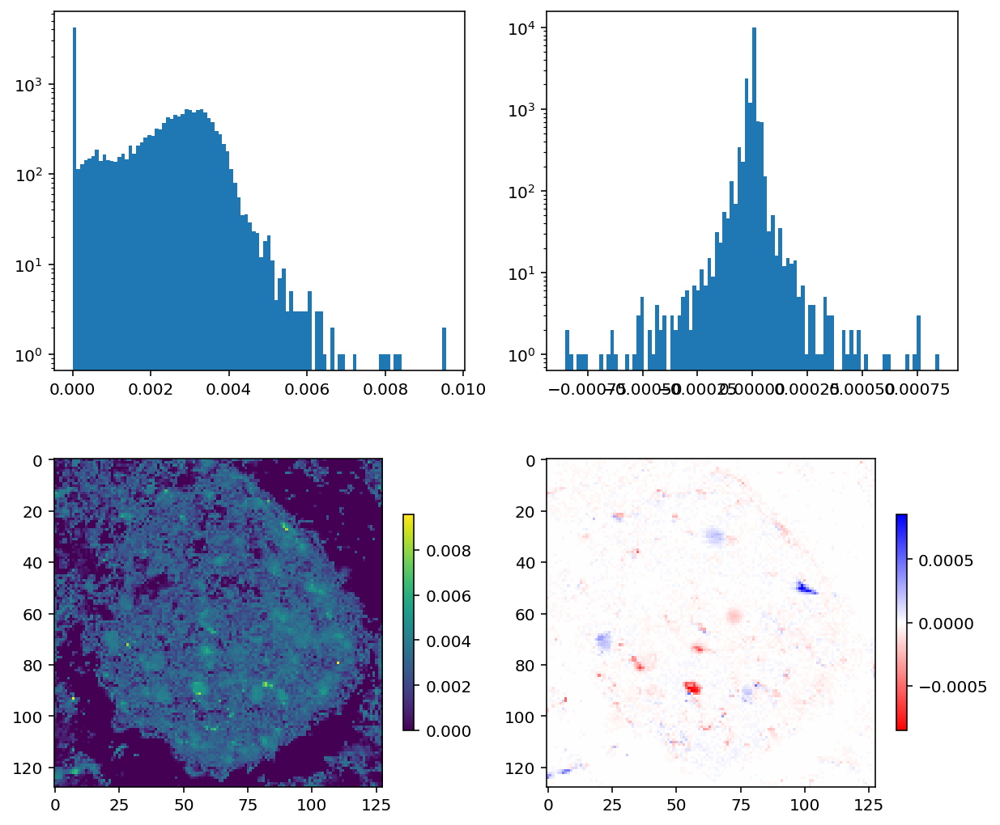

In [136]:
fig, axs = plt.subplots(2,2,figsize=(10,9))
axs[0,0].hist(stdDFimg.flatten(),100, log=True)
axs[0,1].hist(meanDFimg.flatten(),100, log=True);
im = axs[1,0].imshow(stdDFimg)
plt.colorbar(im, ax=axs[1,0], shrink=.6)
im = axs[1,1].imshow(meanDFimg, cmap="bwr_r", vmin=-np.abs(meanDFimg).max(), vmax = np.abs(meanDFimg).max());
plt.colorbar(im, ax=axs[1,1], shrink=.6)

<IPython.core.display.Javascript object>


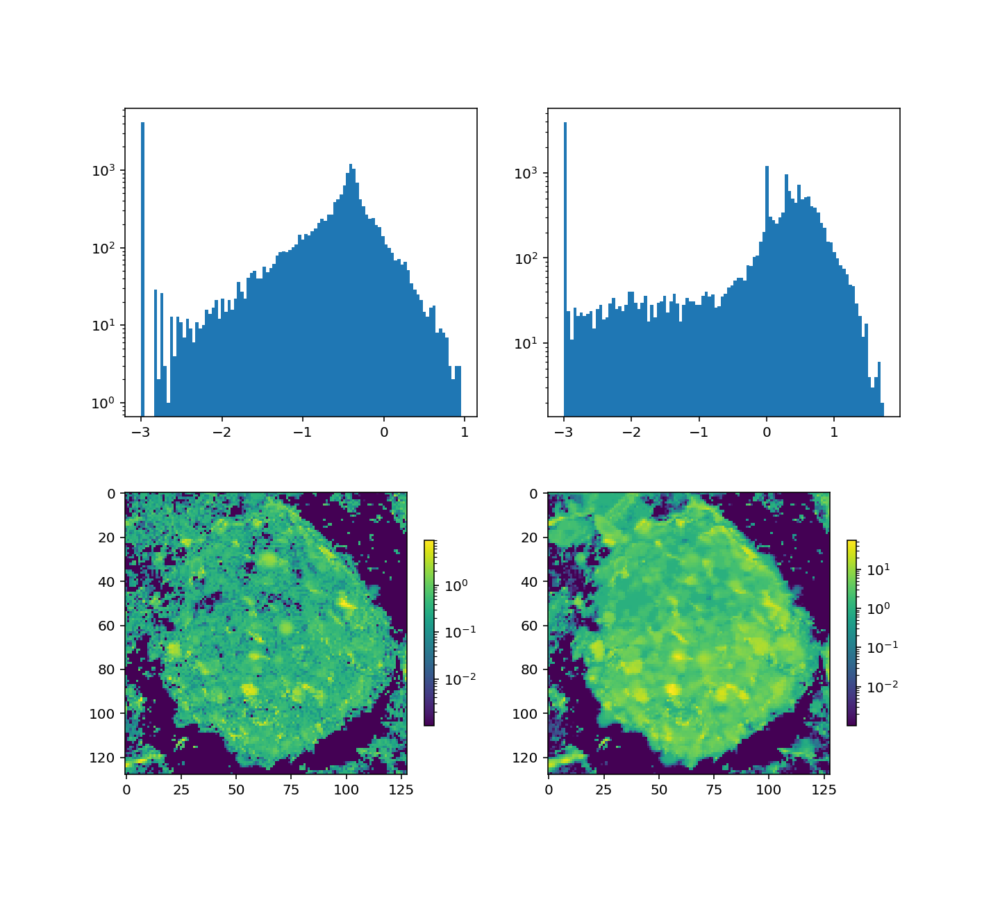

In [177]:
fig, axs = plt.subplots(2,2,figsize=(10,9))
axs[0,0].hist(np.log10(1e-3+stdFimg).flatten(),100, log=True)
axs[0,1].hist(np.log10(1e-3+meanFimg).flatten(),100, log=True);
im = axs[1,0].imshow(1e-3+stdFimg, norm=LogNorm())
plt.colorbar(im, ax=axs[1,0], shrink=.6)
im = axs[1,1].imshow(1e-3+meanFimg, norm=LogNorm());
plt.colorbar(im, ax=axs[1,1], shrink=.6)

In [140]:
tmp = m_50[:].resize(1,1,1/100)

In [141]:
tmp.play(fr=80,plot_text=True,magnification = 3)

## old

In [759]:
def highPartMean(xr_, k_, n_):
    return k_*xr_ + n_

In [82]:
shiftFiltered = pc2meanF(filteredMovie)

<IPython.core.display.Javascript object>


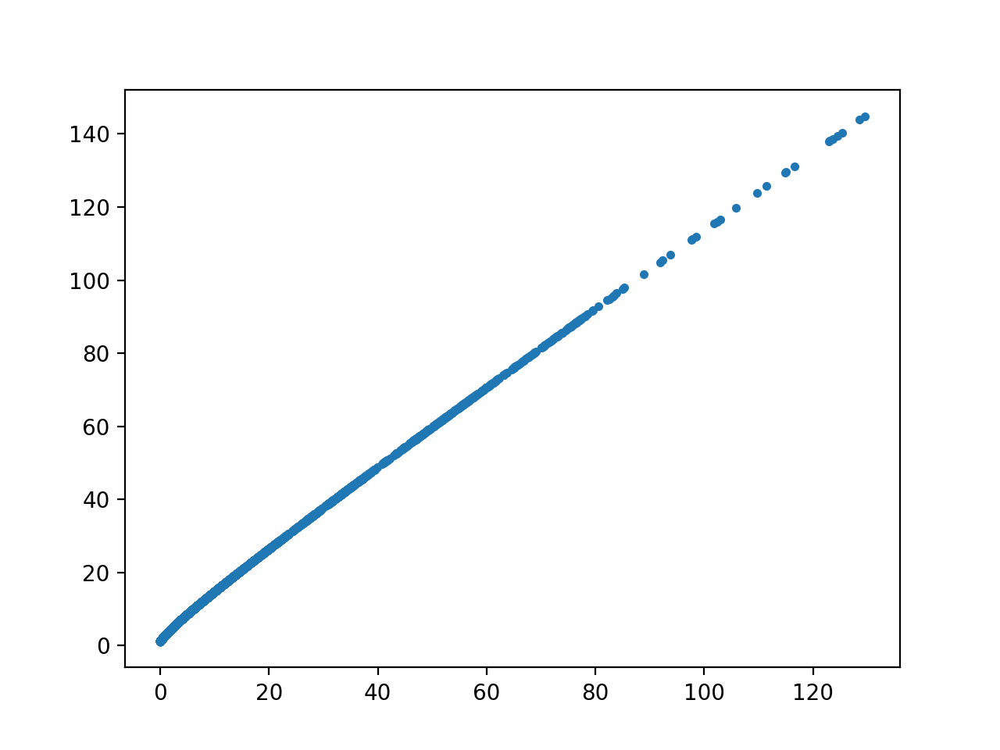

In [112]:
plt.plot(
    filteredMovie[::100,::10,::10].flatten(),
    shiftFiltered[::100,::10,::10].flatten(),
    "."
        )

<IPython.core.display.Javascript object>


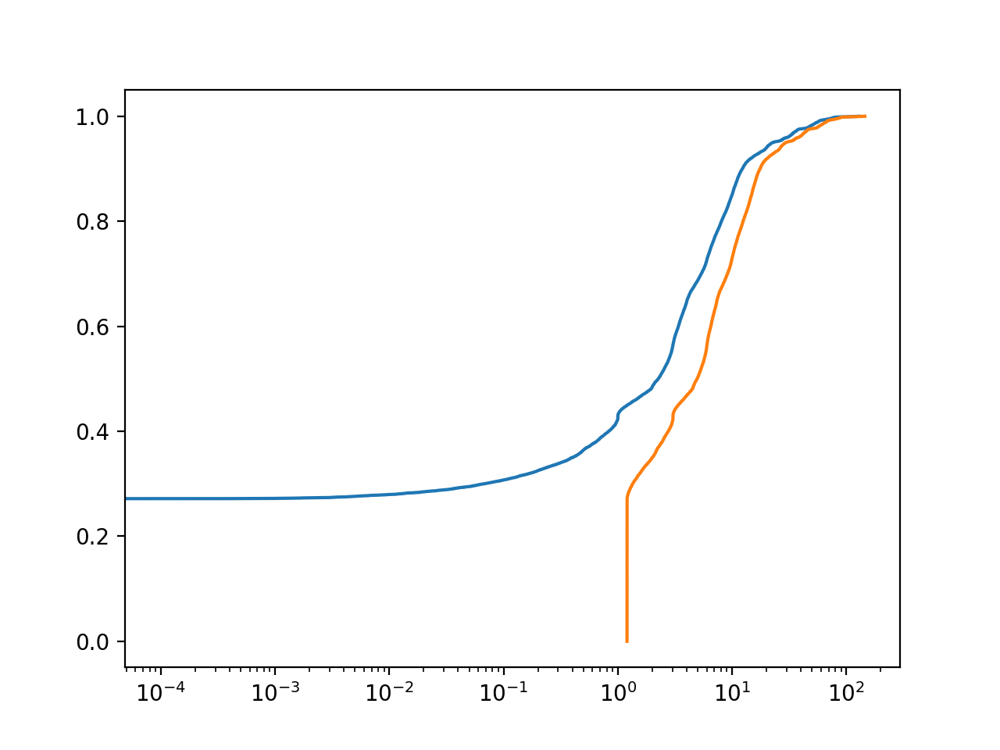

In [83]:
for m in [filteredMovie, shiftFiltered]:
    x = m[::100,::10,::10].flatten()
    plt.plot(sorted(x), np.linspace(0,1,len(x)))
plt.xscale("log")

In [84]:
%matplotlib inline

In [698]:
# filteredMovie.play(fr=30, magnification=4,do_loop=True, plot_text=True)
# filteredMovie.resize(1,1,4./wIron).play(fr=30, magnification=4,do_loop=True, plot_text=True)

In [85]:
diffMovie = m_orig-shiftFiltered

In [86]:
medians = np.median(diffMovie,0)

In [87]:
medians.min(), medians.max()

(movie(-5.68457723), movie(1.29830736))

In [88]:
%matplotlib notebook

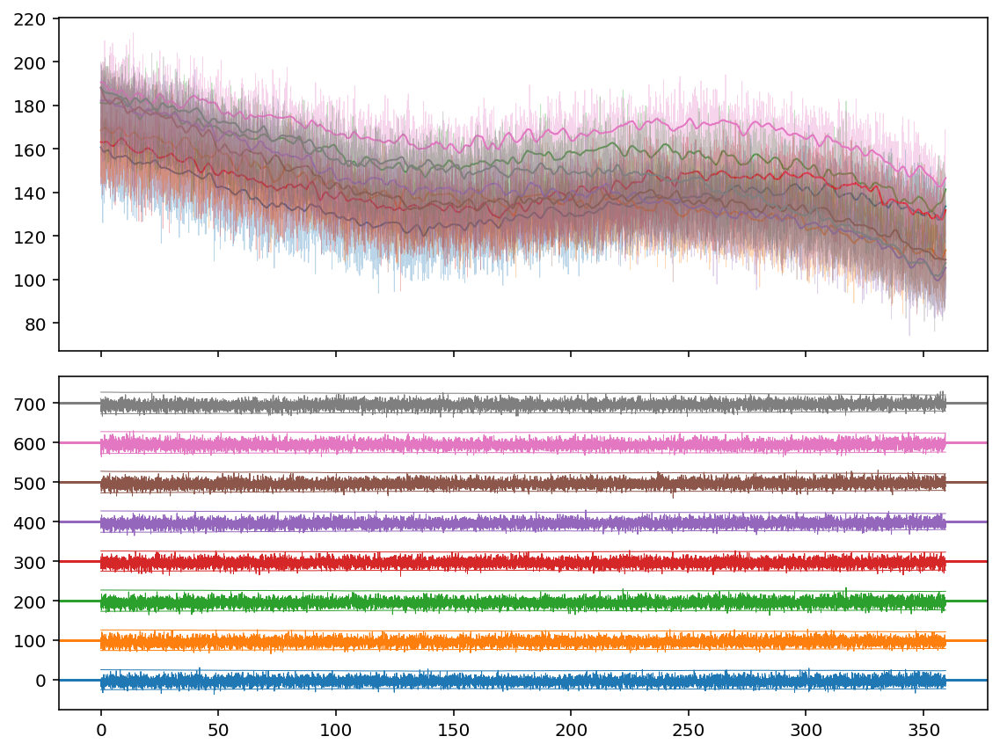

In [157]:
# %%capture
plt.close()
fig, axs = plt.subplots(2,1,figsize=(8,6), sharex=True)
ia = 0
for i,j in zip(*np.where(np.all([-7.1<medians, medians<-4], axis=0))):
#     if ia<3:
#         ia += 1
#         continue
# for di,dj in product([-1,0,1],[-1,0,1]):
#     x = m_orig[:,i+di,j+dj]
    x = m_orig[:,i,j]
#     xf = filteredMovie[:,i,j]
    xf = shiftFiltered[:,i,j]
    axs[0].plot(time,x,c="C%i"%ia,lw=.4,alpha = .3)
    axs[0].plot(time,xf,label=ia,c="C%i"%ia,lw=1)
    yoffset = 100*ia
    axs[1].plot(time,x-xf+yoffset,label=ia,c="C%i"%ia,lw=.5)
    axs[1].plot(time,yoffset+2*xf**.5,c="C%i"%ia,lw=.5)
    axs[1].plot(time,yoffset-2*xf**.5,c="C%i"%ia,lw=.5)
    axs[1].axhline(yoffset,color="C%i"%ia)
#     axs[1]
    ia += 1
    if ia>10:
        break
# plt.xlim(time.max()-100,time.max())
fig.tight_layout()

In [159]:
rnsd = runningStd(diffMovie[:,i,j],2*wIron+1)
rnmn = runningAverage(diffMovie[:,i,j],2*wIron+1)

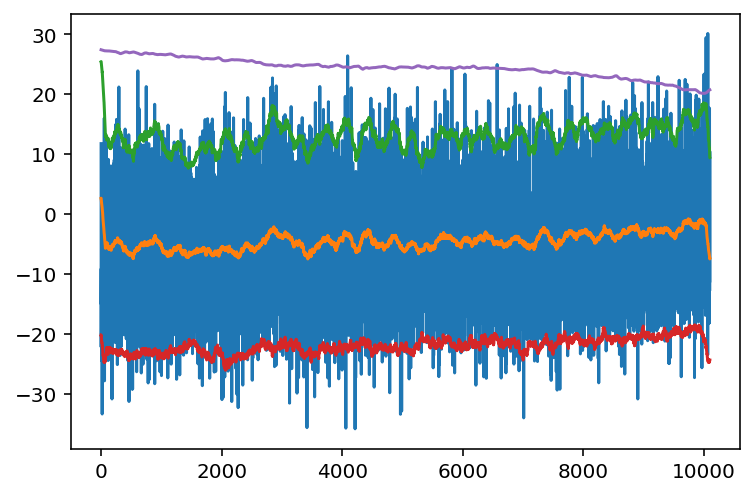

In [160]:
plt.plot(diffMovie[:,i,j])
plt.plot(rnmn)
plt.plot(rnmn+2*rnsd)
plt.plot(rnmn-2*rnsd)
plt.plot(2*xf**.5)

In [700]:
# ts = slice(2800,3200)
# tmp = diffMovie[ts]-diffMovie[ts].min()
# tmp = tmp/tmp.max()*1.3
# movie(np.concatenate([
#     m_orig[ts]/filteredMovie[ts].max(),
#     np.ones_like(m_orig[ts,:2,:]),
#     filteredMovie[ts]/filteredMovie[ts].max(),
#     np.ones_like(m_orig[ts,:2,:]),
#     tmp,
# ],axis=1)).play(magnification=4, fr=100,do_loop=True)

In [164]:
stdFiltered  = shiftFiltered.std(0)
meanFiltered = shiftFiltered.mean(0)

In [165]:
%%capture
cc = shiftFiltered.local_correlations(0,0)

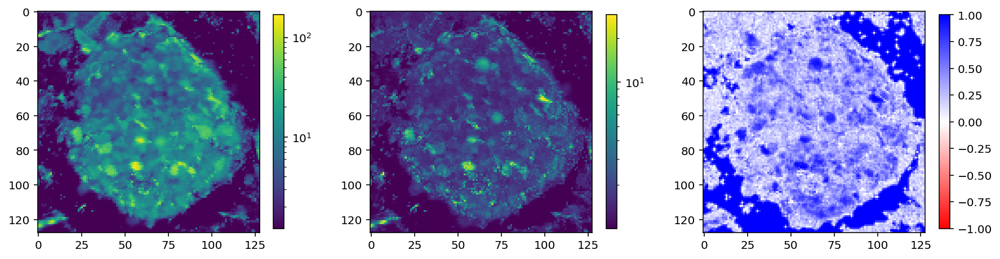

In [166]:
fig, axs = plt.subplots(1,3,figsize=(15,5))
im = axs[0].imshow(meanFiltered, norm=LogNorm())
plt.colorbar(im,ax=axs[0],shrink=.7)
im = axs[1].imshow(1+stdFiltered, norm=LogNorm())
plt.colorbar(im,ax=axs[1],shrink=.7)
try:
    im = axs[2].imshow(cc, cmap="bwr_r", vmin=-1,vmax=1)
    plt.colorbar(im,ax=axs[2],shrink=.7)
except: pass

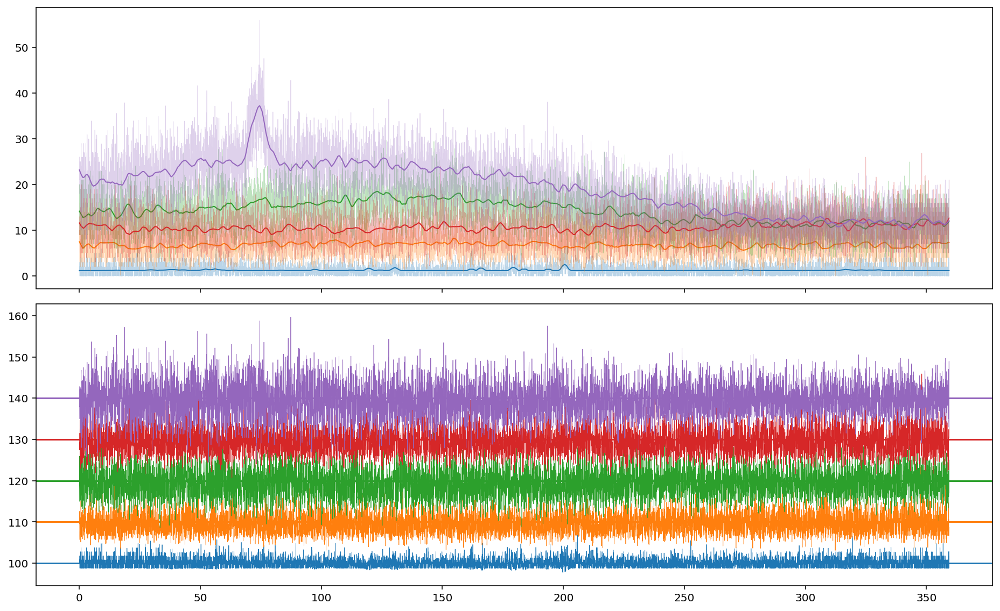

In [167]:
# %%capture
plt.close()
fig, axs = plt.subplots(2,1,figsize=(13,8), sharex=True)
for roi in range(10,15):
    np.random.seed(roi)
    i,j = np.random.choice(stdImg.shape[0],size=2)
    x = m_orig[:,i,j].copy()
    axs[0].plot(time,x,c="C%i"%roi,lw=.4,alpha = .3)
    xf = shiftFiltered[:,i,j].copy()
    axs[0].plot(time,xf,label=roi,c="C%i"%roi,lw=1)
    yoffset = 10*roi
    axs[1].plot(time,x-xf+yoffset,label=roi,c="C%i"%roi,lw=.4)
    axs[1].axhline(yoffset,color="C%i"%roi)
fig.tight_layout()

In [168]:
tmp = np.abs(stdFiltered-3.5)
i,j = np.squeeze(np.where(tmp==tmp.min()))

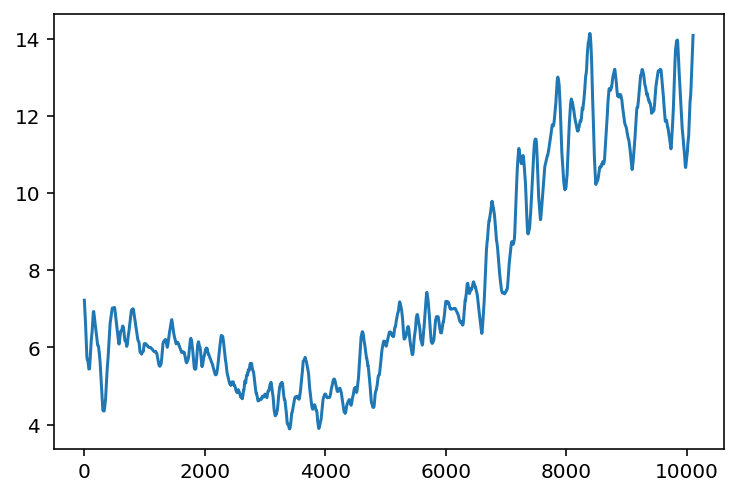

In [169]:
plt.plot(filteredMovie[:,i,j])

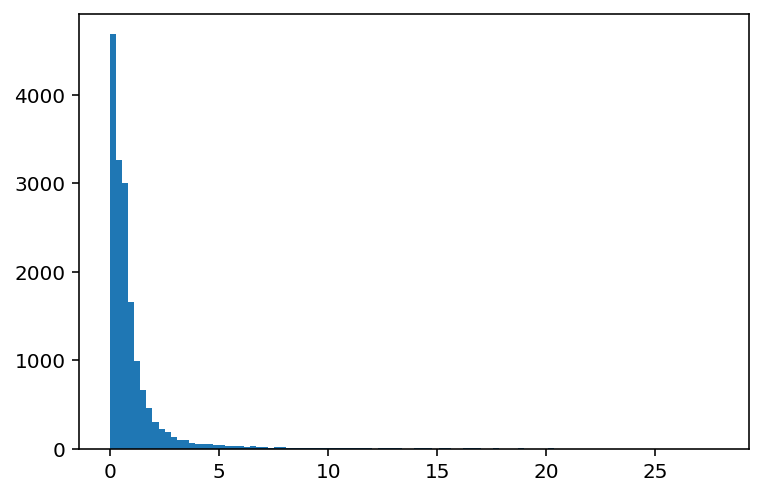

In [170]:
plt.hist(stdFiltered.flatten(),100);

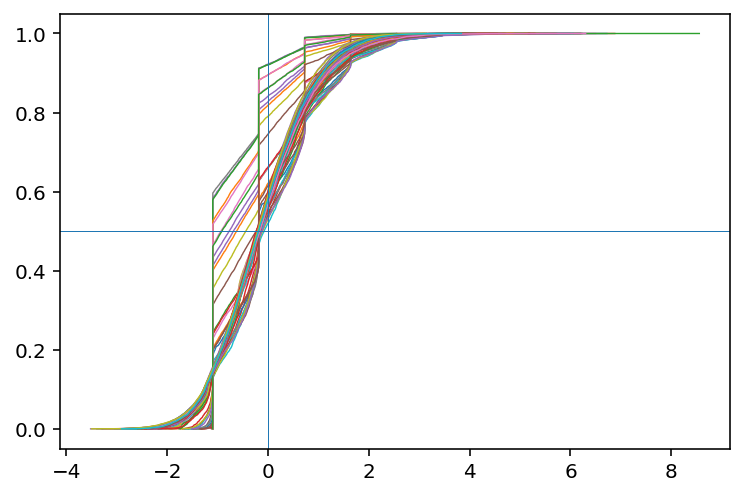

In [171]:
for roi in range(0,100):
    np.random.seed(roi)
    i,j = np.random.choice(stdImg.shape[0],size=2)
    x = diffMovie[:,i,j]/shiftFiltered[:,i,j]**.5
#     sd = 
#     plt.hist(x,1000,lw=.4,histtype="step",density=True,log=True)
    plt.plot(sorted(x),np.linspace(0,1,len(x)),lw=.7,color="C%i"%roi)
plt.axhline(0.5,lw=.5)
plt.axvline(0,lw=.5)

In [172]:
# # %%capture
# plt.close()
# fig, axs = plt.subplots(2,1,figsize=(13,10), sharex=True)
# ia = 0
# for roi in range(200):
#     np.random.seed(roi)
#     i,j = np.random.choice(stdImg.shape[0],size=2)
#     x = m_orig[:,i,j]
#     if sum(x>14)<10: continue
#     xf = filteredMovie[:,i,j].copy()
# #     axs[0].plot(time,x,c="C%i"%roi,lw=.4,alpha = .3)
#     axs[0].plot(time,xf,label=roi,c="C%i"%ia,lw=1)
#     yoffset = 20*ia
#     axs[1].plot(time,x-xf+yoffset,label=roi,c="C%i"%ia,lw=.4)
#     axs[1].axhline(yoffset,color="C%i"%ia)
#     ia += 1
# fig.tight_layout()
# axs[1].set_xlim(0,time.max())

In [174]:
ts = slice(2800,3100)
# diffMovie[ts].play(fr=100,
#          q_max=100,
#          q_min=0,
#          plot_text=True,
#          magnification=3,)

In [212]:
zMovie = (diffMovie[ts]+1)/(shiftFiltered[ts])**.5

In [230]:
n,s = 3,.45
z = np.zeros((5,5))
z[len(z)//2,len(z)//2] = 1
zb  = cv2.GaussianBlur(z,ksize=(n,n),sigmaX=s,sigmaY=s)
zb1 = cv2.GaussianBlur(z,ksize=(n,1),sigmaX=s,sigmaY=s)
with np.printoptions(precision=3, suppress=True):
    print (zb)
    print (zb1)



[[0.    0.    0.    0.    0.   ]
 [0.    0.005 0.062 0.005 0.   ]
 [0.    0.062 0.731 0.062 0.   ]
 [0.    0.005 0.062 0.005 0.   ]
 [0.    0.    0.    0.    0.   ]]
[[0.    0.    0.    0.    0.   ]
 [0.    0.    0.    0.    0.   ]
 [0.    0.072 0.855 0.072 0.   ]
 [0.    0.    0.    0.    0.   ]
 [0.    0.    0.    0.    0.   ]]


In [227]:
#in time 
nt,st = 5, .55
zMovie = movie(cv2.GaussianBlur(
    zMovie.reshape((len(zMovie),-1)),ksize=(nt,1),sigmaX=st, sigmaY=0
).reshape(zMovie.shape))

In [216]:
# in space
zMovie.gaussian_blur_2D(n,n,s,s);

In [206]:
# zMovie[zMovie<2]=2
# zMovie[zMovie>7]=7

In [217]:
zMovie.play(fr=15,
         q_max=100,
         q_min=0,
         plot_text=True,
         magnification=3,)

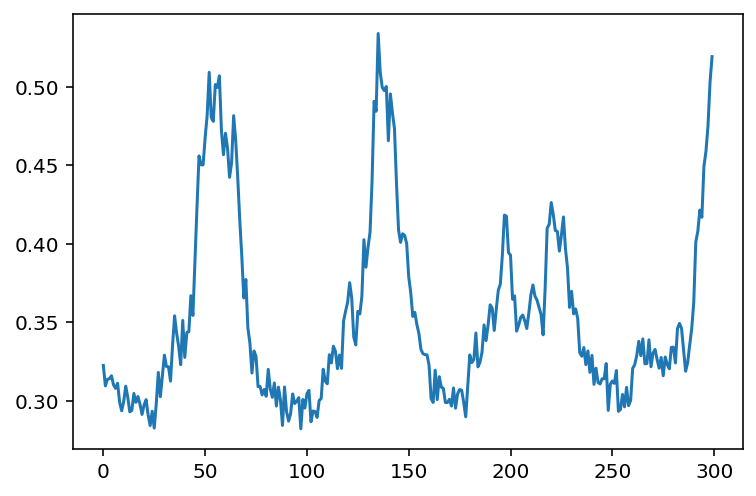

In [218]:
plt.plot(zMovie.mean((1,2)))

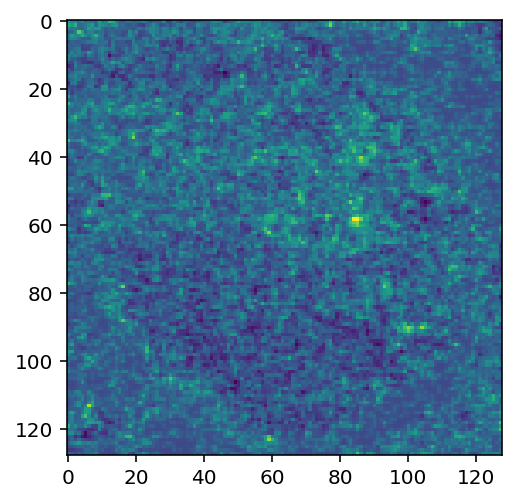

In [219]:
plt.imshow(zMovie[140])

In [519]:
zMovie.min(),zMovie.max()

(movie(-3.51472612), movie(8.61628849))

In [520]:
# tmp = diffMovie.copy()


In [522]:
ts = slice(2000,3000)
diffMovie[ts].play(fr=100,
         q_max=10.,
         q_min=0,
         plot_text=True,
         magnification=3,)

In [506]:
highZ = np.where(zMovie>5)

In [507]:
highZ

(array([    0,     0,     1, ..., 15147, 15150, 15151]),
 array([ 45, 116,   5, ...,  99, 102,   3]),
 array([115, 126,  90, ..., 120, 127,  97]))

In [498]:
t,i,j = np.squeeze(np.where(zMovie==zMovie.max()))

In [504]:
i,j

(6, 123)

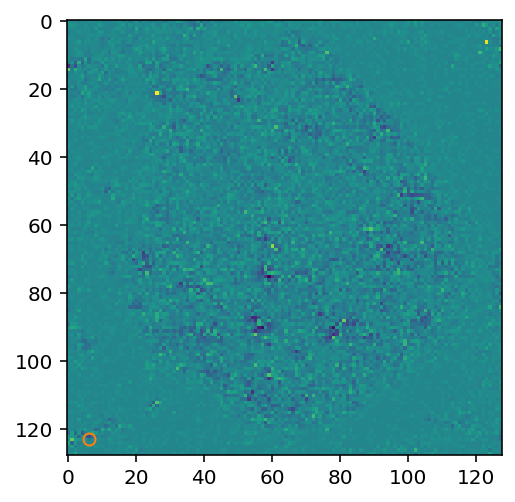

In [503]:
plt.imshow(diffMovie[t])
plt.plot(i,j,"C1o", mfc="none")

In [500]:
diffMovie[t-100:t+100].play(fr=50)

In [481]:
(zMovie>3).sum()

movie(702648)

In [484]:
diffMovie[2000:3000].play(fr=300)

In [525]:
tmp = np.clip(zMovie[2000:3000],3,8)
tmp = tmp-tmp.min()
tmp = 1-tmp/tmp.max()
tmp.play(fr=100,
         q_max=100,
         q_min=0,
         plot_text=True,
         magnification=3,)

### Correct for median/mean

In [174]:
PredictedSigmas = np.zeros_like(meanImg)
PredictedLocs   = np.zeros_like(meanImg)
# for i,j in product(np.arange(metadata.X),np.arange(metadata.Y)):
for i,j in np.array(np.where(np.isfinite(filteredMovie[0]))).T:
    lc,sg = predictLocSd(diffMovie[:,i,j])
#     diffMovie[:,i,j] -= lc
#     filteredMovie[:,i,j] += lc
    PredictedSigmas[i,j] = sg
    PredictedLocs  [i,j] = lc

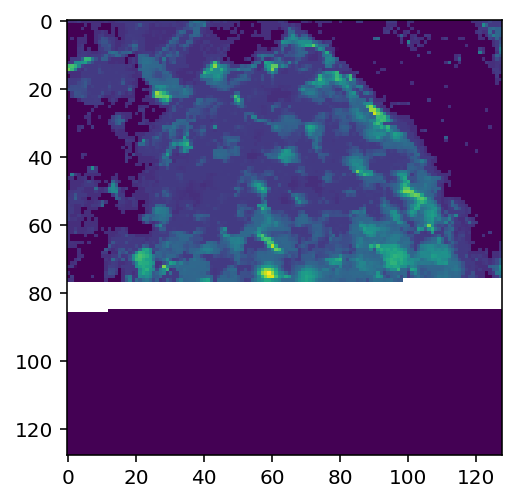

In [175]:
plt.imshow(PredictedLocs)

In [ ]:
filteredMovie.mean(0).f

In [442]:
medians = np.median(diffMovie,axis=0)

In [445]:
filteredMovie += medians
diffMovie     -= medians

In [446]:
diffMovie.max()

movie(62.9608019)

In [447]:
diffMovie.play(fr=200, magnification=4,do_loop=True,q_max=99.8)

In [523]:
filteredMovie.min()

movie(-0.82997036, dtype=float32)

In [358]:
tmp = diffMovie-diffMovie.min()
tmp = np.minimum(tmp,np.percentile(tmp,99.9))

In [363]:
movie(np.concatenate([
    filteredMovie,
    np.ones_like(m_orig[:,:,:2])*m_orig.max(),
    tmp/tmp.max()*filteredMovie.max(),
],axis=2)).play(magnification=3, fr=200,do_loop=True)

In [368]:
tmp = filteredMovie[100:200]
cf = tmp.local_correlations(1,0)

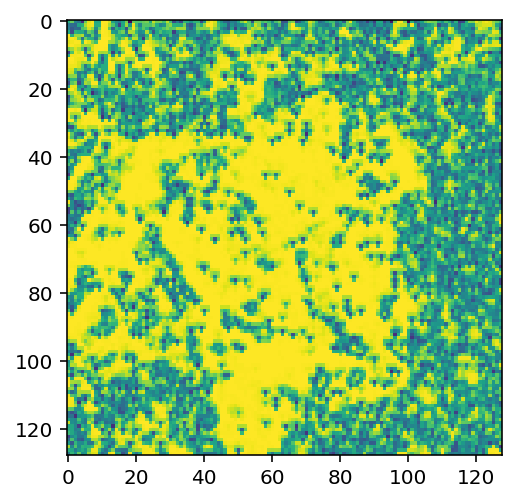

In [369]:
plt.imshow(cf.T)

In [449]:
z_movie = diffMovie/filteredMovie**.5

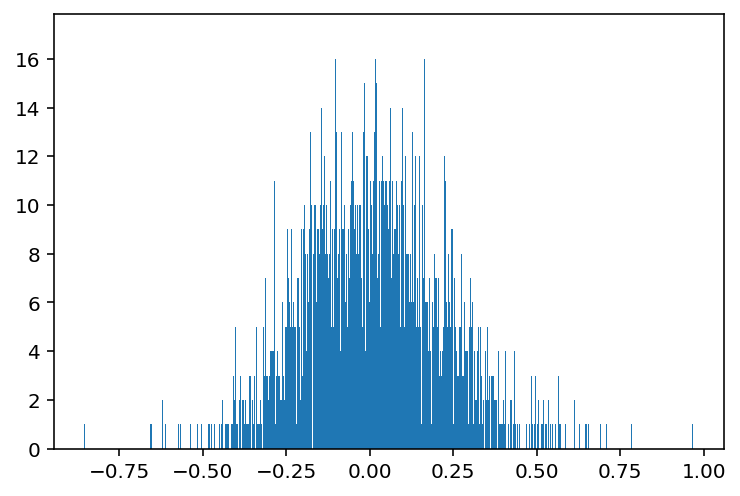

In [450]:
plt.hist(z_movie[:,0,0], 1000);

In [91]:
rnd = 0

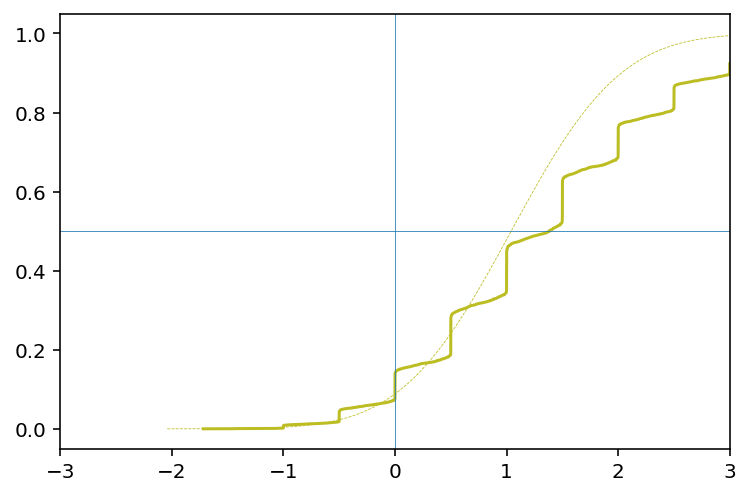

In [94]:
for rnd in range(rnd+1,1000):
    np.random.seed(rnd)
    i,j = np.random.choice(stdImg.shape[0],size=2)
    x = diffMovie[:,i,j]
    lc,sg = predictLocSd(x)
    if np.abs(lc-np.median(x))>.3:
        plt.plot(sorted(x), np.linspace(0,1,len(x)),"C%i"%(rnd%10))
        xr = np.linspace(lc-4*sg,lc+4*sg,1000)
        plt.plot(xr,dst.norm.cdf(xr,loc=lc,scale=sg),"C%i--"%(rnd%10),lw=.4)
#         plt.plot(ps,sfs,".")
        break
#     break
plt.xlim(-3,3)
plt.axhline(.5,lw=.4)
plt.axvline(0,lw=.4)

In [517]:
i,j

(124, 38)

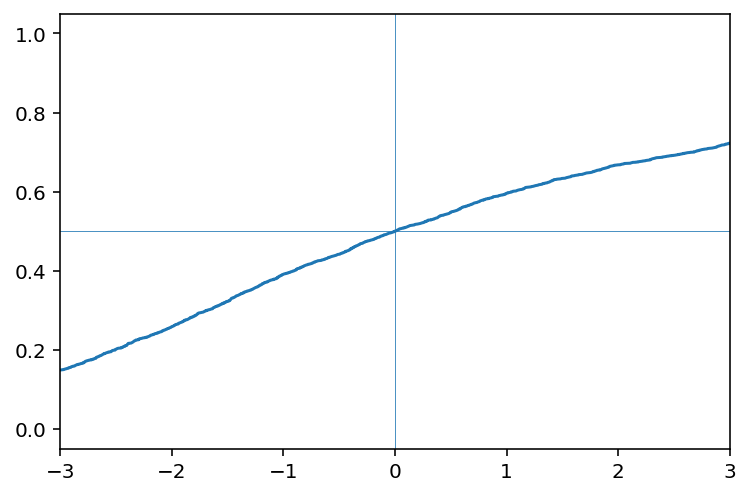

In [522]:
plt.plot(sorted(diffMovie[:,i,j]), np.linspace(0,1,len(x)))
plt.xlim(-3,3)
plt.axhline(.5,lw=.4)
plt.axvline(0,lw=.4)

In [493]:
predictLocSd(diffMovie[:,i,j])

(-0.3615301651859033, 0.8173868698855067)

In [494]:
diffMovie[:,i,j] -= lc

In [495]:
filteredMovie[:,i,j] += lc

In [512]:
[(i,j) for i,j in product(np.arange(3),np.arange(3))]

[(0, 0), (0, 1), (0, 2), (1, 0), (1, 1), (1, 2), (2, 0), (2, 1), (2, 2)]

In [537]:
PredictedSigmas = np.zeros_like(meanImg)
PredictedLocs   = np.zeros_like(meanImg)
for i,j in product(np.arange(metadata.X),np.arange(metadata.Y)):
    lc,sg = predictLocSd(diffMovie[:,i,j])
#     diffMovie[:,i,j] -= lc
#     filteredMovie[:,i,j] += lc
    PredictedSigmas[i,j] = sg
    PredictedLocs  [i,j] = lc

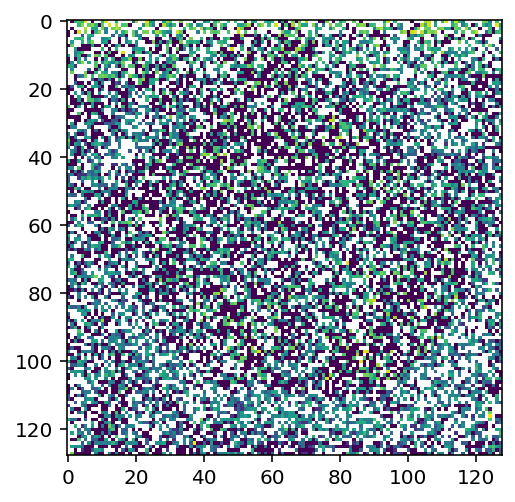

In [538]:
plt.imshow(np.array(PredictedLocs), norm=LogNorm())

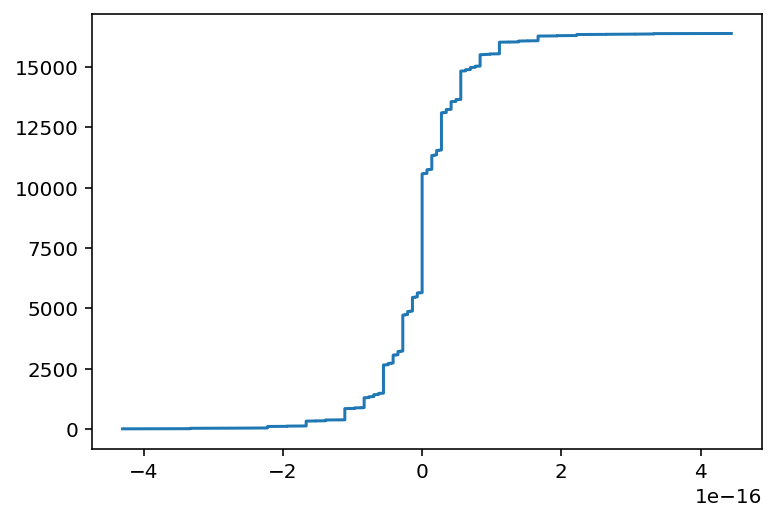

In [539]:
plt.plot(sorted(PredictedLocs.flatten()), np.arange(PredictedLocs.size))

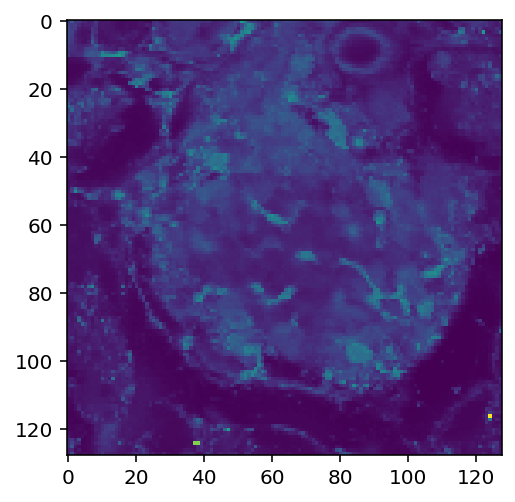

In [542]:
plt.imshow(PredictedSigmas)

In [547]:
# plt.plot(meanImg.flatten()**.5,PredictedSigmas.flatten(),".")
# plt.gca().set_aspect("equal")
# plt.grid()

In [548]:
stdFiltered = filteredMovie.std(0)

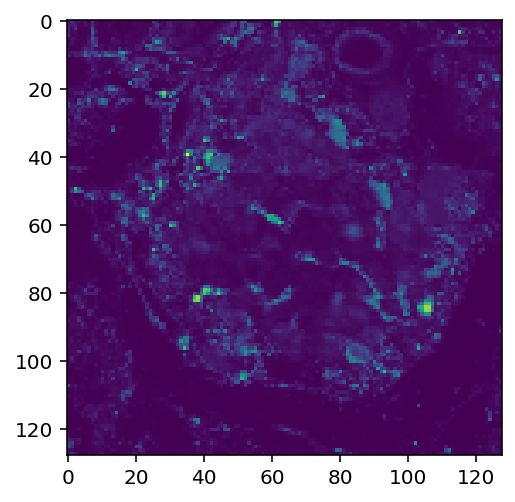

In [550]:
plt.imshow(stdFiltered)

In [553]:
filteredMovie.reshape((-1,meanImg.size)).shape

(2878, 16384)

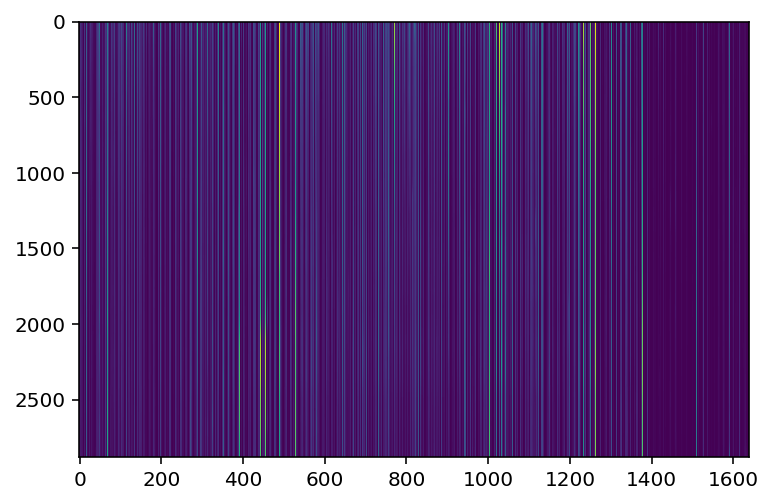

In [552]:
plt.imshow(filteredMovie.reshape((-1,meanImg.size))[:,::10])
plt.gca().set_aspect("auto")

In [ ]:
cc0 = filteredMovie.local_correlations(1,0)
cc1 = diffMovie.local_correlations(1,0)

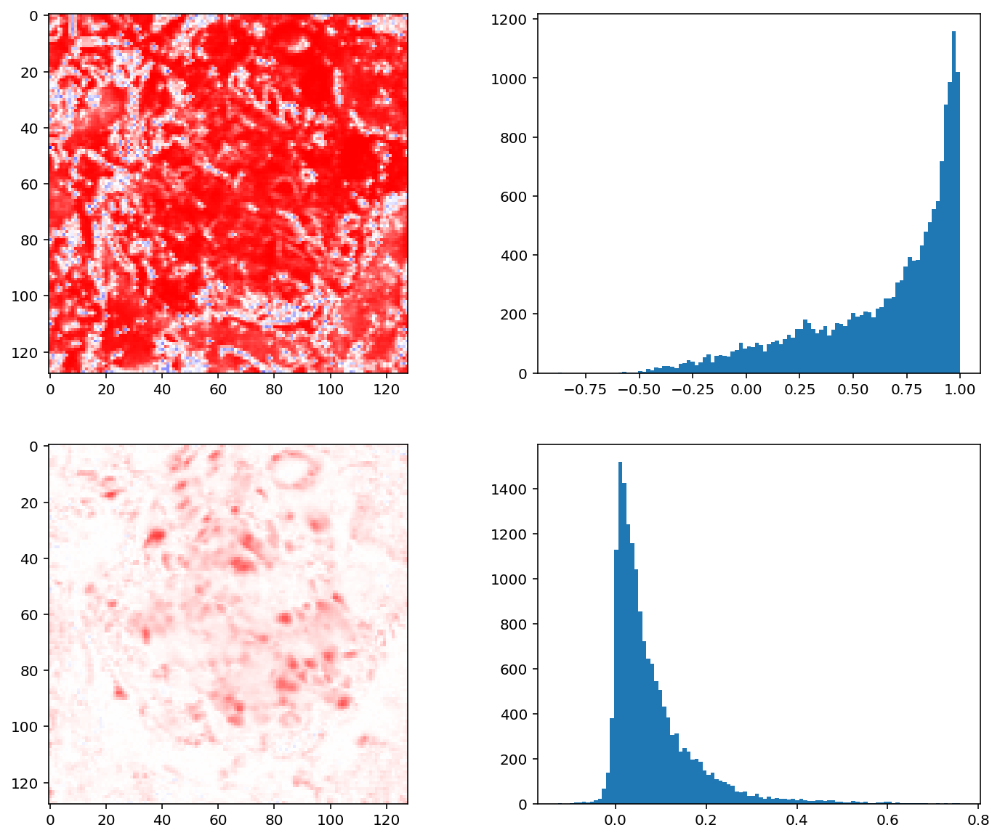

In [561]:
fig, axs = plt.subplots(2,2,figsize=(12,10))
for axx,cc in zip(axs,[cc0,cc1]):
    axx[0].imshow(cc,cmap="bwr",vmin=-1,vmax=1)
    axx[1].hist(cc.flatten(),100);

In [564]:
tmp = np.zeros(meanImg.shape+(3,))

In [568]:
tmp[:,:,0] = cc0
tmp[:,:,1] = cc1
tmp[:,:,2] = -cc0

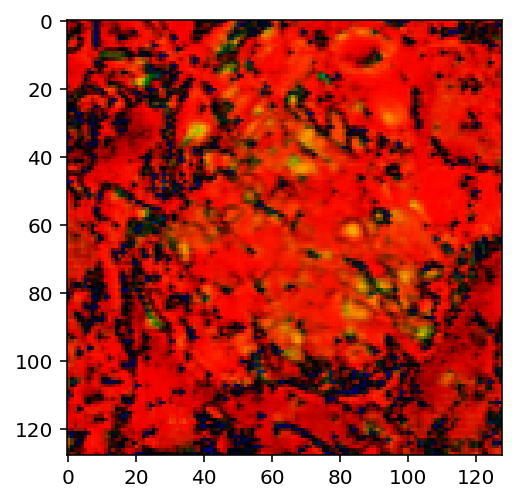

In [569]:
plt.imshow(tmp)

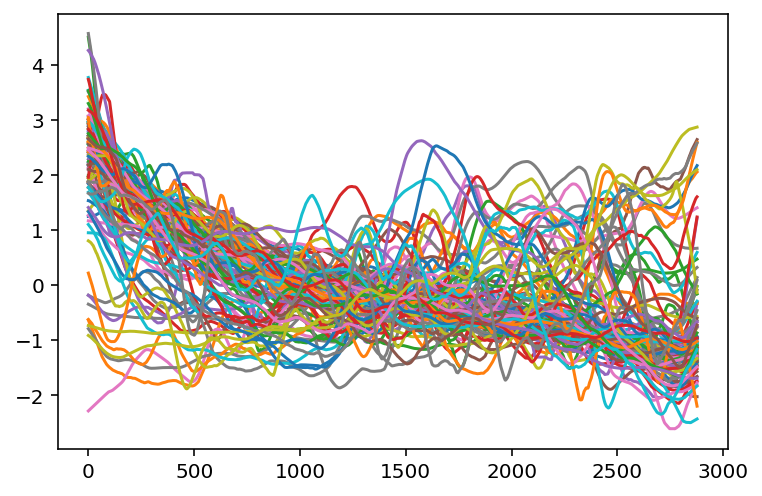

In [575]:
for rnd in range(100):
    np.random.seed(rnd*10)
    i,j = np.random.choice(stdImg.shape[0],size=2)
    x = filteredMovie[:,i,j].copy()
    x = x-x.mean()
    x /= x.std()
    plt.plot(x)

### account for bleaching (separate debleached)

In [718]:
from numeric import decay, decayfit, guessDecayPars

In [710]:
filtMedian = np.median(filteredMovie,(1,2))

In [654]:
filtMean = filteredMovie.mean((1,2))

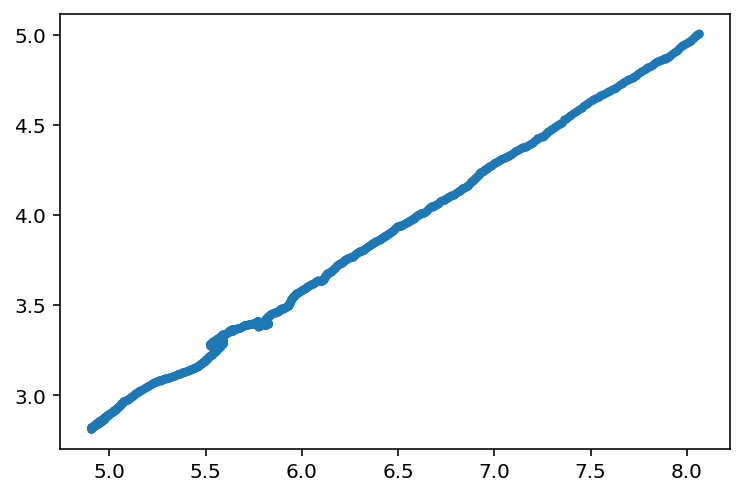

In [711]:
plt.plot(filtMean.flatten(), filtMedian.flatten(), ".")

In [726]:
movie(zb)

movie([[0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        ],
       [0.        , 0.        , 0.00163118, 0.03712553, 0.00163118,
        0.        , 0.        ],
       [0.        , 0.        , 0.03712553, 0.84497315, 0.03712553,
        0.        , 0.        ],
       [0.        , 0.        , 0.00163118, 0.03712553, 0.00163118,
        0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        ]])

In [724]:
m_blurred.gaussian_blur_2D(n,n,s,s)

NameError: name 'gaussian_blur_2D' is not defined

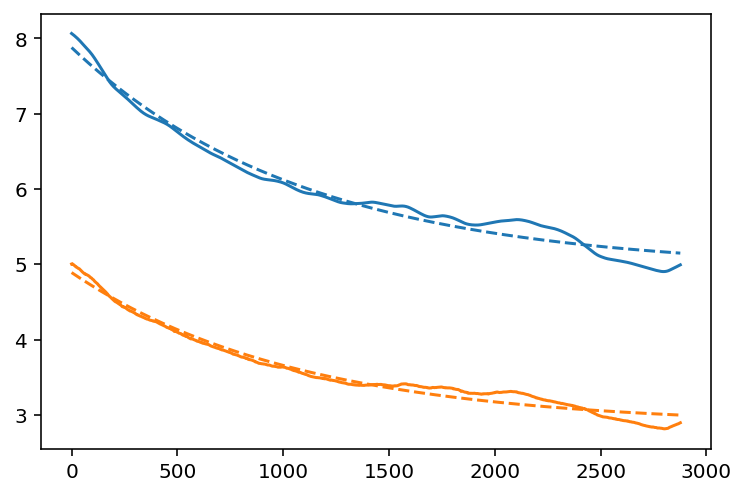

In [713]:
for x in [filtMean,filtMedian]:
    c = plt.plot(x)[0].get_color()
    plt.plot(decayfit(x),"--",c=c)

In [752]:
decFit = decayfit(filtMedian)

In [753]:
decFit = decFit/np.linalg.norm(decFit)

In [754]:
x = filteredMovie[:,10,100]

In [755]:
w = x.dot(decFit)#/np.linalg.norm(decFit)**2

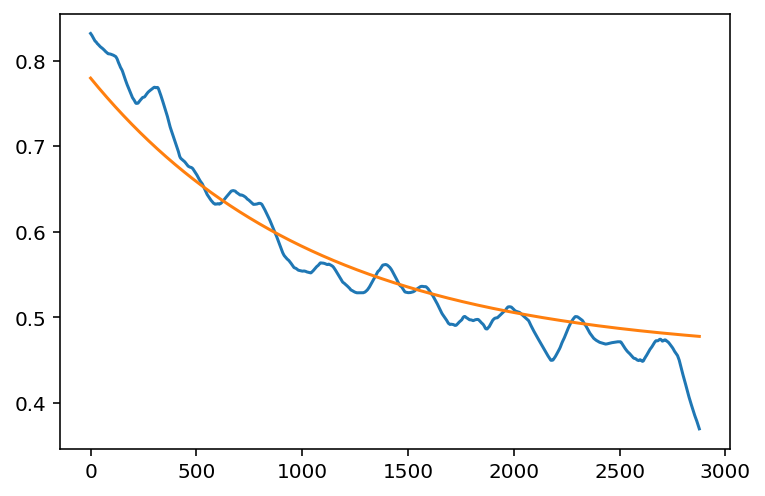

In [756]:
plt.plot(x)
plt.plot(w*decFit)

In [839]:
bleachingMovie = np.zeros_like(filteredMovie)
for i,j in product(range(meanImg.shape[0]),range(meanImg.shape[1])):
    bleachingMovie[:,i,j] = filteredMovie[:,i,j].dot(decFit) * decFit

In [840]:
# bleachingMovie[::10].play(fr=100,magnification=3,do_loop=True)

In [841]:
debleachedMovie = filteredMovie-bleachingMovie

In [842]:
# debleachedMovie[::10].play(fr=100,magnification=3,do_loop=True)

In [843]:
tmp = movie(np.zeros(debleachedMovie.shape+(3,)))

In [844]:
tmp[:,:,:,0] = np.maximum(0,-debleachedMovie)
# tmp[:,:,:,1] = debleachedMovie.max()
tmp[:,:,:,2] = np.maximum(0, debleachedMovie)

In [845]:
tmp[::5].play(fr=500, magnification=4,do_loop=True)

In [827]:
debleachedMovie[::10].play(fr=400,magnification=4,do_loop=True)

In [850]:
from collections import OrderedDict

In [ ]:
n = 5
cc = OrderedDict()

In [855]:
for s in [.1,.2,.3,.4,.5,.6,.7,.8]:
    if s in cc: continue
    cc[s] = movie(cv2.GaussianBlur(debleachedMovie, (n, n), s,s)).local_correlations(1,0)

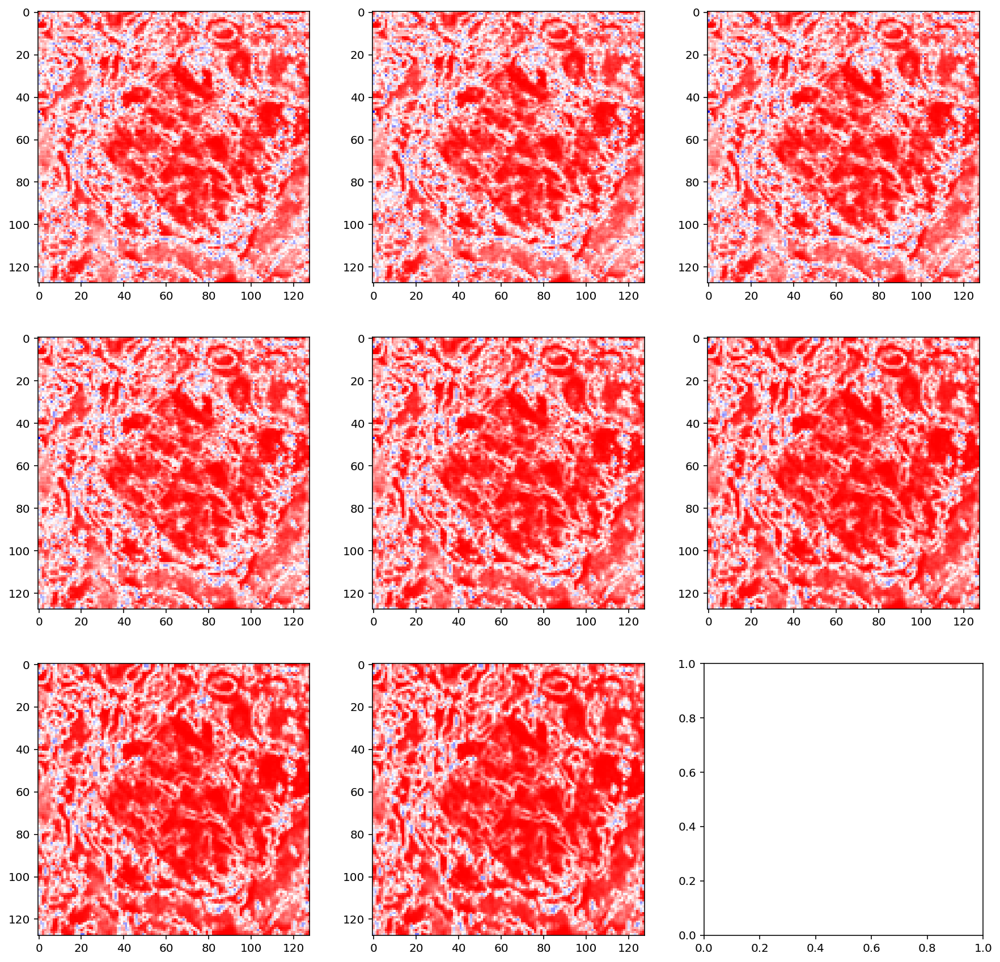

In [901]:
fig, axs = plt.subplots(3,3, figsize=(15,15))
for ax,k in zip(axs.flat,sorted(cc)):
    ax.imshow(cc[k],cmap="bwr",vmin=-1,vmax=1)

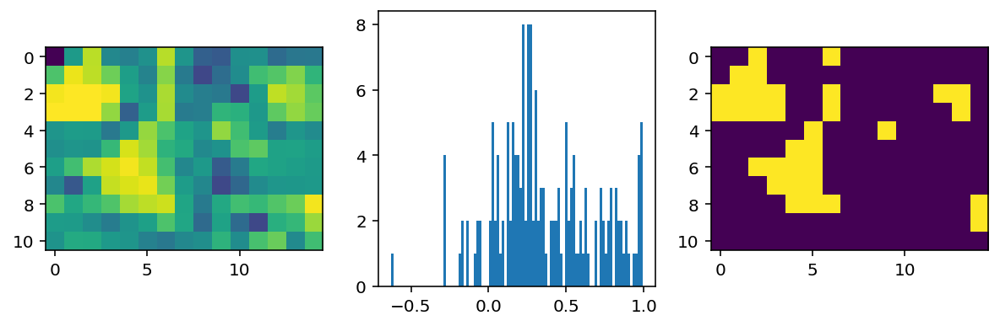

In [902]:
ioff, joff = 4,0
c = cc[.1][ioff:15,joff:15]
fig, axs = plt.subplots(1,3,figsize=(10,3))
axs[0].imshow(c)
axs[1].hist(c.flatten(),100)
axs[2].imshow(c>.7)

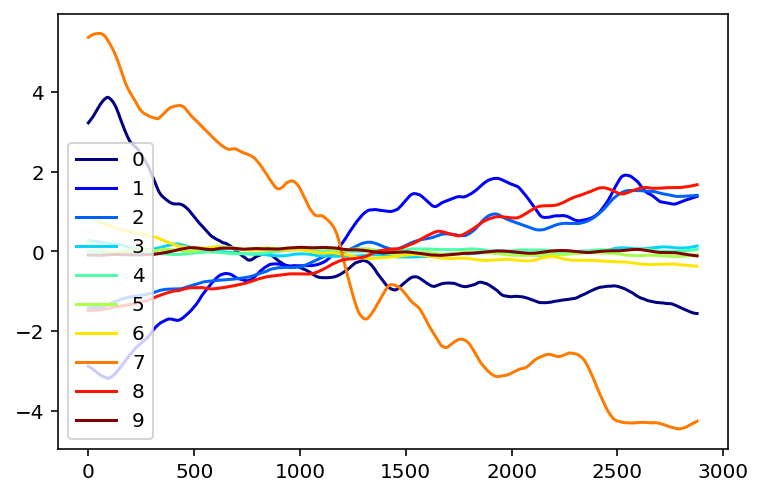

In [900]:
js = np.arange(10)
for j in js:
    x = debleachedMovie[:,ioff,j]
    plt.plot(x, c=plt.cm.jet(j/js.max()),label=j)
plt.legend()

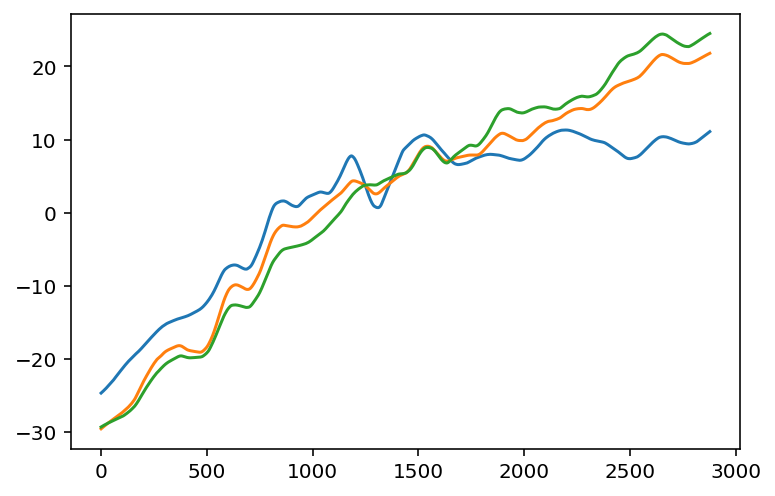

In [866]:
for i,j in [(0,0),(0,1),(0,2)]:
    i += 10
    j += 10
    plt.plot(debleachedMovie[:,i,j])

In [894]:
# plt.imshow(np.diff(debleachedMovie,0).local_correlations(1,0))
# plt.imshow(debleachedMovie.local_correlations(1,0))

In [ ]:
plt.imshow(diffMovie.)

In [ ]:
deca

# investigate dMovie

## Masking the dMovie to islet only

In [87]:
dMovie_50 = np.median(dMovie,0)

In [88]:
dMovie_99 = np.percentile(dMovie,99,axis=0)

In [89]:
%matplotlib inline

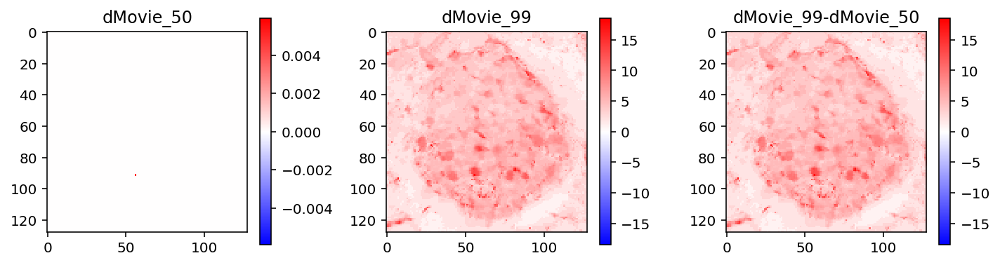

In [90]:
fig, axs = plt.subplots(1,3,figsize=(10,3.5))
for ax,mt in zip(axs,["dMovie_50", "dMovie_99", "dMovie_99-dMovie_50"]):
    ax.set_title(mt)
    m = eval(mt)
    im = ax.imshow(m,cmap="bwr",vmax=np.abs(m).max(),vmin=-np.abs(m).max())
    plt.colorbar(im,ax=ax,shrink=.7)
fig.tight_layout()
plt.ioff()

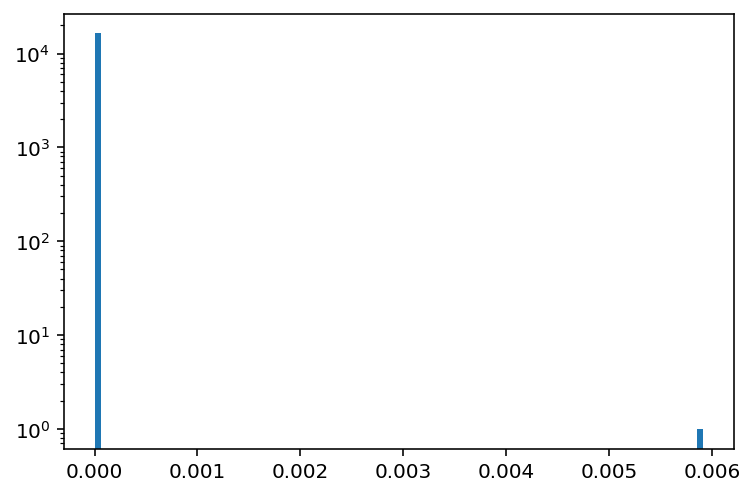

In [95]:
plt.hist(dMovie_50.flatten(),100);
plt.yscale("log")

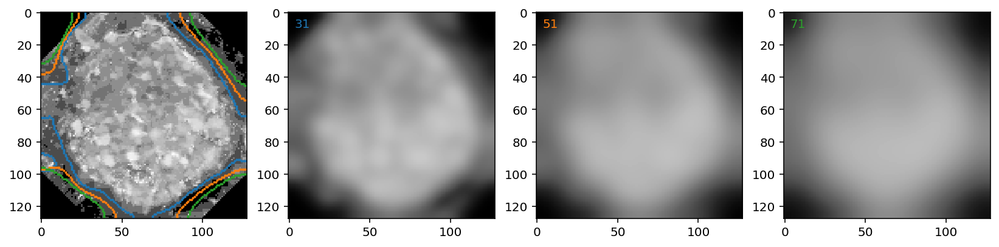

In [96]:
M2blurr = dMovie_99.copy()
maskThreshold = .4

cutDistance = 30

for i in range(M2blurr.shape[0]):
    for j in range(M2blurr.shape[1]):
        for i0, j0 in product([0,M2blurr.shape[0]],[0,M2blurr.shape[1]]):
            if np.abs(i-i0)+np.abs(j-j0)<cutDistance:
                M2blurr[i,j] = M2blurr.min()

vmin = M2blurr.min()
vmax = M2blurr.max()
fig, axs = plt.subplots(1,4,figsize=(14,3.5))
for ax,ks in zip(axs.flat,[1,31,51,71,91]):
    m = cv2.GaussianBlur(M2blurr,(ks,ks),0)
    ax.imshow(m,norm=LogNorm(),vmin=vmin, vmax=vmax, cmap="Greys_r")
    
    
    if ks>1:
        
        mt = m>m.max()*maskThreshold
        x,y = np.where(cv2.Laplacian(mt.astype(float),cv2.CV_64F,)>0)
        c=axs.flat[0].plot(y,x,".",ms=2)[0].get_color()
        ax.text(0.03,.97,ks,transform=ax.transAxes,color=c,va="top")
#     break

In [75]:
kMask = 51
m = cv2.GaussianBlur(M2blurr,(ks,ks),0)
mt = m>m.max()*maskT

In [76]:
dMovie[(slice(None),)+np.where(~mt)] = 0

## Stats

In [412]:
%%capture
ccd = dMovie.local_correlations(1,0)

In [98]:
%%capture
ccd_rebinned = rebin(dMovie,10).local_correlations(1,0)

In [163]:
%matplotlib notebook

<IPython.core.display.Javascript object>


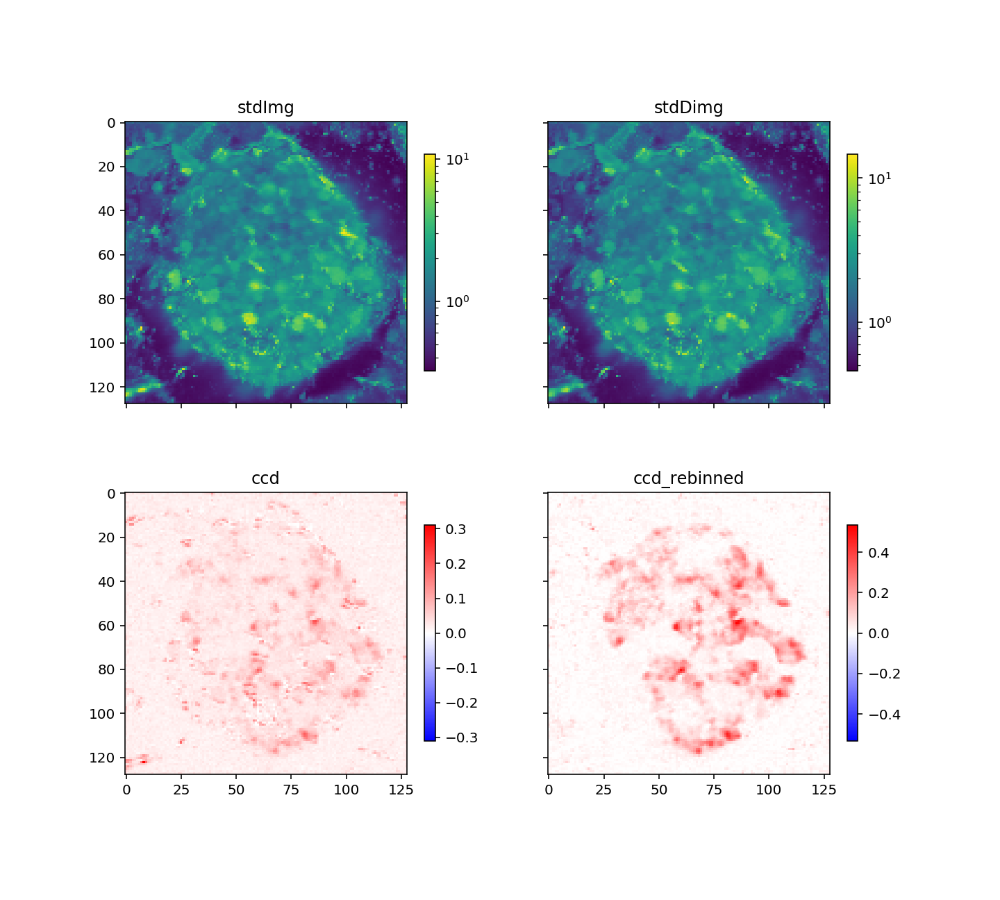

In [106]:
fig, axs = plt.subplots(2,2,figsize=(10,9), sharex=True, sharey=True)
# fig, axs = plt.subplots(2,2,figsize=(10,3.5))
for ax,mt in zip(axs.flat,["stdImg", "stdDimg", "ccd", "ccd_rebinned"]):
    ax.set_title(mt)
    m = eval(mt)
    if np.any(m<0) or 'cc' in mt:
        im = ax.imshow(m,cmap="bwr",vmax=np.abs(m).max(),vmin=-np.abs(m).max())
    else:
        im = ax.imshow(m,norm=LogNorm())
#     im = ax.imshow(m,cmap="bwr",vmax=np.abs(m).max(),vmin=-np.abs(m).max())
#     im = ax.imshow(m,cmap="jet",vmax=np.nanmax(np.abs(m)),vmin=0)
    plt.colorbar(im,ax=ax,shrink=.7)
# fig.tight_layout()
# plt.ioff()
# axs[0].imshow(ccd, cmap="jet")
# axs[1].imshow(ccd_rebinned, cmap="jet")
# axs[2].imshow(ccd_rebinned>.15, cmap="Greys")

<IPython.core.display.Javascript object>


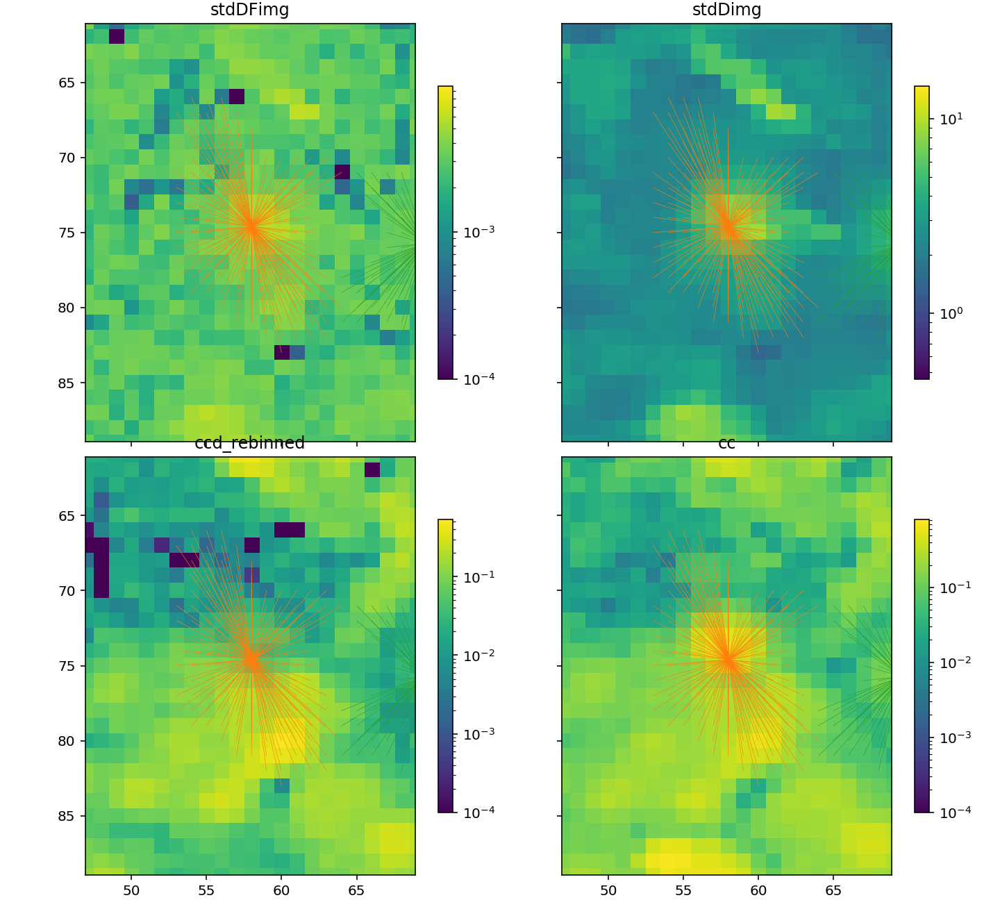

In [165]:
fig, axs = plt.subplots(2,2,figsize=(10,9), sharex=True, sharey=True)
# fig, axs = plt.subplots(2,2,figsize=(10,3.5))
for ax,mt in zip(axs.flat,["stdDFimg", "stdDimg", "ccd_rebinned","cc"]):
    ax.set_title(mt)
    m = eval(mt)
#     if np.any(m<=0) or 'cc' in mt:
#         im = ax.imshow(m,cmap="bwr",vmax=np.abs(m).max(),vmin=-np.abs(m).max())
#     else:
    im = ax.imshow(m+1e-4,norm=LogNorm())
    plt.colorbar(im,ax=ax,shrink=.7)
    for j in C.query("100<size<400").index:
        c = ax.plot([])[0].get_color()
        # k = C.loc[j,"center"]
        k = np.mean(C.loc[j,"hood"], axis=0)
        for el in C.loc[j,"hood"]:
            ax.plot([el[1],k[1]],[el[0],k[0]],lw=.3,c=c,alpha = 1)
fig.tight_layout()

## investigate zMovie

In [413]:
zMovie = dMovie/m_s

In [414]:
%%capture
ccz = zMovie.local_correlations(1,0)

In [415]:
tmp = zMovie>2
actTime = np.diff(tmp.astype(int),axis=0)>0
del tmp

In [419]:
nAct = actTime.sum(0)

In [416]:
%%capture
cca = rebin(actTime,20).local_correlations(1,0)

In [578]:
%matplotlib notebook

<IPython.core.display.Javascript object>


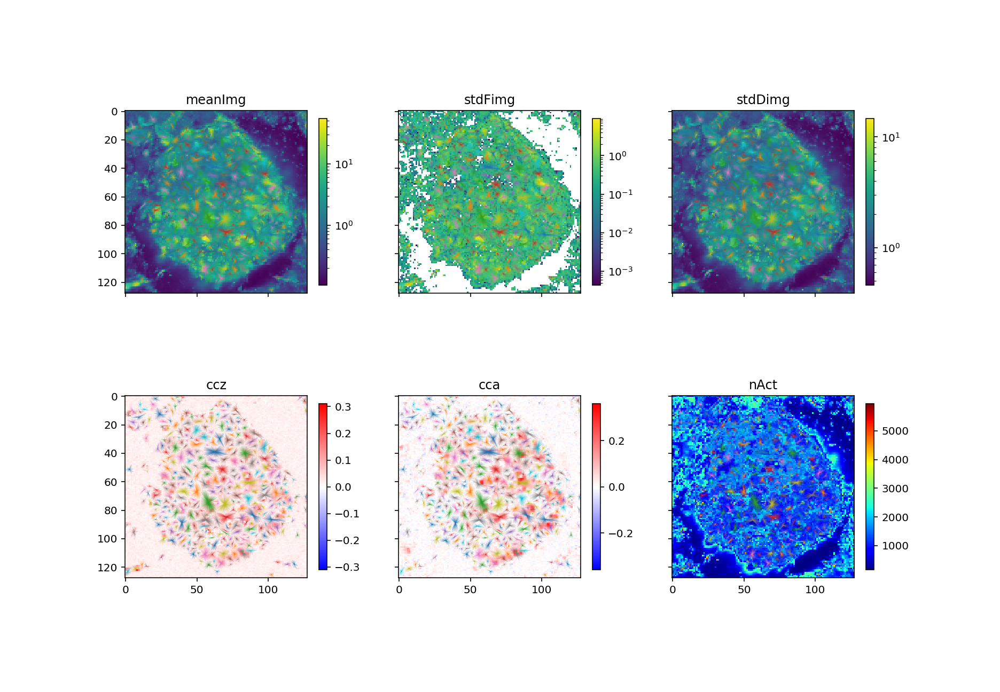

In [580]:
fig, axs = plt.subplots(2,3,figsize=(13,9), sharex=True, sharey=True)
# fig, axs = plt.subplots(2,2,figsize=(10,3.5))
for ax,mt in zip(axs.flat,["meanImg", "stdFimg", "stdDimg", "ccz", "cca","nAct"]):
    ax.set_title(mt)
    m = eval(mt)
    if 'nAct' in mt:
        im = ax.imshow(m,cmap="jet")
    elif np.any(m<0) or 'cc' in mt:
        im = ax.imshow(m,cmap="bwr",vmax=np.abs(m).max(),vmin=-np.abs(m).max())
    else:
        im = ax.imshow(m,norm=LogNorm())
    plt.colorbar(im,ax=ax,shrink=.7)
#     im = ax.imshow(m,cmap="bwr",vmax=np.abs(m).max(),vmin=-np.abs(m).max())
#     im = ax.imshow(m,cmap="jet",vmax=np.nanmax(np.abs(m)),vmin=0)
#     plt.colorbar(im,ax=ax,shrink=.7)
    for j in C.query("8<size<400").index:
        c = ax.plot([])[0].get_color()
        # k = C.loc[j,"center"]
        k = np.mean(C.loc[j,"hood"], axis=0)
        for el in C.loc[j,"hood"]:
            ax.plot([el[1],k[1]],[el[0],k[0]],lw=.3,c=c,alpha = .5)

<IPython.core.display.Javascript object>


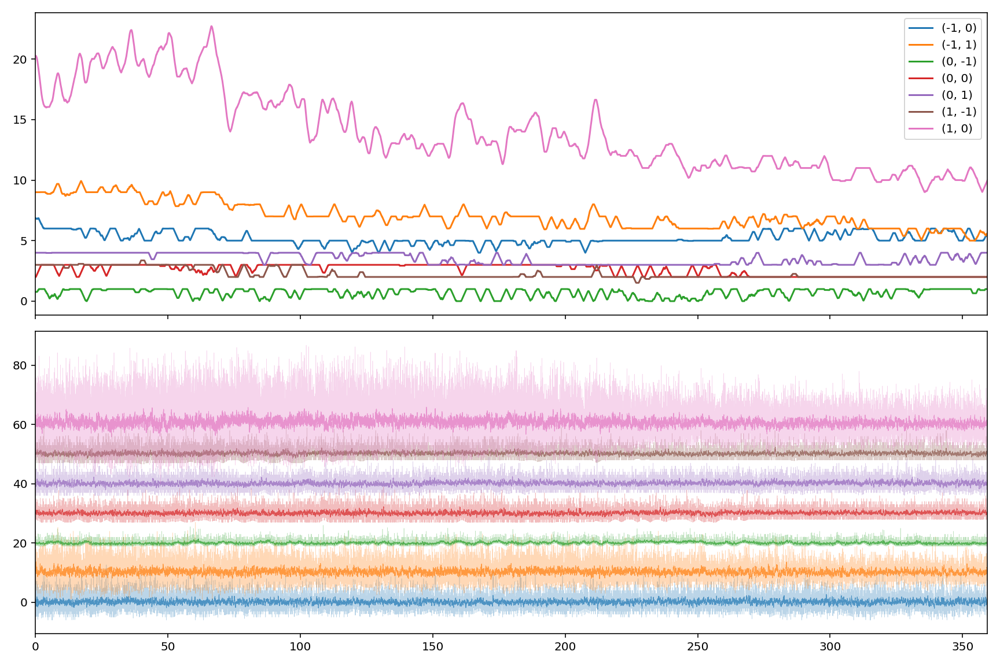

/Users/srdjan/anaconda2/envs/caiman/lib/python3.7/site-packages/ipykernel_launcher.py:13: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  del sys.path[0]


In [430]:
i,j = 71,28
fig, axs = plt.subplots(2,1,figsize=(12,8), sharex=True)
ia = 0
for di,dj in product([-1,0,1],[-1,0,1]):
    if np.abs(di+dj)>1: continue
    axs[0].plot(time, m_50[:,i+di,j+dj],label=(di,dj))
    x = dMovie[:,i+di,j+dj]+10*ia
    c = axs[1].plot(time, x,lw=.3,alpha = .3)[0].get_color()
    axs[1].plot(time, runningAverage(x,13),lw=.5,alpha = .7,c=c)
    ia += 1
axs[0].legend()
plt.xlim(0,time.max())
fig.tight_layout()

In [399]:
# axs[1,2].imshow(ccz-ccd)

### See some regions

In [140]:
intrsRoiCenters = getInterestingROIcenters(
    cv2.GaussianBlur(nAct.astype(float),(5,5),0.5),
    exponent=10)

In [ ]:
fig, axs = plt.subplots(2,3,figsize=(11,6), sharex=True, sharey=True)
for ax,m in zip(axs.T.flat,["meanImg", "stdImg", "cc", "cca", "2000+nAct", "ccz"]):
    ax.set_title(m)
    m = eval(m)
    im = ax.imshow(m,
                   norm = LogNorm() if np.all(m>0) else None
                  )
    plt.colorbar(im,ax=ax,shrink=.7)
#     ax.plot(intrsRoiCenters[0], intrsRoiCenters[1],"C1o", mfc="none")
    ax.plot(roiCenters[1], roiCenters[0],"C1o", mfc="none")
ax = axs.flat[-1]
ax.set_aspect("equal")
fig.tight_layout()
# plt.ioff()

In [189]:
interestingPx = intrsRoiCenters.T.astype(int)

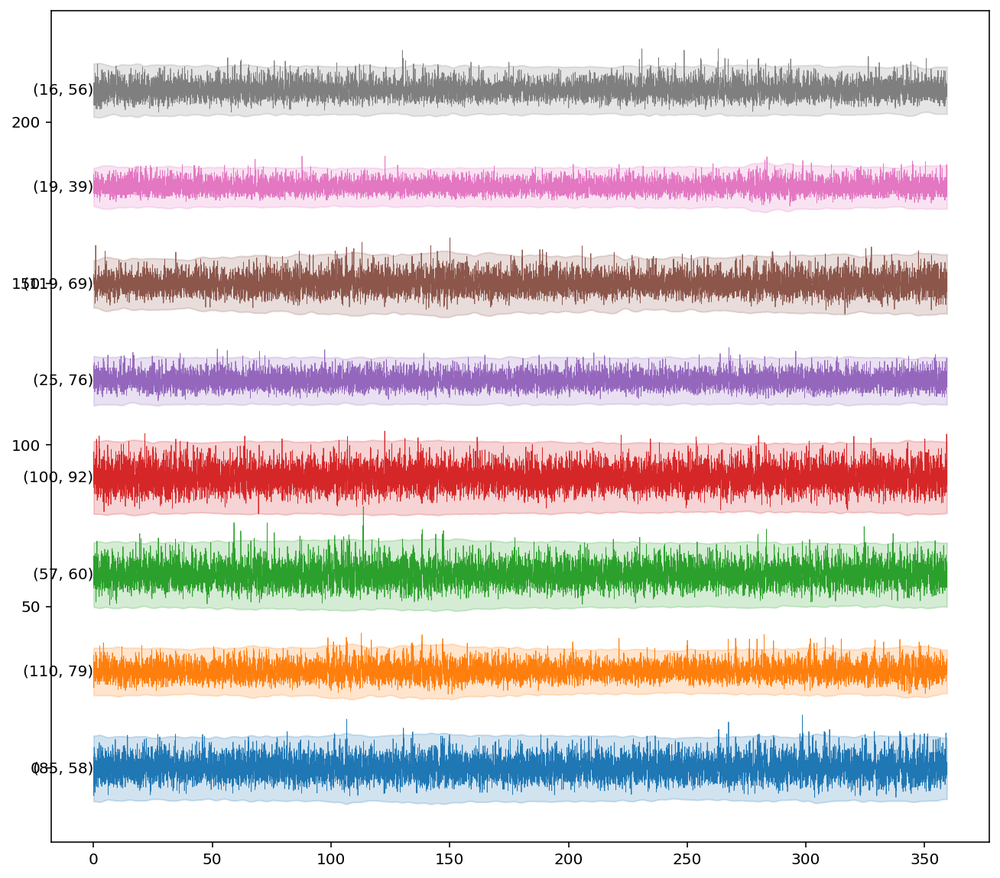

In [190]:
plt.figure(figsize=(11,10))
ia = 0
for i,j in interestingPx:
    x = dMovie[:,i,j]
    xs = m_s[:,i,j]
    xf = m_50[:,i,j]
#     x = m_orig[:,i,j]
    xoff = ia*30-x.mean()
    c = plt.plot(time, x+xoff,lw=.4)[0].get_color()
#     plt.fill_between(time, xf+3*xs+xoff, xf-3*xs+xoff,color=c,alpha = .2)
    plt.fill_between(time, 3*xs+xoff, -3*xs+xoff,color=c,alpha = .2)
#     xf = lowPass(x,wIron,wIron,10,2)
#     plt.plot(time, xf+xoff+10,lw=.8,c=c)
#     plt.plot(time, runningStd(xf,3*wIron)+xoff+10,lw=.8,c=c)
    plt.text(0,xoff,(i,j),ha="right",va="center")
    ia+=1
    if ia>10:
        break

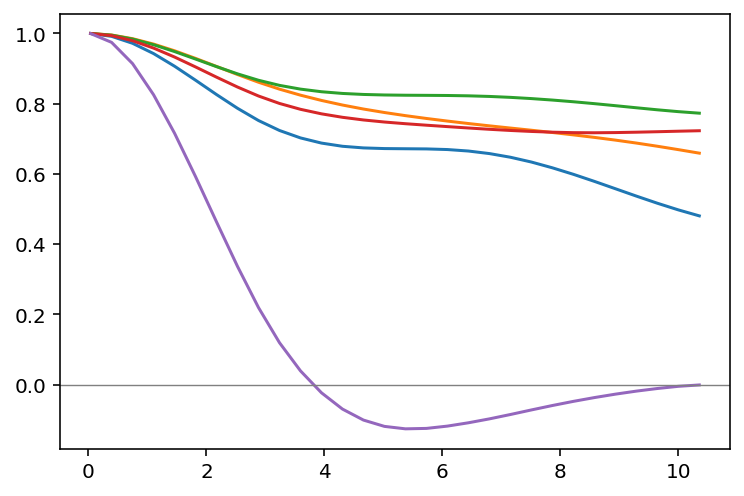

In [192]:
tr = np.arange(1,300,10)
for i,j in interestingPx[:5]:
    x = m_50[:,i,j]
    y = autocorr(x,tr)
    plt.plot(tr/m_orig.fr,y)
plt.axhline(0,color="grey",lw=.7)

## Closeup on a region of the image

In [2027]:
interestingPx = np.array([
    [58,83],
    [58,84],
    [58,85],
    [58,86],
    [58,87],
    [57,87],
    [56,83],
    [59,84],
    [59,85],
    [59,86],])

In [2031]:
imin,jmin = interestingPx.min(0)-2
imax,jmax = interestingPx.max(0)+2

In [2048]:
%matplotlib notebook

<IPython.core.display.Javascript object>


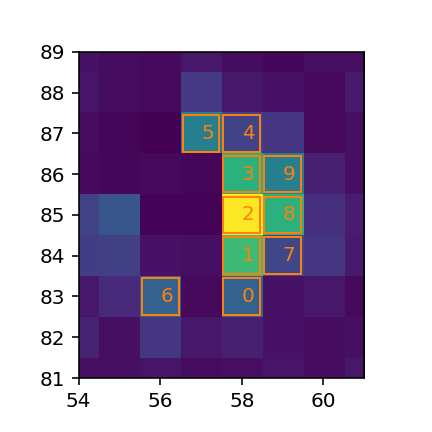

<IPython.core.display.Javascript object>


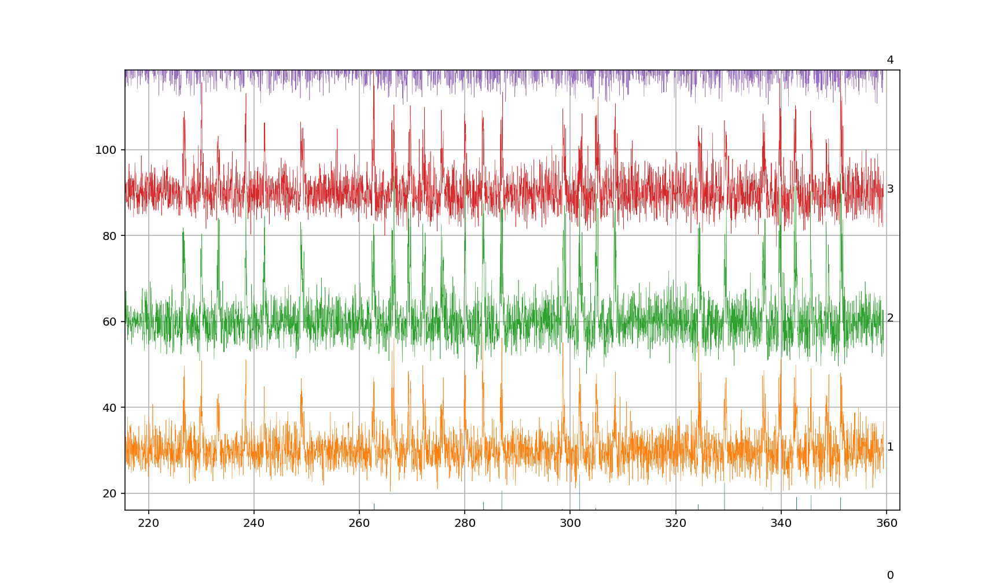

In [2050]:
plt.figure(figsize=(3,3))
ax = plt.subplot(111)
ax.imshow(tmp.T)
plt.xlim(imin,imax)
plt.ylim(jmin,jmax)
addRoisToImage(interestingPx,1,ax=ax)

pxTraces = getRoiProfiles(interestingPx,1,image_=dMovie)
plt.figure(figsize=(12,7))
for i in pxTraces:
    yoff = 30*i
    plt.plot(time,pxTraces[i]+yoff,lw=.3)
    plt.text(time.max(),yoff," %i"%i)
plt.grid()

## separate into events

In [347]:
subSlice = (slice(60,100),slice(45,85))

In [349]:
%matplotlib inline

64

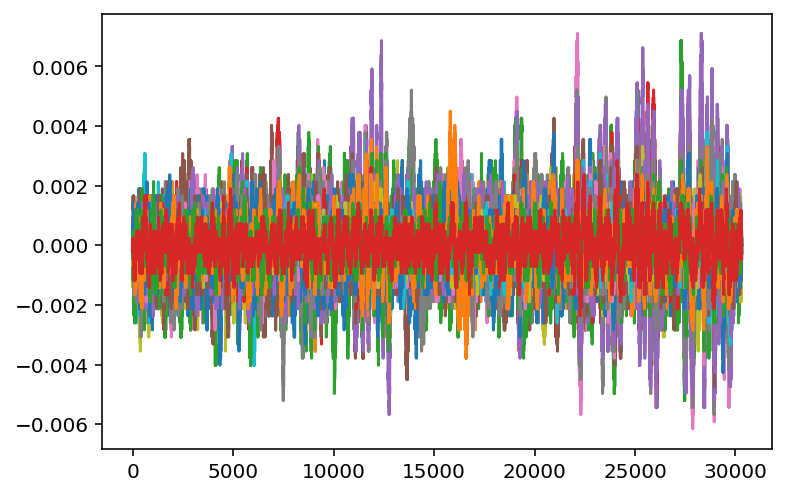

In [351]:
tmp = m_50[(slice(None),)+subSlice].resize(1/5,1/5,1).reshape((len(time),-1))
len(plt.plot(np.diff(tmp[:],axis=0)))

In [357]:
fullSlice = (slice(None),)+subSlice
rest = 1./2
mShow = []
for m in [
    m_orig[fullSlice],
    np.log(1+m_50[fullSlice]),
    dMovie[fullSlice],
    zMovie[fullSlice],
]:
    m = m.copy().resize(1,1,rest)
    m = np.clip(m,np.percentile(m,.1),np.percentile(m,99.5))
    m = m-m.min()
    m = m/m.max()
    mShow += [m,m[:,:1]*0]
    
mShow = concatenate(mShow,axis=1)

In [359]:
mShow.shape

(15152, 164, 40)

In [361]:
mShow[-3000:].play(fr=500,magnification = 4,do_loop=True)

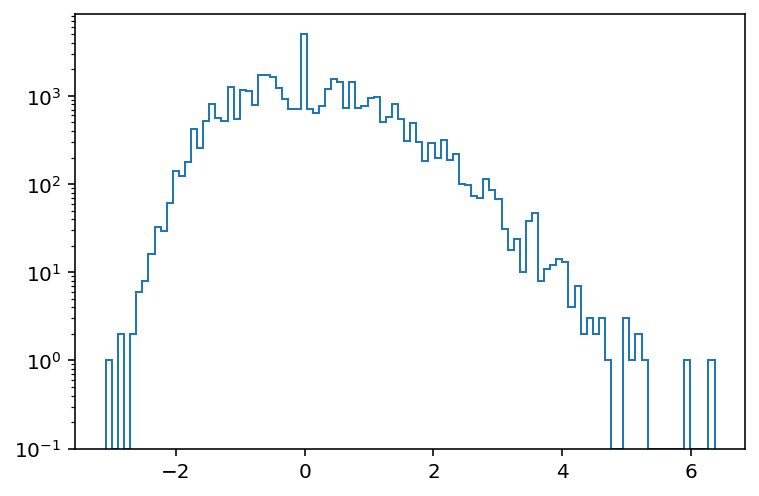

In [222]:
plt.hist(zMovie[fullSlice][::100].flatten(),100,histtype="step",log=True);

In [364]:
fullSlice = (slice(None),)+subSlice
rest = 1./2
mRGB = []
for m in [
#     m_orig[fullSlice],
    np.log(1+m_50[fullSlice]),
    dMovie[fullSlice],
    zMovie[fullSlice],
]:
    m = m.copy().resize(1,1,rest)
    m = np.clip(m,np.percentile(m,.1),np.percentile(m,99.5))
    m = m-m.min()
    m = m/m.max()
    mRGB += [m.reshape(m.shape+(1,))]

In [367]:
concatenate(mRGB,axis=-1)[-3000:].play(fr=500,magnification = 4,do_loop=True)

In [ ]:
# plt.subplots(1,3,figsize)
# for m in [
#     np.log(1+m_50[fullSlice]).mean(0),
#     np.percentile(dMovie[fullSlice],99,axis=0),
#     (zMovie[fullSlice]>2.5).mean(0),
# ]:

In [386]:
fullSlice = (slice(None),)+subSlice
imgRGB = []
for m in [
    np.log(1+m_50[fullSlice]).mean(0),
    np.percentile(dMovie[fullSlice],99,axis=0),
    (zMovie[fullSlice]>2.5).mean(0),
]:
    m = np.clip(m,np.percentile(m,.1),np.percentile(m,99.5))
    m = m-m.min()
    m = m/m.max()
    imgRGB += [m]

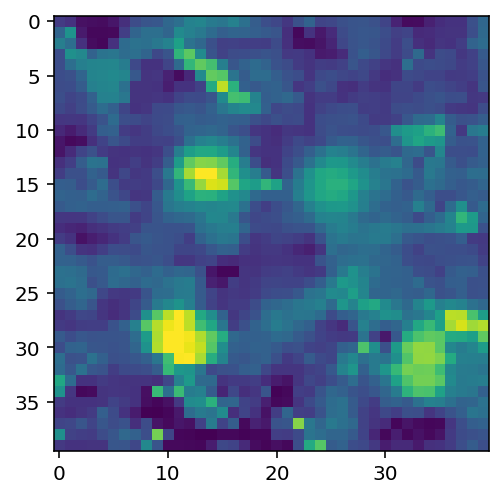

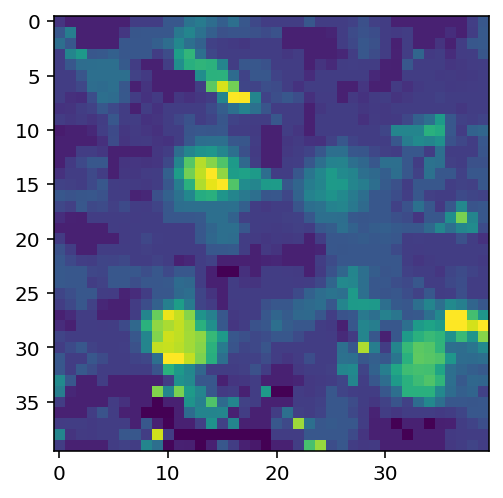

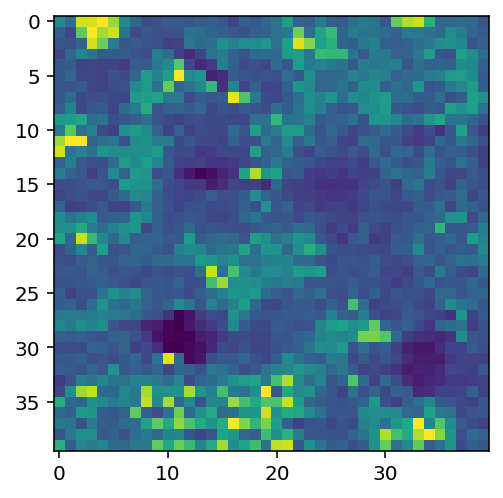

In [387]:
for m in imgRGB:
    plt.imshow(m)
    plt.show()

AttributeError: 'PolyCollection' object has no property 'cntmin'

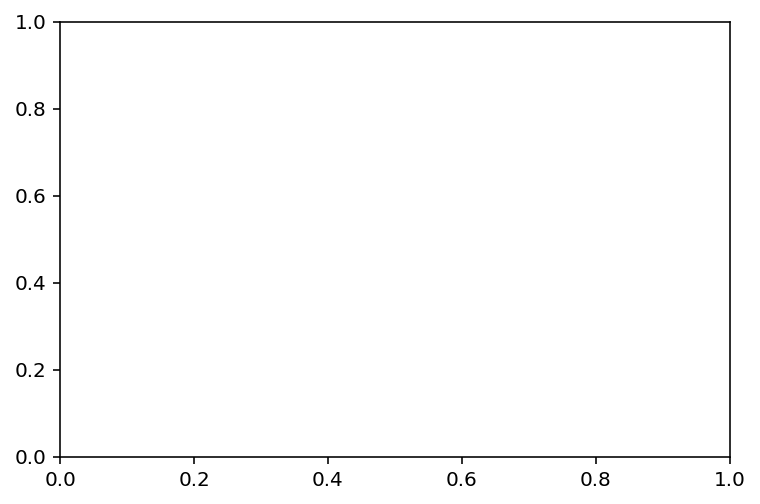

In [397]:
imgRGBhexbin(imgRGB[1].flatten(), imgRGB[2].flatten(),cntmin=1,bin="log")

In [382]:
imgRGB = np.transpose(imgRGB)

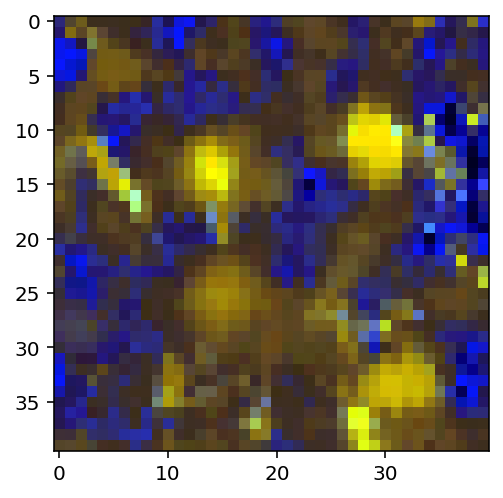

In [383]:
plt.imshow(imgRGB)

### Multimap try

In [188]:
def processChunk(Mth_):
    events_ = getEvents(Mth_,distMatrix)
    return [getEventIndices(ev,dims) for ev in events_]

In [272]:
t0s = [i*20 for i in range(20)]

In [275]:
mths = [zMovie[t0:t0+25]>3 for t0 in t0s]

In [276]:
from general_functions import multi_map

In [305]:
evRes = multi_map(processChunk,mths[:1],processes=2)

KeyboardInterrupt: 

In [285]:
RescEvr =[]
for evr,t0 in zip(evRes,t0s):
    for coords in evr:
        coords[:,0] = t0 + coords[:,0]
        RescEvr += [coords]

In [300]:
# evRes[0][-10:]

In [301]:
# evRes[1][:10]

In [ ]:
RescEvr

In [289]:
evSizes = list(map(len,RescEvr))

In [290]:
counter = Counter(evSizes)

In [294]:
counter = OrderedDict([(k,counter[k]) for k in sorted(counter.keys())])

In [295]:
counter

OrderedDict([(1, 5491), (2, 454), (3, 53), (4, 5), (5, 2), (6, 1)])

In [ ]:
plt.bar(counter.keys(),counter,vars)

In [ ]:
mths = [   for t0 in ]

### base

In [389]:
constrainIdx = (slice(None),slice(70,90),slice(55,75))

In [390]:
subZmovie = zMovie[constrainIdx]
subDmovie = dMovie[constrainIdx]
Mth = zMovie[constrainIdx]>2.5

In [391]:
# Mth.astype("float").play()

In [392]:
dims = Mth.shape[1:]

In [393]:
distMatrix = createNNDistanceMatrix(dims)

In [394]:
events = getEvents(Mth,distMatrix)
events = sorted(events, key=lambda xi: -len(xi))
evSizes = np.array(list(map(len, events)))

In [395]:
rndMth = dst.bernoulli.rvs(Mth.mean(),size=Mth.size).astype(bool).reshape(Mth.shape)
rndEvents = getEvents(rndMth,distMatrix)
rndEvSizes = np.array(list(map(len, rndEvents)))

In [284]:
%matplotlib inline

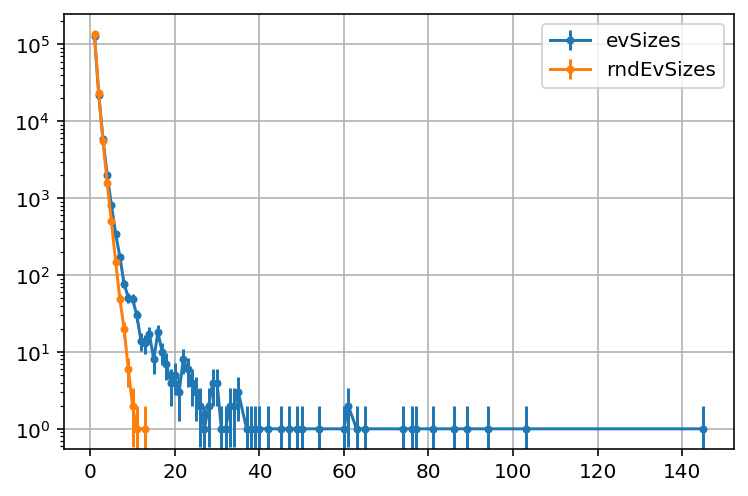

In [396]:
for szt in ["evSizes","rndEvSizes"]:
    sz = eval(szt)
    cnt = Counter(sz)
    # plt.step(sorted(evSizes), 1+np.arange(len(evSizes)))
    x,y = np.array(list(cnt.keys())),np.array(list(cnt.values()))
    jj = np.argsort(x)
    y = y[jj]
    x = x[jj]
#     plt.bar(x,y,label=szt)
    plt.errorbar(x,y,y**.5,ls="-",label=szt,marker=".")
plt.yscale("log")
plt.legend()
plt.grid()
# plt.twinx()
# plt.plot("evSizes",rndEvSizes)

In [301]:
def getEventIndices(event,spaceDims, offset=np.zeros(3)):
    """in shape: t,i,j"""
    nc = np.prod(spaceDims)
    offset = np.array(offset)
    coords = np.array([(coord//nc,(coord%nc)//spaceDims[1],(coord%nc)%spaceDims[1]) for coord in event])
    for i in range(3):
        coords[:,i] = coords[:,i] + offset[i]
    return coords

In [306]:
eventSizeThreshold = 5
denoisedMth = np.zeros_like(Mth)

In [310]:
for event in events:
    if len(event)<eventSizeThreshold: continue
    evInd = getEventIndices(event,dims)
    for t,x,y in evInd:
        denoisedMth[t,x,y] = 1

In [311]:
denoisedMth.sum()

movie(1433)

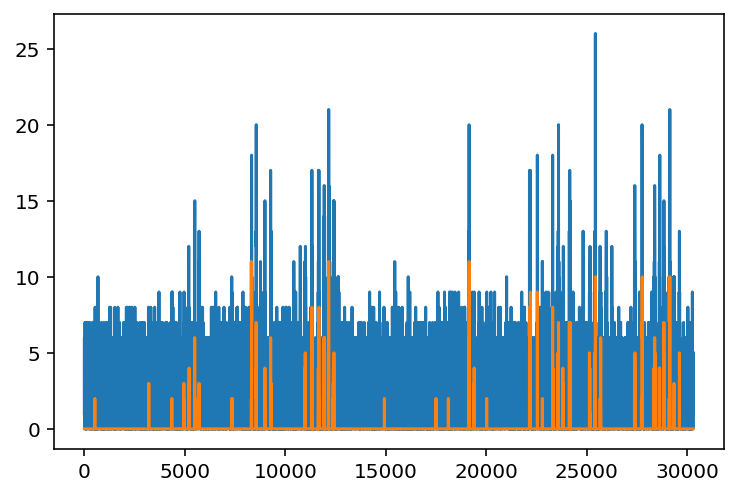

In [317]:
plt.plot(Mth.sum(axis=(1,2)))
plt.plot(denoisedMth.sum(axis=(1,2)))

In [315]:
denoisedMth.astype(float).play()

In [318]:
jEvent = 0
evInd = getEventIndices(events[jEvent],dims)

In [319]:
# getEventIndices(events[jEvent],dims,offset=(10,0,0))
evBoundaries = np.array([evInd.min(0), evInd.max(0)]).T

In [320]:
evBoundaries

array([[23311, 23319],
       [   11,    17],
       [    6,    12]])

In [325]:
from caiman import concatenate

In [329]:
m = concatenate([
m[tuple([slice(max(a-10,0),min(b+10,m.shape[j])) for j,(a,b) in enumerate(evBoundaries)])] for m in [Mth.astype(float), denoisedMth.astype(float)]    
], axis=1)

In [337]:
# m = denoisedMth.astype(float)
m = subZmovie
m = m[tuple([slice(max(a-10,0),min(b+10,m.shape[j])) for j,(a,b) in enumerate(evBoundaries)])]
m.gaussian_blur_2D(5,5,.5,.5)
m.play(do_loop=True, magnification = 5,fr=30)
# subDmovie[tuple([slice(a-10,b+10) for a,b in evBoundaries])].play(do_loop=True, magnification = 5)

# Try to get the shapes out

In [ ]:
for 

In [1913]:
tmp.sum()

movie(13847)

In [1737]:
# (zMovie>10).sum()

In [1857]:
i,j = np.squeeze(np.where(tmp == tmp.max()))

In [1739]:
%matplotlib notebook

In [1819]:
%matplotlib inline

In [1858]:
plt.plot(x,lw=.5)

<IPython.core.display.Javascript object>


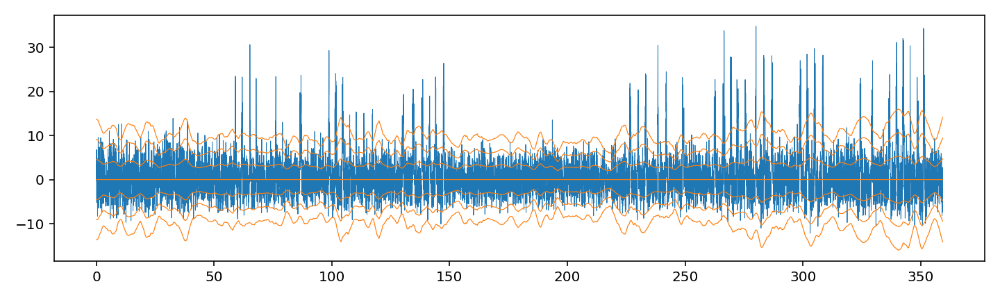

In [1859]:
fig = plt.figure(figsize=(10,3))
x = dMovie[:,i:i+1,j:j+1].sum((1,2))
plt.plot(time[ts],x,lw=.5)
s = m_s[:,i,j]
# s = m_50[:,i:i+1,j:j+1].sum((1,2))**.5
for n in range(-3,4):
    plt.plot(time[ts],n*s,"C1-",lw=.6)
# plt.plot(time[ts],m_50[:,i:i+1,j:j+1].sum((1,2)),lw=1)
fig.tight_layout()

In [1768]:
X = np.array([x[tt-20:tt+40] for tt in np.where(np.diff((x>4*s).astype(int)))[0]])

<IPython.core.display.Javascript object>


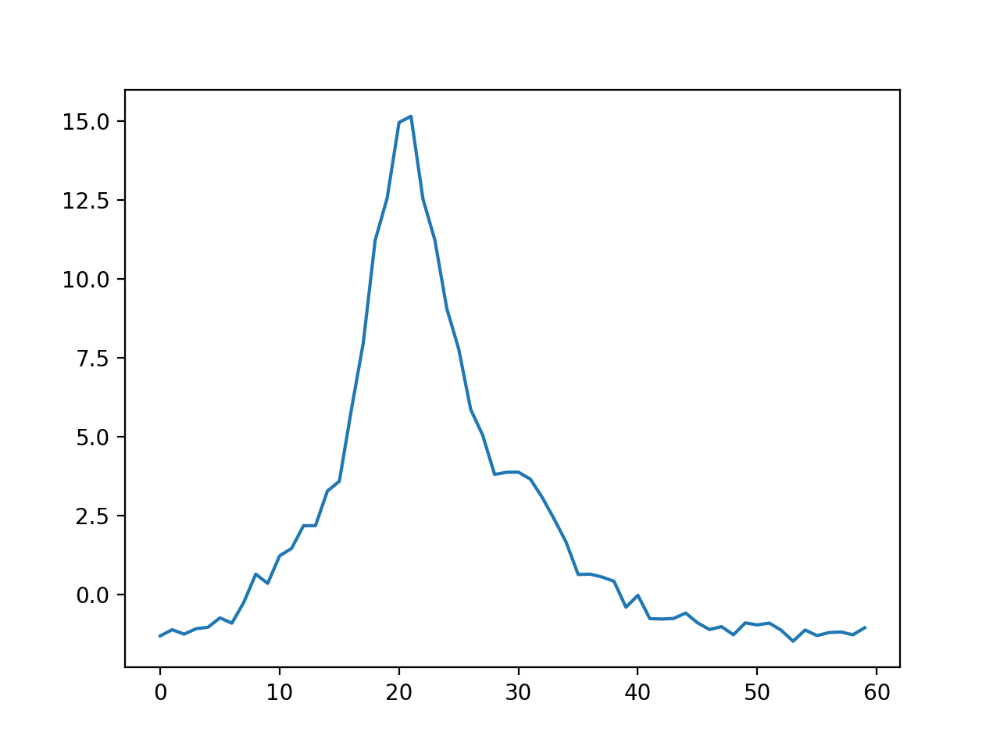

In [1769]:
plt.plot(np.median(X,0))

In [1803]:
vals, vects = myPCA(X)

<BarContainer object of 10 artists>

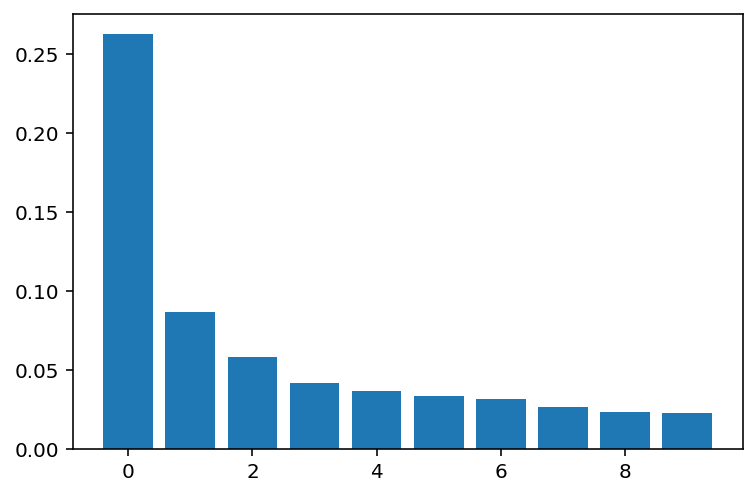

In [1804]:
plt.bar(np.arange(10), vals[:10]/vals.sum())

<IPython.core.display.Javascript object>


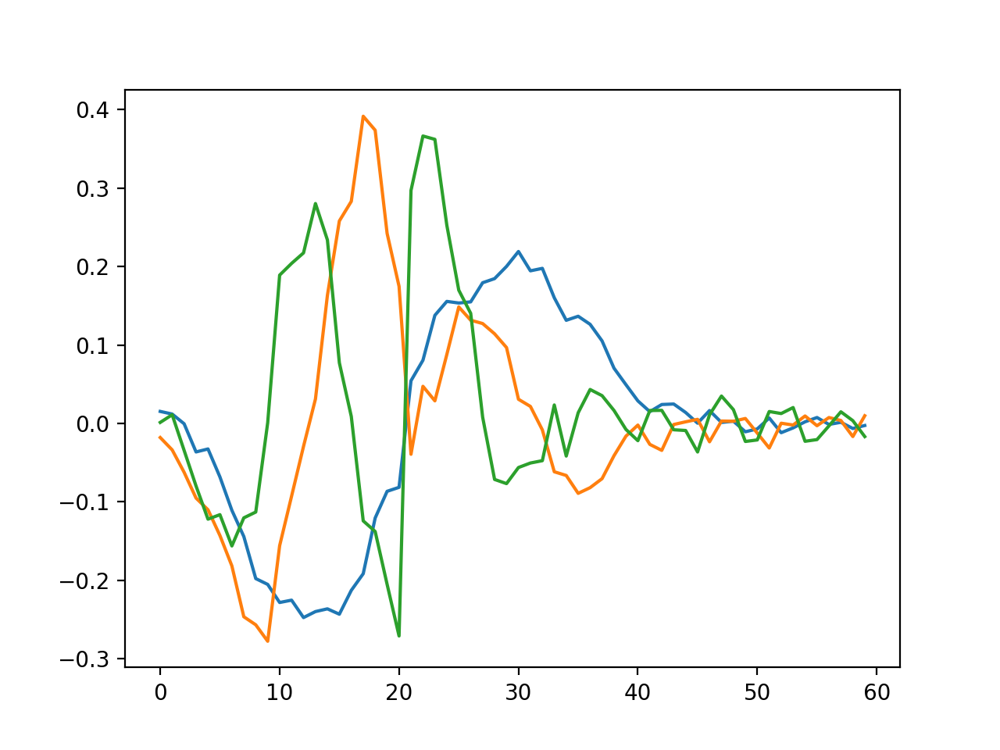

In [1780]:
plt.plot(vects[:3].T)

In [1772]:
vals

array([615.21971084, 203.04389864, 136.59630981,  97.93554251,
        86.27752018,  78.83537489,  73.39794281,  62.30999294,
        54.44960346,  52.26032784,  49.39309891,  46.55498689,
        42.73263534,  38.59804823,  36.25667796,  32.82366275,
        32.36060273,  30.75843353,  28.06040108,  27.14087055,
        25.80245719,  24.06895279,  23.33418931,  22.6438679 ,
        22.04410461,  20.84179982,  20.60900754,  18.58367025,
        18.13087898,  17.64631556,  16.87417332,  16.00337022,
        15.53974029,  15.16546223,  14.67133486,  14.2179416 ,
        14.12746684,  13.23783951,  12.92553552,  12.54210096,
        12.12940598,  11.2744743 ,  11.0568229 ,  10.69196066,
        10.25904303,   9.73842188,   9.31431357,   9.23641396,
         8.56721219,   8.49613403,   7.82839867,   7.41696877,
         6.96030701,   6.65595502,   6.29189803,   5.74316466,
         5.20797707,   5.12200488,   4.7602457 ,   4.42353764])

In [1714]:
m_orig.fr

28.103376774902785

In [992]:
ns,ss = 5,.5
z = np.zeros((5,5))
z[len(z)//2,len(z)//2] = 1
zb  = cv2.GaussianBlur(z,ksize=(ns,ns),sigmaX=ss,sigmaY=ss)
nt,st = 5,.6
zb1 = cv2.GaussianBlur(z,ksize=(nt,1),sigmaX=st,sigmaY=0)
with np.printoptions(precision=3, suppress=True):
    print (zb)
    print (zb1)

[[0.    0.    0.    0.    0.   ]
 [0.    0.011 0.084 0.011 0.   ]
 [0.    0.084 0.619 0.084 0.   ]
 [0.    0.011 0.084 0.011 0.   ]
 [0.    0.    0.    0.    0.   ]]
[[0.    0.    0.    0.    0.   ]
 [0.    0.    0.    0.    0.   ]
 [0.005 0.166 0.664 0.166 0.005]
 [0.    0.    0.    0.    0.   ]
 [0.    0.    0.    0.    0.   ]]


In [968]:
# zMovie.max()

In [993]:
zMovieBlurred = zMovie.copy()
zMovieBlurred.gaussian_blur_2D(ns,ns,ss,ss);
zMovieBlurred = blurInTime(zMovieBlurred,nt,st)
# zMovie[zMovie<0] = 0
# zMovie[zMovie>5] = 5


In [994]:
zMovieBlurred.max(), zMovieBlurred.min()

(movie(6.44136453), movie(-2.52380585))

In [1565]:
movie(np.concatenate([
    np.clip(zMovie,zMovieBlurred.min(),zMovieBlurred.max()),
    np.ones_like(zMovie[:,:2,:])*zMovieBlurred.max(),
    zMovieBlurred,
],axis=1)).play(magnification=4, fr=100,do_loop=True)

In [1638]:
tmax,imax,jmax = np.squeeze(np.where(zMovieBlurred==zMovieBlurred.max()))

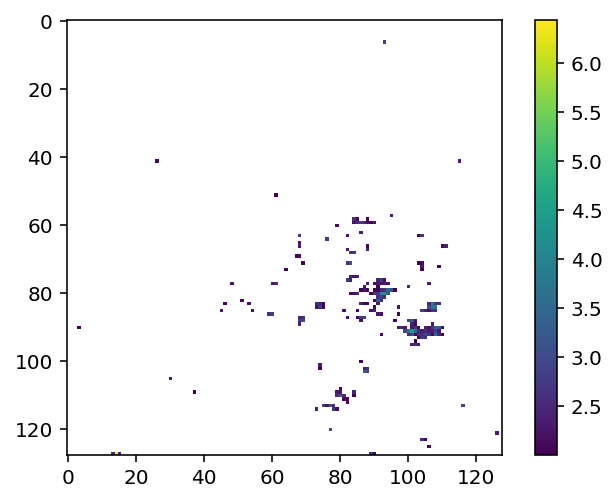

In [1639]:
tmp = zMovieBlurred[tmax].copy()
tmp[tmp<2] = np.nan
plt.imshow(tmp)
plt.colorbar()

In [1677]:
def createNNDistanceMatrix(dims):
    from scipy.sparse import dok_matrix
    DistMatrix = dok_matrix((np.prod(dims),np.prod(dims)), dtype=np.int0)

    for i,j in product(range(dims[0]),range(dims[1])):
        for di,dj in product([-1,0,1],[-1,0,1]):
            i1 = i+di
            j1 = j+dj
            if i1<0 or j1<0 or i1>=dims[0] or j1>=dims[1]: continue
    #         d = ((np.array(p0)-np.array(p1))**2).sum()**.5
    #         if d<2:
            DistMatrix[i*dims[0]+j,i1*dims[0]+j1] = 1
    return DistMatrix#.tocsr()

In [1678]:
distMatrix = createNNDistanceMatrix(dims)

In [1529]:
# plt.imshow(DistMatrix.todense())

In [1640]:
tmax

773

In [1641]:
dims= np.array(m_orig.shape[1:])

In [1649]:
(zMovie[::10]<-2.53).mean(), (zMovie[::10]>2.53).mean()

(movie(0.00138102), movie(0.01942383))

In [1655]:
partTs = slice(tmax,tmax+10)
zMovie[partTs].min(), zMovie[partTs].max()

(movie(-3.53187956), movie(12.83431934))

In [1656]:
# movPart = zMovieBlurred[partTs]#.play()
# movPart = zMovie[partTs]#.play()
# (movPart>1.7).astype(int).play()
# dst.norm.cdf(-3)
# (zMovie<-1.7).mean(), (zMovie<-2.53).mean()
tfmatrix = zMovie[partTs]>2.53
# tfMatrix = tfMatrix[:,:,:]

In [1657]:
tfmatrix.shape, tfmatrix.sum()

((10, 128, 128), movie(5899))

In [1679]:
events = getEvents(tfmatrix,distMatrix)

In [1680]:
eventSizes = np.array(list(map(len,events)))

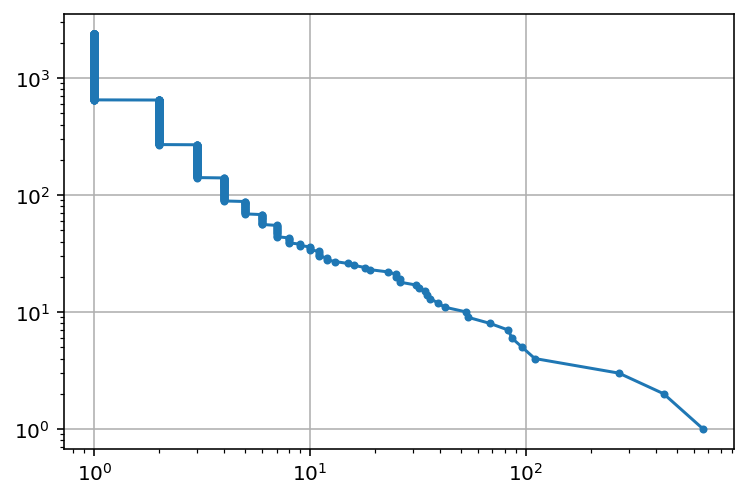

In [1685]:
plt.plot(sorted(eventSizes), 1+np.arange(len(eventSizes))[::-1],".-")
plt.xscale("log")
plt.yscale("log")
plt.grid()

In [1688]:
event = events[np.argmax(eventSizes)]

In [1694]:
getEventBoundaries(events[1005], dims)

array([[ 4,  5],
       [26, 27],
       [21, 22]])

In [ ]:
event = 

In [1689]:
getEventBoundaries(event, dims)

array([[  0,  10],
       [ 75,  97],
       [ 64, 114]])

In [1530]:
# # EventIDTensor = -np.ones_like(tfMatrix,dtype=int)
# EventIDTensor = dok_matrix((len(tfMatrix),DistMatrix.shape[0]), dtype=np.int64)
# iframe = 0

# eventIDs = [np.nan]
# eID = len(eventIDs)
# for i in np.where(tfMatrix[iframe].flatten())[0]:
#     EventIDTensor[iframe,i] = eID
#     eID += 1

# for i in np.where(tfMatrix[iframe].flatten())[0]:
#     js = np.where(DistMatrix[i].todense())[1]
#     surroundingIDs = EventIDTensor[iframe,js].toarray()[0]
#     js = js[surroundingIDs>0]
#     surroundingIDs = surroundingIDs[surroundingIDs>0]
#     newID = surroundingIDs.min()
#     for j in js:
#         EventIDTensor[iframe,j] = newID

# EventIDTensor[iframe] = renumerize(EventIDTensor[iframe])

# plt.imshow(EventIDTensor[iframe].todense().reshape(dims))

# def renumerize(Frame):
#     ks = Frame.keys()#np.array([el[1] for el in ])
#     oldValues = np.unique(list(Frame.values()))
#     newValues = np.arange(len(oldValues))+oldValues.min()
#     old2new = OrderedDict(zip(oldValues,newValues))
#     for k in ks:
#         Frame[k] = old2new[Frame[k]]
#     return Frame

# iframe=1

# for i in np.where(tfMatrix[iframe].flatten())[0]:
#     js = np.where(DistMatrix[i].todense())[1]
    
#     if EventIDTensor[iframe-1,i]
#     EventIDTensor[iframe,i] = eID
#     eID += 1

# tfMatrix.astype(int).play()

In [1663]:
def getEvents(tfMatrix_,DistMatrix_):
    import networkx as nx
    allGraph = dok_matrix((tfMatrix_.size,tfMatrix_.size),dtype=np.int0)
    nc = DistMatrix_.shape[0]

    for iframe in range(len(tfMatrix_)):
        hereActiveCells = np.where(tfMatrix_[iframe].flatten())[0]
        for ic in hereActiveCells:
            nodeID = iframe*nc+ic
            for diframe in [0,1]:
                iframe1 = iframe+diframe
                if iframe1<0: continue
                if iframe1>=len(tfMatrix_): continue
                for el in DistMatrix_[ic].keys():
                    jc = el[1]
                    if tfMatrix_[iframe1].flatten()[jc]:
                        allGraph[iframe1*nc+jc, nodeID] = 1
                        allGraph[nodeID, iframe1*nc+jc] = 1
    #         break
    #     break

    G = nx.from_scipy_sparse_matrix(allGraph)

    events = [cmp for cmp in nx.connected_components(G) 
              if len(cmp)>1 or allGraph[tuple(cmp)*2]]
    return events

In [1624]:
events = sorted(events, key=lambda xi: -len(xi))

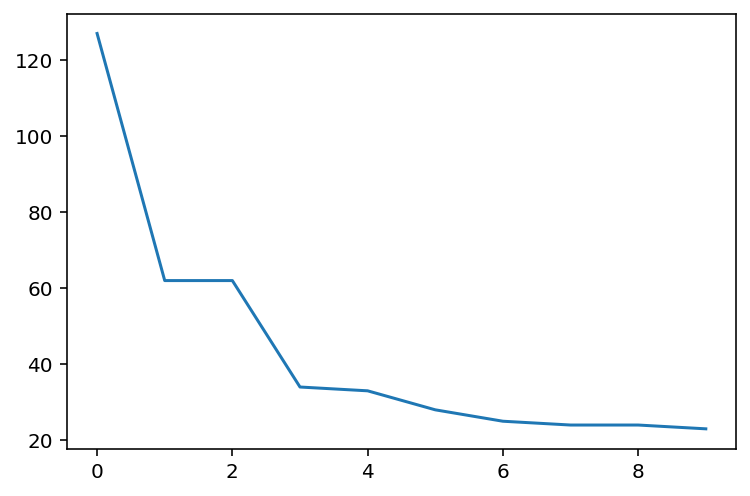

In [1625]:
plt.plot(list(map(len,events[:10])))

In [1626]:
event = events[0]

In [1629]:
eventSlice = tuple(slice(*el) for el in getEventBoundaries(event,dims))

In [1630]:
eventSlice

(slice(0, 6, None), slice(76, 86, None), slice(86, 97, None))

In [1634]:
movPart[eventSlice].play(magnification=4,fr=5)

In [ ]:
tmp = []
for event in events:
    (tmin,tmax),(imin,imax),(jmin,jmax) = getEventBoundaries(event,dims)
    for bound

In [1580]:
event = events[3]

In [1581]:
# coords = np.array([(coord//nc,(coord%nc)//dims[1],(coord%nc)%dims[1]) for coord in event])

In [1582]:
(tmin,tmax),(imin,imax),(jmin,jmax) = getEventBoundaries(event,dims)#np.array([coords.min(0), coords.max(0)+1]).T

In [1583]:
(tmin,tmax),(imin,imax),(jmin,jmax)

((0, 6), (83, 86), (104, 112))

In [1584]:
tfMatrix[tmin:tmax,imin:imax,jmin:jmax].astype(float).play(fr=1, magnification = 10)

In [1606]:
diffMovie[partTs][tmin:tmax,imin:imax,jmin:jmax].astype(float).play(fr=5, magnification = 10,do_loop=True)

ValueError: zero-size array to reduction operation maximum which has no identity

In [1586]:
onlyEvent = np.zeros_like(tfMatrix[tmin:tmax,imin:imax,jmin:jmax].astype(float))

In [1587]:
for coord in coords:
    t,i,j = coord
    t -= tmin
    i -= imin
    j -= jmin
    onlyEvent[t,i,j] = 1

IndexError: index -25 is out of bounds for axis 1 with size 3

In [1564]:
onlyEvent.play(fr=3,magnification = 10)

In [1561]:
zMovie[tmin:tmax,imin:imax,jmin:jmax].astype(float).play(fr=1, magnification = 10)

In [1566]:
def getEventBoundaries(event,spaceDims):
    """in shape: (tmin,tmax),(imin,imax),(jmin,jmax)"""
    nc = np.prod(spaceDims)
    coords = np.array([(coord//nc,(coord%nc)//spaceDims[1],(coord%nc)%spaceDims[1]) for coord in event])
    return np.array([coords.min(0), coords.max(0)+1]).T

In [1241]:
iframe = 1

In [ ]:
EventIDTensor[iframe,js]

In [1067]:
    js = np.where(DistMatrix[i].todense())[1]
    EventIDTensor[iframe,js]
    minimalID
        new = min(EventIDTensor[iframe,i])
    for di,dj in product(range(-1,2),range(-1,2)):
        if dj==di==0: continue
        i1 = i+di
        j1 = j+dj
        if i1<0 or j1<0 or i1>=dims[0] or j1>=dims[1]: continue
        a = tfMatrix[iframe, i , j ]
        b = tfMatrix[iframe, i1, j1]
        if b:
            new = min(a,b)
            EventIDTensor[iframe,i,j]   = new
            EventIDTensor[iframe,i1,j1] = new
            

In [1070]:
np.any(EventIDTensor[0]>=0)

movie(False)

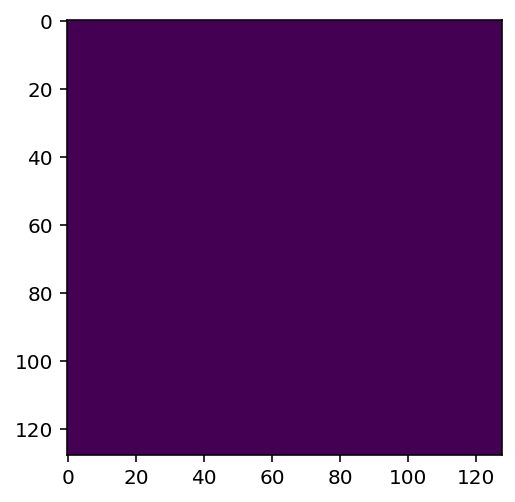

In [1068]:
plt.imshow(EventIDTensor[0])

In [ ]:
# tmp = zMovieBlurred[t].copy()
# tmp[tmp<2] = np.nan
# plt.imshow(tmp)
# plt.colorbar()

In [ ]:
smallChunk = zM

In [966]:
zMovie[10:60].play(magnification=1,do_loop=True, plot_text=True,fr=10)

In [837]:
dMovie.play()

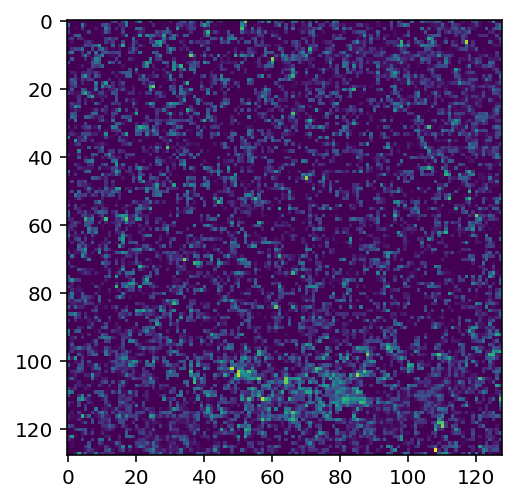

In [897]:
thMovie = zMovie[20:30,100:,40:100]>1

In [898]:
thMovie.astype(float).play(fr=3)

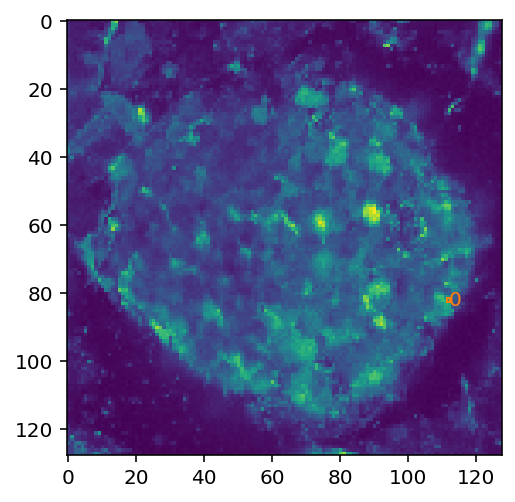

In [902]:
plt.imshow(dMovie.std(0).T)
addRoisToImage([(112,82)],1,ax=plt.gca())

In [927]:
np.diff(m_50, axis=0).play()

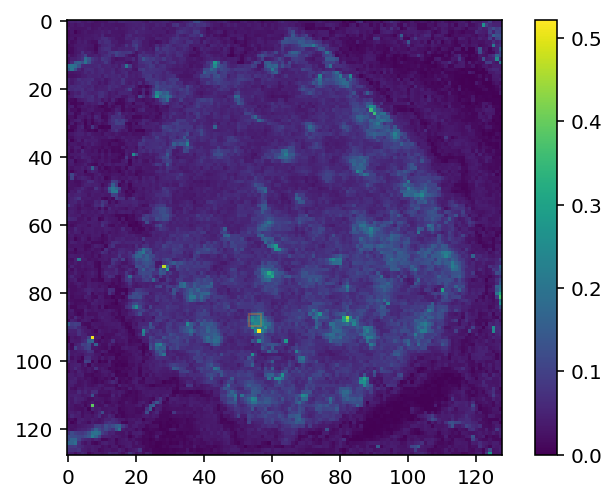

In [953]:
plt.imshow(np.abs(np.diff(m_50[::10], axis=0)).mean(0))
plt.colorbar()
# i,j = 106,87
i,j = 88,55
plt.plot(j,i,"C1s",mfc="none",alpha = .3)

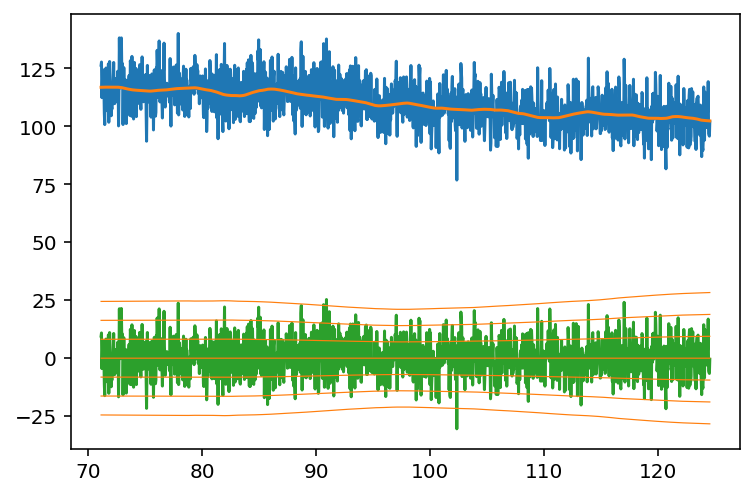

In [956]:
# i,j = 112,82
# plt.plot(time[ts],dMovie[:,i,j])
plt.plot(time[ts],m_orig[ts,i,j])
plt.plot(time[ts],m_50[:,i,j])
plt.plot(time[ts],dMovie[:,i,j])
for n in range(-3,4):
    plt.plot(time[ts],n*m_s[:,i,j],"C1",lw=.6)
#     plt.plot(time[ts],n*m_50[:,i,j]**.5,"C3",lw=.6)
# # plt.plot(time[ts],m_s[:,i,j])

In [ ]:
data = []
for t,i,j in list(np.random.randint((len(m_s),)+stdImg.shape, size = (10000,3)))+[np.array(np.where(filteredMovie==maxf)).T[0]]:
    t = np.maximum(t,dt//2)
    dx = diffMovie    [t-dt//2:t+dt//2,i,j]
    if dx.mean()==0: continue
#     data += [(filteredMovie[t,i,j],dx.std())]
    data += [(filteredMovie[t,i,j],dx.std(),filteredMovie[t,i,j]+dx.mean())]

In [807]:
for i,j in product(range(metadata.X),range(metadata.Y)):
# for i,j in zip(*np.where(stdImg>0)):
    if np.isfinite(m_50[:,i,j]).any(): continue
    m_50[:,i,j] = lowPass(m_orig[ts,i,j],*filterPars)

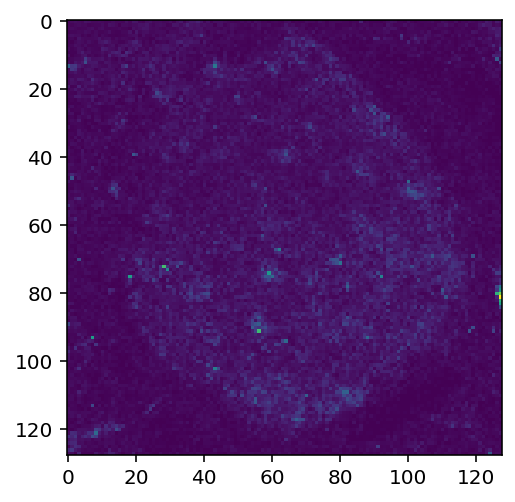

In [810]:
plt.imshow(m_50.std(0))

In [811]:
m_50.play()

In [76]:
assert filteredMovie.min()>-1

In [77]:
filteredMovie.min()

movie(0., dtype=float32)

In [216]:
diffMovie = m_orig-filteredMovie

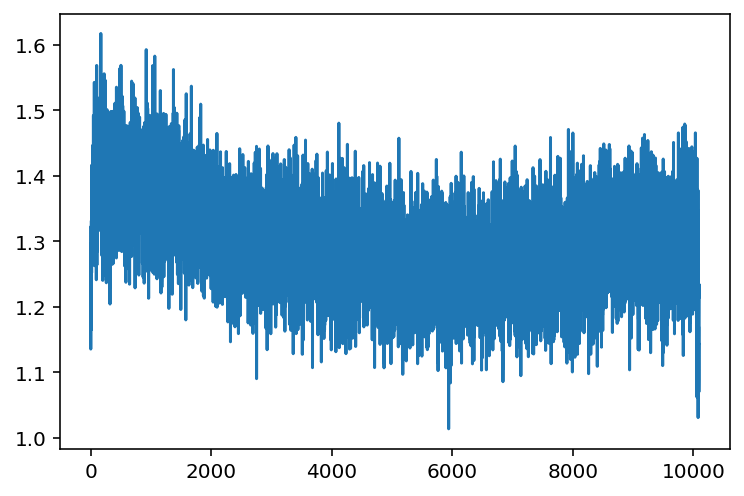

In [230]:
plt.plot(diffMovie[:,-30:,:30].mean((1,2)))

In [232]:
diffMovie[:,-30:,:30].resize(1,1,1/20).play(fr=100,magnification = 3)

# analyse fast (for a patch)

### analyse fast (for all?)

In [1218]:
filteredMovie.shape

(2878, 128, 128)

In [1219]:
# choose subset of frames within which the background is assumed not to change
del ts

In [1220]:
del meanImg,stdImg

In [1221]:
expSDall = filteredMovie**.5/tWin

In [1227]:
n,s = 3,.45

z = np.zeros((7,7))
z[len(z)//2,len(z)//2] = 1
zb = cv2.GaussianBlur(z,ksize=(n,n),sigmaX=s,sigmaY=s)

with np.printoptions(precision=3, suppress=True):
    print (zb)


[[0.    0.    0.    0.    0.    0.    0.   ]
 [0.    0.    0.    0.    0.    0.    0.   ]
 [0.    0.    0.005 0.062 0.005 0.    0.   ]
 [0.    0.    0.062 0.731 0.062 0.    0.   ]
 [0.    0.    0.005 0.062 0.005 0.    0.   ]
 [0.    0.    0.    0.    0.    0.    0.   ]
 [0.    0.    0.    0.    0.    0.    0.   ]]


In [1229]:
snrAll = diffMovie.copy()
snrAll.gaussian_blur_2D(n,n,s,s);
snrAll = snrAll/expSDall

In [1259]:
snrAll.min()

movie(-11.95911636)

In [1236]:
plt.grid?

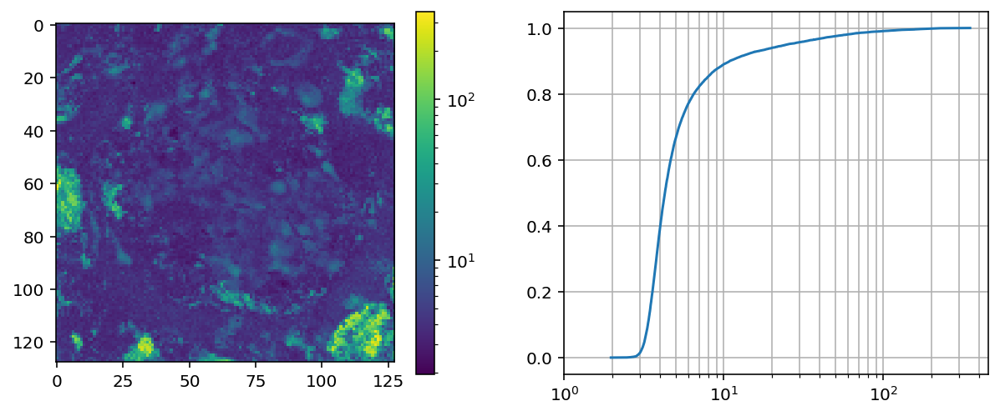

In [1237]:
x = snrAll.max(0) 
plt.figure(figsize=(10,4))
plt.subplot(121)
plt.imshow(x, norm=LogNorm())
plt.colorbar()
plt.subplot(122)
# plt.hist(x.flatten(),1000, log=True);
x = x.flatten()
plt.plot(sorted(x), np.linspace(0,1,len(x)))
plt.xscale("log")
plt.xlim(1)
plt.grid(which="both")

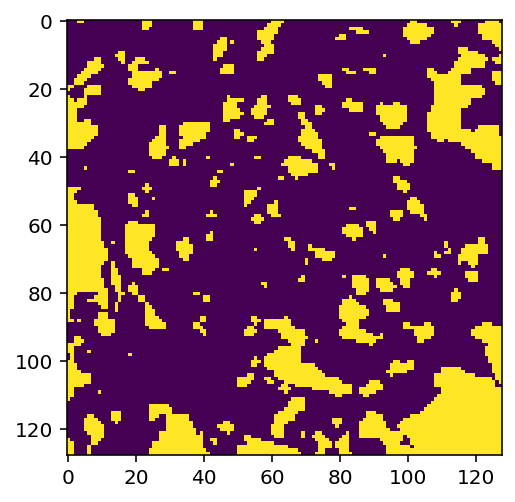

In [1247]:
x = movie(np.array([snrAll.max(0)])).gaussian_blur_2D(3,3,0,0);
plt.imshow(x[0]>6)

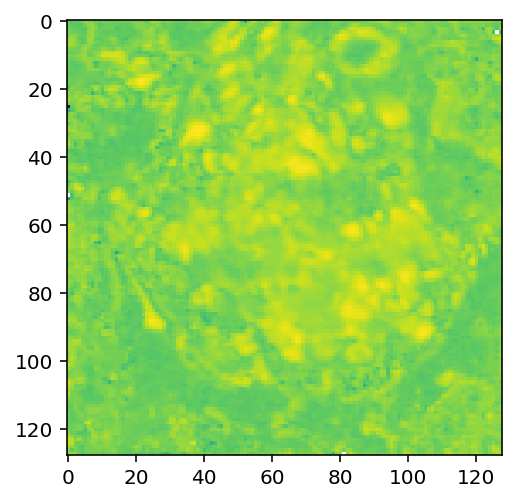

In [1248]:
plt.imshow(snrAll.local_correlations(1,0),norm=LogNorm())

In [1251]:
movie.play?

In [1258]:
tmp = np.clip(snrAll[:],2,8)
tmp = tmp-tmp.min()
tmp = 1-tmp/tmp.max()
tmp.play(fr=100,
         q_max=100,
         q_min=0,
         plot_text=True,
         magnification=3,)

In [1260]:
tmp = diffMovie.copy()

In [1262]:
diffMovie[np.abs(snrAll)<3]=np.nan

In [1264]:
diffMovie.play(fr=100,
         q_max=99.9,
         q_min=0,
         plot_text=True,
         magnification=3,)

In [1253]:
# np.maximum(snrAll[1000:2000],2).play(fr=100,
#                        magnification=3,
#                        q_max=(snr<10).mean()*100,
#                        do_loop=True,
#                        plot_text=True
#                       )

In [1071]:
# plt.plot(meanImg.flatten()**.5,stdImg.flatten(),".",alpha =.4)
# plt.yscale("symlog")

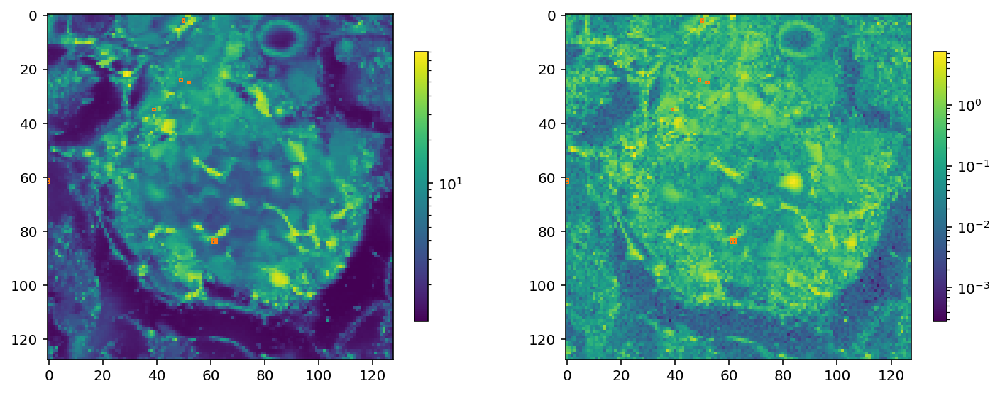

In [996]:
fig, axs = plt.subplots(1,2,figsize=(12,5))
for ax,m in zip(axs,[1+meanImg,stdImg,]):
    im = ax.imshow(m, norm=LogNorm())
    plt.colorbar(im,shrink=.7,ax=ax)
    addRoisToImage(np.array(np.where(stdImg>5)).T,1,ax=ax,label=False)

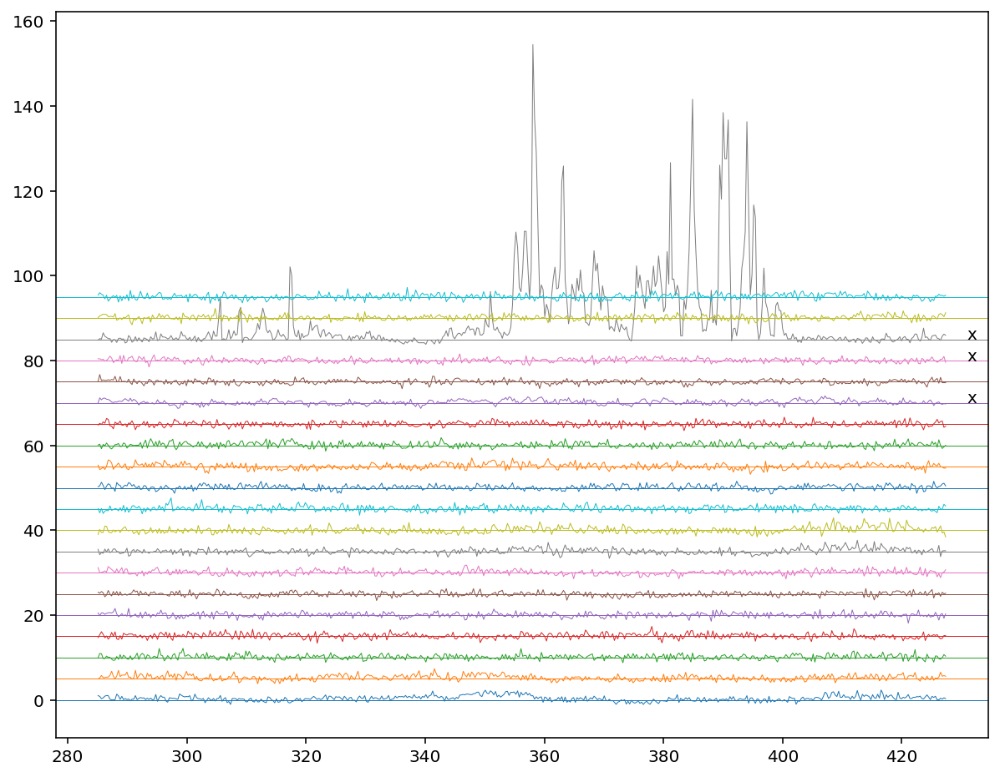

In [1210]:
fig, ax = plt.subplots(1,1,figsize=(10,8), sharex=True)
for roi in range(20):
    yoffset = roi*5
    np.random.seed(roi)
    i,j = np.random.choice(stdImg.shape[0],size=2)
    x = snr[:,i,j]
    c = ax.plot(time[ts],x+yoffset,c="C%i"%roi,lw=.5)[0].get_color()
    ax.axhline(yoffset,color=c,lw=.5)
    
    ## autocorr
    tr = np.arange(1,7)
    y, ye = autocorr(x,tr,5)
    ax.text(plt.xlim()[1],yoffset,"  " if np.sum(np.abs(y/ye)>3) == 0 else "x  ",ha="right")

In [1034]:
# # xr = np.linspace(meanImg.min()**.5,meanImg.max()**.5)
# xr = np.linspace(meanImg.min(),meanImg.max())
# plt.plot(meanImg.flatten(),estSd.flatten()**2,"C3o",mfc="none")
# plt.plot(xr,xr/tWin**2)
# plt.yscale("log")
# plt.xscale("log")

### Try PCA and ICA

In [1781]:
@jit
def propose_filter(current, scale):
    dw = scale*np.random.normal(size=len(current))
    new = current+dw
    new = new/np.sum(new**2)**.5
    return new
@jit
def optF(data, fltr):
    return -np.log(np.cosh(data.dot(fltr))).mean()
@jit
def ICAsearch(XT, optF):
    w = np.random.normal(size=len(XT[0]))
    w = w/np.sum(w**2)**.5
    ws = [w]
    fs = [optF(XT,w)]
    rej = 0
    scale = .01
    while True:
        new  = propose_filter(ws[-1], scale)
        fnew = optF(XT,new)
        if fnew>fs[-1]:
            ws += [ new]
            fs += [fnew]
            rej = 0
        else:
            rej += 1
        if rej>1 and rej%1000==0:
            scale = scale/2
        if rej>10000:
            break
    return ws[-1], fs

In [1770]:
def myPCA(data):
    '''
    Input:  2D numpy array where rows are observations
    Output: a tuple Eigenvalues, Eigenvetors
    '''
    from scipy import linalg as la
    C = np.cov(data, rowvar=False)
    vals, vecs = la.eigh(C)
    vals = vals[::-1]
    vecs = vecs.T[::-1]
    datamean = data.mean(axis=0)
    for i in range(len(vals)):
        if datamean.dot(vecs[i])<0:
            vecs[i] = -vecs[i]
    return vals, vecs

In [1782]:
# ICAX = rebin(filteredMovie.reshape((-1,meanImg.size)),1).T
# ICAX.shape
ICAX = X

In [1794]:
%%time
vals, vects = myPCA(ICAX)

CPU times: user 2.19 ms, sys: 1.35 ms, total: 3.55 ms
Wall time: 2.18 ms


In [1784]:
# ws = vects[0] for c in ICAX

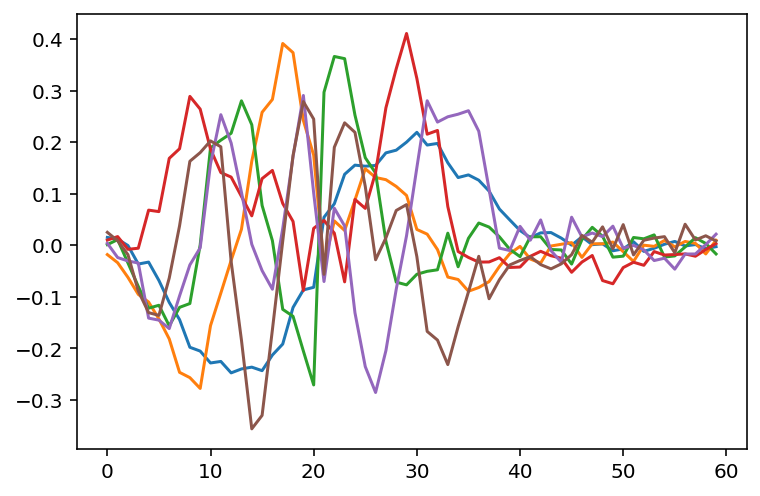

In [1795]:
plt.plot(vects[:6].T)

In [1786]:
%matplotlib inline

In [1796]:
xx = np.array([[x.dot(vects[i]) for x in ICAX] for i in range(1)])

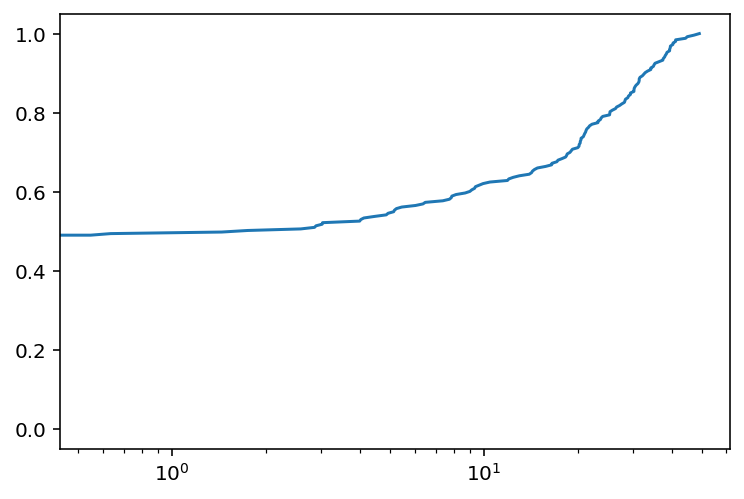

In [1797]:
# plt.hist(xx,100)
for x in xx:
    xxx = x[::1]
    plt.plot(sorted(xxx), np.linspace(0,1,len(xxx)))
plt.xscale("log")

In [1789]:
ws = xx[0]

In [749]:
bleachingMovie = np.array([w*vects[0][:] for w in ws]).T
bleachingMovie = bleachingMovie.reshape((-1,)+meanImg.shape)
bleachingMovie.shape
# .reshape()

(2878, 128, 128)

/Users/srdjan/Documents/Physio_Ca/functions/numeric.py:14: RuntimeWarning: divide by zero encountered in log
  y  = np.log(y-b0)


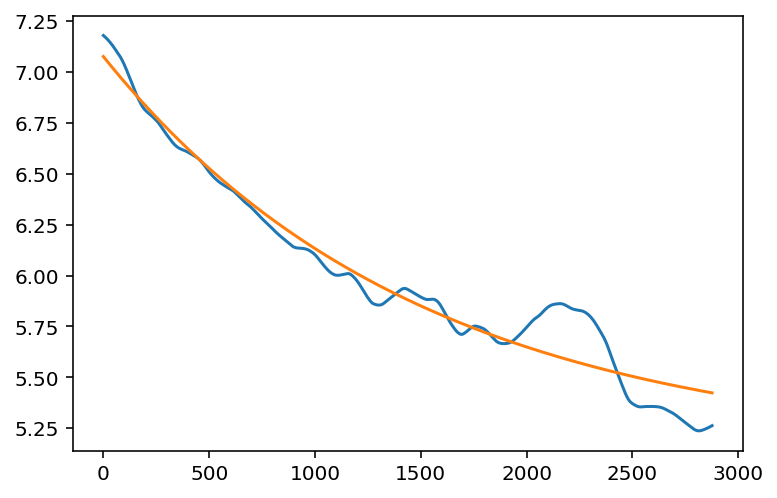

In [751]:
x = bleachingMovie.mean((1,2))
plt.plot(x)
plt.plot(decayfit(x))

In [743]:
detrendedMovie = filteredMovie-movie(.reshape(meanImg.shape))

In [701]:
pd.DataFrame(xx.T).shape

(16384, 5)

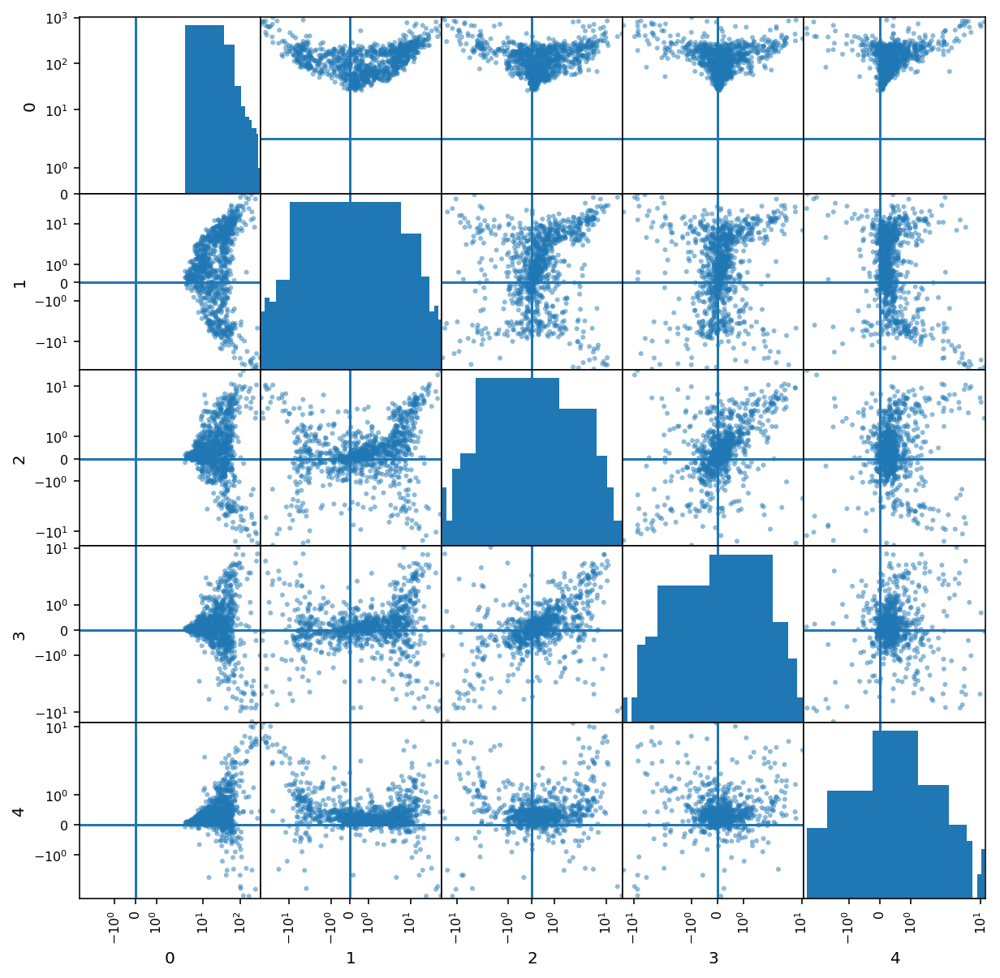

In [709]:
axs = pd.plotting.scatter_matrix(pd.DataFrame(xx[:,:1000].T), figsize=(10,10));
for ax in axs.flat:
    ax.axhline(0)
    ax.axvline(0)
    ax.set_xscale("symlog")
    ax.set_yscale("symlog")

In [698]:
xx.shape

(5, 16384)

In [681]:
xx.shape

(16384,)

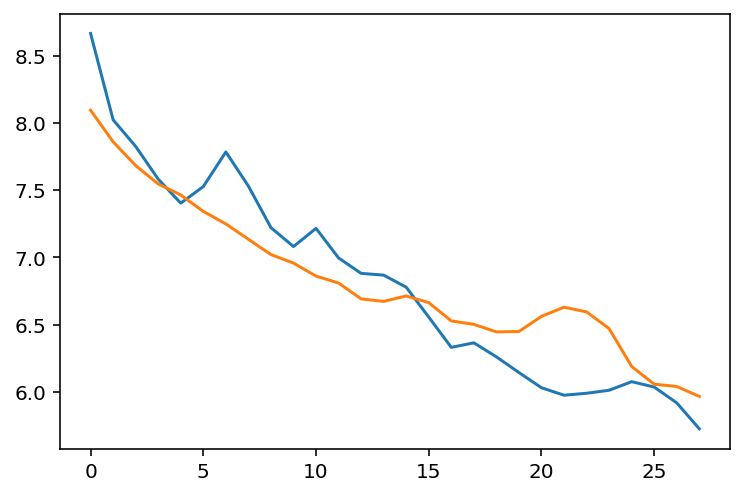

In [653]:
plt.plot(x)
plt.plot(x.dot(vects[0])*vects[0])

<BarContainer object of 28 artists>

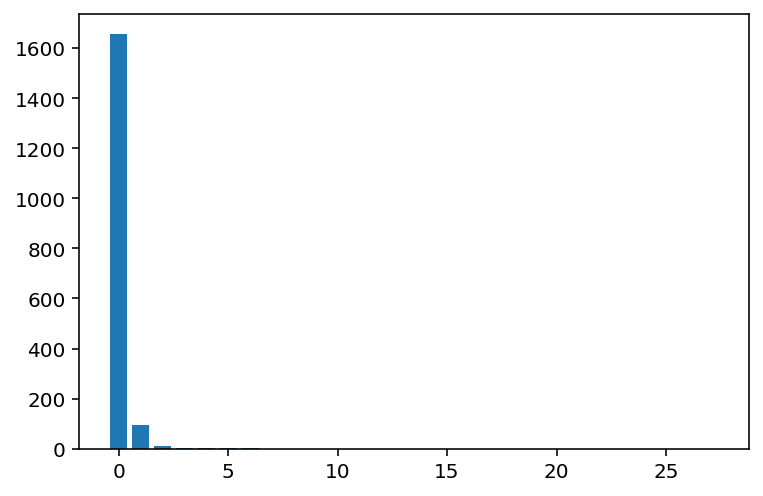

In [641]:
plt.bar(np.arange(len(vals)),vals)

In [1805]:
XT = ICAX.dot(vects.T).dot(np.diag(vals**(-0.5))).dot(vects)
print (XT.shape)
# del vals, vects, XT

(254, 60)


In [1806]:
ICA_Searches = {'filter':[],'convergence':[]}

In [1812]:
# %%capture
for i in range(30):
    w_filter, f = ICAsearch(XT,optF)
    ICA_Searches['filter']      += [w_filter]
    ICA_Searches['convergence'] += [f]

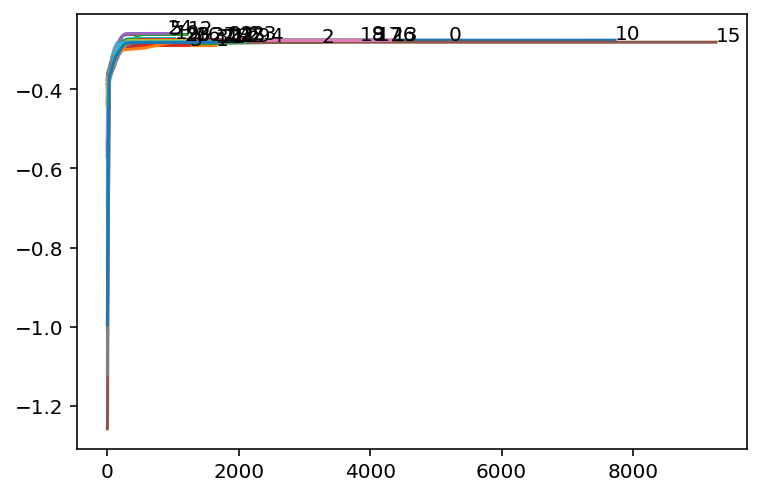

In [1813]:
for j,f in enumerate(ICA_Searches['convergence']):
    plt.plot(f, label=str(j))
    plt.text(len(f)+1,f[-1]+.001,str(j))

In [1814]:
ff = np.array(ICA_Searches['filter'])

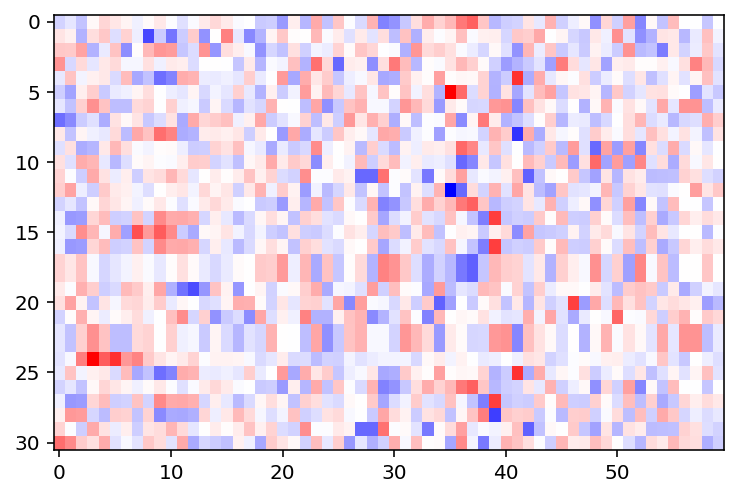

In [1815]:
plt.imshow(ff, cmap="bwr",vmin=-np.abs(ff).max(),vmax=np.abs(ff).max())
plt.gca().set_aspect("auto")

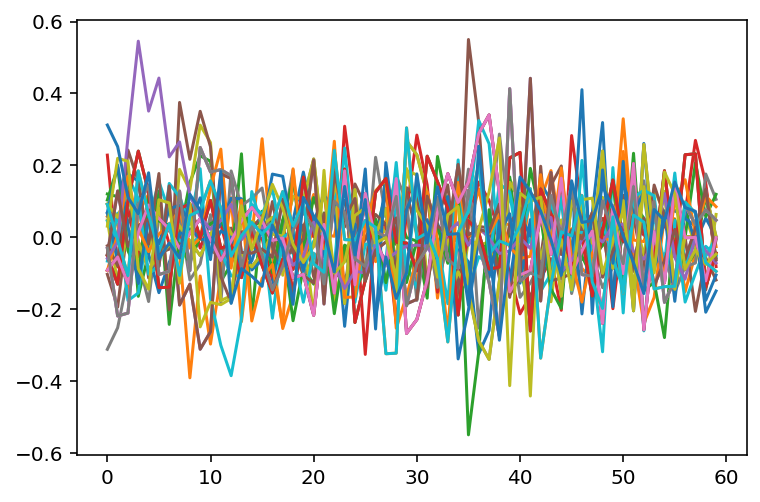

In [1816]:
for x in ff:
    plt.plot(x)